# The Heat Equation
- The model problem for the time-dependent PDE reads
$$
\begin{aligned}
\frac{\partial u}{\partial t} & =k(\mathbf{x},\omega)\nabla^2 u+f & & \text { in } \Omega \times(0, T], \\
u & =u_D=0 & & \text { in } \partial \Omega \times(0, T], \\
u & =u_0 & & \text { at } t=0 .
\end{aligned}
$$
- where
    - The variable $u$ is a function of both space and time, i.e., $u = u(\mathbf{x}, t)$, where the spatial domain is denoted by $\Omega(\mathbb{R}^{2})$.
    - The thermal diffusivity $\boldsymbol{x} \in \Omega=[-2,2] \times[-2,2]\subset \mathbb{R}^2$
    - The source function $f$ and boundary values $u_D$ may also vary with space and time.
    - The initial condition $u_0$ is defined in the spatial domain $\Omega(\mathbb{R}^{2})$.<br>

<br>

## Parameter Estimation Problem - Theory

Our uncertain paramater in this case is the thermal diffusivity $k(\mathbf{x})$.
Our observations consist of noisy observations of $u(x_j,t_i)$, that is, measurements of $u$ at locations $\{x_j\}_{j=1}^M$ in space and $\{t_i\}_{i=0}^{T}$ times.
Note that our parameter is now populated with noise that may be spatially varying and correlated.
Furthermore note that our uncertain parameter is now a function, and not just simple a point, so we need an effective way of parametrizing $k(\mathbf{x})$ for parameter estimation. 
This is where the KL expansion comes in


### The KL Expansion

We can describe $k(\boldsymbol{x})$ as a stochastic process, $K(\boldsymbol{x}, \omega)$, where $K$ is a function defined on the product
space $\boldsymbol{D} \times \Omega, \boldsymbol{x} \in \boldsymbol{D}$ is the index set of the location of the physical domain, and $\theta \in \Theta$ is
the sample space of the probability space, $(\Theta, \mathcal{F}, P)$.

Given a stochastic process $K(\boldsymbol{x}_{1}, \omega)$, with mean $\mu(\boldsymbol{x})$ and symmetric positive semi- 
definite covariance function $\boldsymbol{C}\left(\boldsymbol{x}_{1}, \boldsymbol{x}_{2}\right) \in \Omega \times \Omega \to 
\mathbb{R}$, the Mercer theorem states that $\boldsymbol{C}$ can be decomposed as:
$$
\boldsymbol{C}\left(\boldsymbol{x}_{1}, \boldsymbol{x}_{2}\right)=\sum_{j=1}^{\infty} \lambda_j \psi_j(\boldsymbol{x}) \psi_j\left(\boldsymbol{x}_{2}\right),
$$
where $\lambda_j>0$ are the eigenvalues of $\boldsymbol{C}$, and $\psi_j$ are the corresponding normalized eigenvectors. The eigenpairs satisfy the Fredholm equation of the second kind:
$$
\int_{\Omega} \boldsymbol{C}\left(\boldsymbol{x}_{1}, \boldsymbol{x}_{2}\right) \psi_j\left(\boldsymbol{x}_{2}\right) d \boldsymbol{x}_{2}=\lambda_j \psi_j(\boldsymbol{x}_{1}), \quad j=1,2, \ldots
$$
Sequencing the eigenvalues in decreasing order, any realization of $K$ can then be written as Ghanem and Spanos (2003)
$$
K(\boldsymbol{x}, \omega)=\mu(\boldsymbol{x})+\sum_{j=1}^{\infty} \sqrt{\lambda_j} \psi_j(\boldsymbol{x}) \xi_j(\omega) .
$$
The coordinate coefficients $\xi_j(\omega)$ can be deterministically computed by evaluating the integrals
$$
\xi_j(\omega)=\int(K(\boldsymbol{x}_{1}, \omega)-\mu(\boldsymbol{x})) \psi_j(\boldsymbol{x}) d \boldsymbol{x}
$$


### KL Expansion for Gaussian Processes

In our case, note $k(\mathbf{x})$ is a Gaussian process $(G P), \xi_j(\omega)$, i.e. it is a Gaussian-independent identically distributed random variables with zero mean and unit variance, such that $\mathbb{E}\left[\xi_j \xi_j^{\prime}\right]=$ $\delta_{j j^{\prime}}$.
The parameter field $K$ is then fully characterized by a set of coordinates $\xi_j$ 's given the eigenbasis is known.
By truncating the series givn above to retain the first few $K$ terms, the KL expansion efficiently approximates the highdimensional parameter field using a few dominant modes.
The size of the retained terms $K$ depends on the desired energy percentage to be retained by the $\mathrm{KL}$ expansion, which is defined as $\sum_{j=1}^K \lambda_j / \sum_{j=1}^{\infty} \lambda_j$.
In practice, it is preferable to choose $K$ such that the truncated $\mathrm{KL}$ expansion encapsulates as much information as possible with respect to its infinite counterpart.
Larger $K$ are required for prior covariance functions with smaller correlation lengths for the $\mathrm{KL}$ expansion to capture a similar information percentage.
There exist several strategies to set $K$ in practice.
For instance, for $\lambda_1 \geq \lambda_2 \geq \ldots$, one can control the representation error on $K$ by selecting $K$ such that $\lambda_K<c \lambda_1$ or $\sum_{j=1}^K \lambda_j \leq c \sum_{j=1}^{\infty} \lambda_j$ for some truncation parameter $c \ll 1$

### Creating the Covariance Matrix

The one thing remaining is to determine the Covariance function $C(x_1, x_2)$ for determining the modes of our KL basis.
The covariance function encodes how correlated spatially we expect our function values to be.
A common kernel used as a Covariance function is based off a square exponential function.

The square exponential kernel function can be represented mathematically as:

$$C(x_i, x_j) = \exp \left( -\frac{1}{2} \sum_{d=1}^{D} \left(\frac{x_{i,d} - x_{j,d}}{\ell_d}\right)^2\right)$$

where $x_i$ and $x_j$ are two $D$-dimensional input vectors, $\ell_d$ is the length scale for dimension $d$ and $\alpha=2$ is a constant.
The covariance matrix, $C$, can be constructed by evaluating this kernel function for each pair of input points and multiplying byhe $\sigma^2$:

$$ C_{i,j} = \sigma^2 * C(x_i, x_j) $$

Note the standard deviation can be specified to be constant over the whole grid, or can be the same size of the grid and specified cell wise. 
The $\sigma$ set should be related to the expected measurement noise in the observation operator.
Note furthermore the importance of the length scale parameters $\ell_d$. 
They in a sense define how smooth we believe our kernel to be.
The large $\ell_d$, the more square exponential kernel will smooth the sum of the different components over the space since they will overlap more.
The smaller the $\ell_d$, the rougher the field we want to represent.

## Initial Conditions

- First Initial Condition: 
$$\exp\left[-\frac{1}{2} \left(\left(\frac{\boldsymbol{x}_{0}-0.01}{5}\right)^{2} + \left(\frac{\boldsymbol{x}_{1}-0.01}{5}\right)^{2} \right) \right]$$
- Second Inital Condition:
$$2* \exp\left[-0.1\left( \left(\boldsymbol{x}_{0}-1.0\right)^{2} + \left(\boldsymbol{x}_{1}-1.0\right)^{2} \right) \right]$$

# Spatially and time varying forcing function

In [22]:
from pydci.examples.heat_model import HeatModel
import numpy as np
import matplotlib.pyplot as plt
from IPython.display import Image
import importlib

from pydci import OnlineSequential
from pydci.log import enable_log, disable_log
from pydci.utils import get_df, set_seed

# Create initial condition
def initial_condition(x, a=5):
    return np.exp(-a * (x[0] ** 2 + x[1] ** 2))

class ForcingFunction:
    def __init__(self):
        self.t = 0.0

    def eval(self, x):
        # Added some spatial variation here. Expression is sin(t)*x
        return np.full(
            x.shape[1],
            (2*np.sin(6 * np.pi * self.t) * x[0]
            + 3*np.cos(4 * np.pi * self.t) * x[1]),
        )

num_modes = 10
set_seed(2023)
enable_log(level="DEBUG")
heat_model_args = dict(
    x0=initial_condition,
    measurement_noise=0.02,
    solve_ts=0.0001,
    sample_ts=0.05,
    nx=50,
    ny=50,
    mean=1.0,
    std_dev=0.2,
    length_scales=[0.1, 0.1],
    nmodes=num_modes,
    true_k_x=None,
    max_states=500,
    forcing_expression=ForcingFunction(),
)

[08/16/23 15:18:31] INFO     Logger initialized                                                           ]8;id=8153;file:///Users/carlos/repos/pyDCI/src/pydci/log.py\log.py]8;;\:]8;id=618523;file:///Users/carlos/repos/pyDCI/src/pydci/log.py#87\87]8;;\

In [23]:
hm = HeatModel(**heat_model_args)
hm.lam_true

[08/16/23 15:18:33] DEBUG    Setting up simulation                                                 ]8;id=571850;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=441688;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#99\99]8;;\

[08/16/23 15:18:38] DEBUG    State idxs set at 500 of 2601 total indices                               ]8;id=35674;file:///Users/carlos/repos/pyDCI/src/pydci/Model.py\Model.py]8;;\:]8;id=256702;file:///Users/carlos/repos/pyDCI/src/pydci/Model.py#100\100]8;;\

array([ 0.71167353, -0.32448496, -1.00187064,  0.23625079, -0.10215984,
       -1.14129263,  2.65440726,  1.44060519,  0.09890227, -3.12153215])

Text(0.5, 1.0, 'True Field $k(x)$')

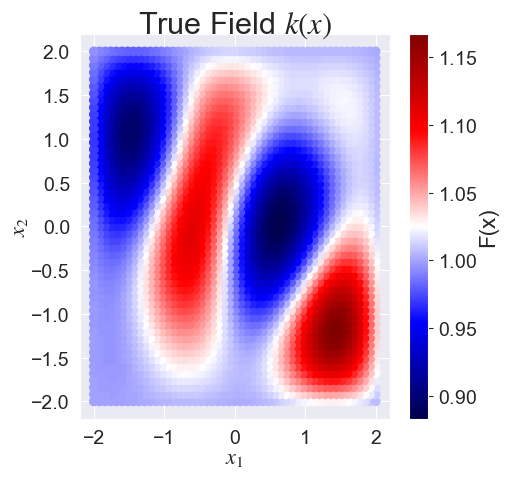

In [24]:
fig, ax = plt.subplots(1, 1, figsize=(5, 5))
hm.plot_field(ax=ax, title='True field')
ax.set_title('True Field $k(x)$')

## Visualzing Solution Over full time

In [7]:
hm_full = HeatModel(**heat_model_args)
hm_full.get_data(tf=3.0)

[08/16/23 15:02:16] DEBUG    Setting up simulation                                                 ]8;id=717713;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=926848;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#99\99]8;;\

[08/16/23 15:02:21] DEBUG    State idxs set at 500 of 2601 total indices                               ]8;id=701350;file:///Users/carlos/repos/pyDCI/src/pydci/Model.py\Model.py]8;;\:]8;id=191301;file:///Users/carlos/repos/pyDCI/src/pydci/Model.py#100\100]8;;\

                    INFO     Getting data for model from 0.0 to 3.0                                    ]8;id=737899;file:///Users/carlos/repos/pyDCI/src/pydci/Model.py\Model.py]8;;\:]8;id=996020;file:///Users/carlos/repos/pyDCI/src/pydci/Model.py#389\389]8;;\

                    DEBUG    Constructing k_x field                                               ]8;id=97231;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=373435;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#260\260]8;;\

                    DEBUG    Assembling bilinear form                                             ]8;id=491856;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=301341;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#266\266]8;;\

                    DEBUG    Assembling linear form                                               ]8;id=132927;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=306589;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#276\276]8;;\

                    DEBUG    Initializing solver                                                  ]8;id=646859;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=972161;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#291\291]8;;\

[08/16/23 15:02:55] DEBUG    Shapes: (30000, 500), (30000, 2601), (30000,)                             ]8;id=346665;file:///Users/carlos/repos/pyDCI/src/pydci/Model.py\Model.py]8;;\:]8;id=42991;file:///Users/carlos/repos/pyDCI/src/pydci/Model.py#404\404]8;;\

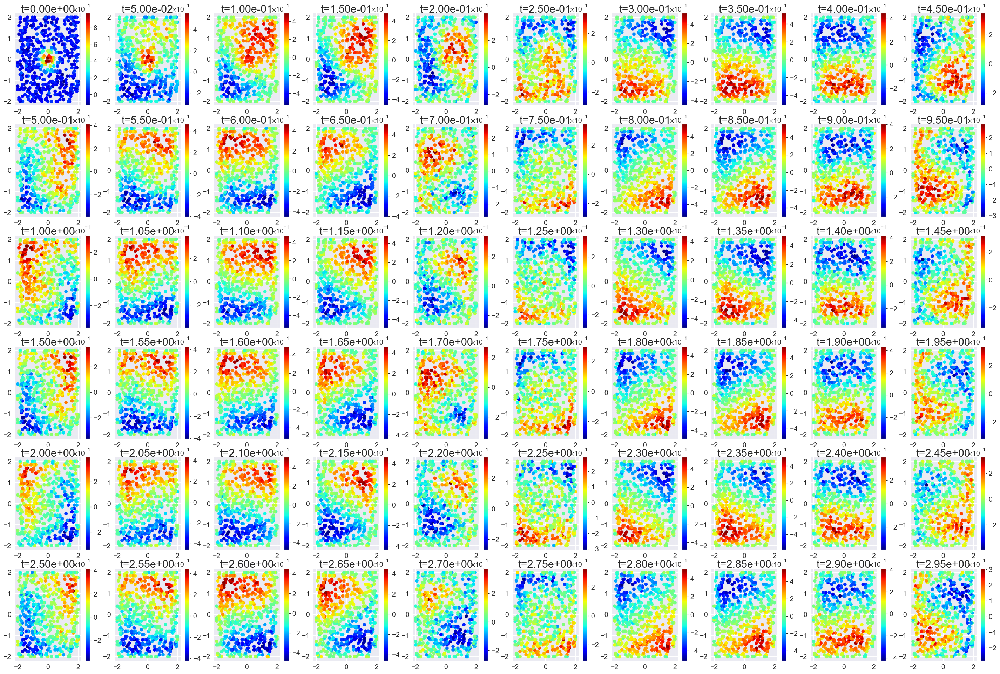

In [8]:
n_obs = hm_full.data[-1]['sample_flag'].sum()
hm_full.plot_obs_state(idxs=range(0, int(n_obs-1)))

### Visualizing using pyvista

In [9]:
snapshots = hm_full.take_snaps(hm_full.data[-1], sample_ts=0.005)
hm_full.output_gif(snapshots, gif_name="./u_time_forced_true.gif")
Image(url="./u_time_forced_true.gif")

|███████████████████████████████████████▉⚠︎ (!) 599/600 [100%] in 47.9s (12.49/s)                                        


In [17]:
import pandas as pd
from pydci.utils import add_noise 

def take_snaps(self, data_df, sample_ts=0.01, noise=False):
    """
    Take snapshots of data at a given time interval.
    Snapshots consist of data frame with columns t_{i} for
    each time step to be ploted, and each row being a specific
    index in the grid.
    """
    remainder = data_df["ts"] % sample_ts

    # Select rows where the remainder is close to zero (within a small tolerance)
    data = data_df[remainder < 1e-4]
    times = [f"t_{i}" for i, t in enumerate(data["ts"])]
    true_cols = [col for col in data.columns if col.startswith("q_lam_true")]
    data = data[true_cols].values.T
    d_shape = data.shape

    if noise:
        data = np.reshape(
            add_noise(
                data.ravel(),
                self.measurement_noise,
            ),
            d_shape,
        )

    return pd.DataFrame(data, columns=times)

hm_full.measurement_noise = 0.02
snapshots = take_snaps(hm_full, hm_full.data[-1], sample_ts=0.005, noise=True)
hm_full.output_gif(snapshots, gif_name="./u_time_forced_true_noisy.gif")
Image(url="./u_time_forced_true_noisy.gif")

|███████████████████████████████████████▉⚠︎ (!) 599/600 [100%] in 52.3s (11.46/s)                                        


# Parameter Estimation Problem

In [4]:
enable_log(level='DEBUG')
prob = OnlineSequential(
    HeatModel(**heat_model_args),
    time_step=0.5,
)
prob.solve(
    num_its=1,
    max_t=None,
    num_samples=50,
    max_sample_size=200,
    samples_inc=50,
    time_step=0.5,
    exp_thresh=0.25,
    kl_thresh=3.0,
    min_eff_sample_size=0.9,
    num_tries_per_it=2,
    sampling_args={
        "dist": "normal",
        "mean": 0.0,
        "std_dev": 1.0,
    },
    solver_args=dict(
        pca_range=range(1, 3),
        split_range=range(1, 10),
        best_method="max_kl",
        all_data=True,
    ),
    make_plots=False,
    reset_model=False,
    reset_samples=False,
)
prob.probs[-1].results

[08/16/23 14:45:30] INFO     Logger initialized                                                           ]8;id=691298;file:///Users/carlos/repos/pyDCI/src/pydci/log.py\log.py]8;;\:]8;id=38910;file:///Users/carlos/repos/pyDCI/src/pydci/log.py#87\87]8;;\

                    INFO     No previous data -> Starting from initial                      ]8;id=613542;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OnlineSequential.py\OnlineSequential.py]8;;\:]8;id=28016;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OnlineSequential.py#610\610]8;;\

                    DEBUG    make_plots: False                                              ]8;id=915752;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OnlineSequential.py\OnlineSequential.py]8;;\:]8;id=293292;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OnlineSequential.py#648\648]8;;\

                    INFO     Starting online solve with 50 samples at data chunk 0          ]8;id=227420;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OnlineSequential.py\OnlineSequential.py]8;;\:]8;id=385481;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OnlineSequential.py#653\653]8;;\

                    DEBUG    Getting measurements over time window 0 to 0.5                 ]8;id=73682;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OnlineSequential.py\OnlineSequential.py]8;;\:]8;id=239816;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OnlineSequential.py#658\658]8;;\

                    INFO     Getting data for model from 0.0 to 0.5                                    ]8;id=304883;file:///Users/carlos/repos/pyDCI/src/pydci/Model.py\Model.py]8;;\:]8;id=585960;file:///Users/carlos/repos/pyDCI/src/pydci/Model.py#389\389]8;;\

                    DEBUG    Constructing k_x field                                               ]8;id=646280;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=303240;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#260\260]8;;\

                    DEBUG    Assembling bilinear form                                             ]8;id=484783;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=450964;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#266\266]8;;\

                    DEBUG    Assembling linear form                                               ]8;id=259130;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=20772;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#276\276]8;;\

                    DEBUG    Initializing solver                                                  ]8;id=518060;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=598131;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#291\291]8;;\

[08/16/23 14:45:40] DEBUG    Shapes: (5000, 500), (5000, 2601), (5000,)                                ]8;id=534583;file:///Users/carlos/repos/pyDCI/src/pydci/Model.py\Model.py]8;;\:]8;id=990879;file:///Users/carlos/repos/pyDCI/src/pydci/Model.py#404\404]8;;\

                    DEBUG    Starting solves for iteration 0                                ]8;id=475805;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OnlineSequential.py\OnlineSequential.py]8;;\:]8;id=425512;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OnlineSequential.py#670\670]8;;\

                    DEBUG    Max sample size: 200, samples_inc: 50                          ]8;id=779937;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OnlineSequential.py\OnlineSequential.py]8;;\:]8;id=815437;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OnlineSequential.py#439\439]8;;\

                    INFO     Starting from initial Reset:False, Data_Idx: 0                 ]8;id=370230;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OnlineSequential.py\OnlineSequential.py]8;;\:]8;id=293556;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OnlineSequential.py#493\493]8;;\
                             Sampling Args: {'dist': 'normal', 'mean': 0.0, 'std_dev': 1.0}                        
                             Solver Args: {'pca_range': range(1, 3), 'split_range':                                
                             range(1, 10), 'best_method': 'max_kl', 'all_data': True}                              

                    INFO     Drawing 50 from multivariate normal at:                                   ]8;id=136477;file:///Users/carlos/repos/pyDCI/src/pydci/Model.py\Model.py]8;;\:]8;id=858613;file:///Users/carlos/repos/pyDCI/src/pydci/Model.py#597\597]8;;\
                                     mean: 0.0                                                                     
                                     std_dev: 1.0                                                                  

                    INFO     Advancing forward model for 50 samples                         ]8;id=236130;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OnlineSequential.py\OnlineSequential.py]8;;\:]8;id=385284;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OnlineSequential.py#503\503]8;;\

[08/16/23 14:45:41] INFO     Beginning forward solve from 0.0 to 0.5                                   ]8;id=102813;file:///Users/carlos/repos/pyDCI/src/pydci/Model.py\Model.py]8;;\:]8;id=355514;file:///Users/carlos/repos/pyDCI/src/pydci/Model.py#457\457]8;;\

                    DEBUG    Starting fresh simulation for 50                                          ]8;id=903639;file:///Users/carlos/repos/pyDCI/src/pydci/Model.py\Model.py]8;;\:]8;id=205789;file:///Users/carlos/repos/pyDCI/src/pydci/Model.py#469\469]8;;\

                    DEBUG    Constructing k_x field                                               ]8;id=81394;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=750491;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#260\260]8;;\

Solving model sample set: |                    | ▁▃▅ 0/50 [0%] in 0s (~0s, 0.0/s) 

                    DEBUG    Assembling bilinear form                                             ]8;id=734191;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=850852;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#266\266]8;;\

                    DEBUG    Assembling linear form                                               ]8;id=905301;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=986058;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#276\276]8;;\

                    DEBUG    Initializing solver                                                  ]8;id=639857;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=493759;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#291\291]8;;\

Solving model sample set: |                    | ▃▁▃ 0/50 [0%] in 10s (~0s, 0.0/s) 

[08/16/23 14:45:50] DEBUG    Constructing k_x field                                               ]8;id=827590;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=342709;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#260\260]8;;\

                    DEBUG    Assembling bilinear form                                             ]8;id=863160;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=744097;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#266\266]8;;\

                    DEBUG    Assembling linear form                                               ]8;id=989376;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=28973;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#276\276]8;;\

                    DEBUG    Initializing solver                                                  ]8;id=136482;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=682867;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#291\291]8;;\

Solving model sample set: |▍                   | ▆█▆ 1/50 [2%] in 19s (~13:52, 0.1/s) 

[08/16/23 14:46:00] DEBUG    Constructing k_x field                                               ]8;id=422232;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=9278;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#260\260]8;;\

                    DEBUG    Assembling bilinear form                                             ]8;id=677304;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=482861;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#266\266]8;;\

                    DEBUG    Assembling linear form                                               ]8;id=631155;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=660711;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#276\276]8;;\

                    DEBUG    Initializing solver                                                  ]8;id=418671;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=917038;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#291\291]8;;\

Solving model sample set: |▊                   | ▅▃▁ 2/50 [4%] in 27s (~10:13, 0.1/s)                                   

[08/16/23 14:46:08] DEBUG    Constructing k_x field                                               ]8;id=659486;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=54010;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#260\260]8;;\

                    DEBUG    Assembling bilinear form                                             ]8;id=353869;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=829534;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#266\266]8;;\

                    DEBUG    Assembling linear form                                               ]8;id=886214;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=720707;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#276\276]8;;\

                    DEBUG    Initializing solver                                                  ]8;id=12886;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=616670;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#291\291]8;;\

Solving model sample set: |█▎                  | ▆█▆ 3/50 [6%] in 37s (~9:19, 0.1/s)                                    

[08/16/23 14:46:18] DEBUG    Constructing k_x field                                               ]8;id=715166;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=640663;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#260\260]8;;\

                    DEBUG    Assembling bilinear form                                             ]8;id=465265;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=357724;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#266\266]8;;\

                    DEBUG    Assembling linear form                                               ]8;id=422067;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=465770;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#276\276]8;;\

                    DEBUG    Initializing solver                                                  ]8;id=537247;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=699893;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#291\291]8;;\

Solving model sample set: |█▋                  | ▂▂▄ 4/50 [8%] in 47s (~8:40, 0.1/s) 

[08/16/23 14:46:28] DEBUG    Constructing k_x field                                               ]8;id=918511;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=39974;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#260\260]8;;\

                    DEBUG    Assembling bilinear form                                             ]8;id=723089;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=52142;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#266\266]8;;\

                    DEBUG    Assembling linear form                                               ]8;id=927421;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=631167;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#276\276]8;;\

                    DEBUG    Initializing solver                                                  ]8;id=828219;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=786662;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#291\291]8;;\

Solving model sample set: |██                  | ▇▅▃ 5/50 [10%] in 57s (~8:17, 0.1/s) 

[08/16/23 14:46:38] DEBUG    Constructing k_x field                                               ]8;id=675032;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=497840;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#260\260]8;;\

                    DEBUG    Assembling bilinear form                                             ]8;id=564812;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=34307;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#266\266]8;;\

                    DEBUG    Assembling linear form                                               ]8;id=205258;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=981269;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#276\276]8;;\

                    DEBUG    Initializing solver                                                  ]8;id=672266;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=994474;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#291\291]8;;\

Solving model sample set: |██▍                 | ▃▅▇ 6/50 [12%] in 1:06 (~7:55, 0.1/s) 

[08/16/23 14:46:47] DEBUG    Constructing k_x field                                               ]8;id=614917;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=87351;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#260\260]8;;\

                    DEBUG    Assembling bilinear form                                             ]8;id=412516;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=192764;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#266\266]8;;\

                    DEBUG    Assembling linear form                                               ]8;id=527242;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=921630;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#276\276]8;;\

                    DEBUG    Initializing solver                                                  ]8;id=409721;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=418468;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#291\291]8;;\

Solving model sample set: |██▊                 | ▇▅▃ 7/50 [14%] in 1:15 (~7:30, 0.1/s) 

[08/16/23 14:46:56] DEBUG    Constructing k_x field                                               ]8;id=170024;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=936745;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#260\260]8;;\

                    DEBUG    Assembling bilinear form                                             ]8;id=52311;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=675096;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#266\266]8;;\

                    DEBUG    Assembling linear form                                               ]8;id=310420;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=521294;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#276\276]8;;\

                    DEBUG    Initializing solver                                                  ]8;id=537562;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=337355;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#291\291]8;;\

Solving model sample set: |███▎                | ▆█▆ 8/50 [16%] in 1:26 (~7:22, 0.1/s) 

[08/16/23 14:47:07] DEBUG    Constructing k_x field                                               ]8;id=294406;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=183407;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#260\260]8;;\

                    DEBUG    Assembling bilinear form                                             ]8;id=424481;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=239952;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#266\266]8;;\

                    DEBUG    Assembling linear form                                               ]8;id=929350;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=105265;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#276\276]8;;\

                    DEBUG    Initializing solver                                                  ]8;id=241019;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=326618;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#291\291]8;;\

Solving model sample set: |███▋                | ▄▂▂ 9/50 [18%] in 1:34 (~7:03, 0.1/s) 

[08/16/23 14:47:15] DEBUG    Constructing k_x field                                               ]8;id=164048;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=54493;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#260\260]8;;\

                    DEBUG    Assembling bilinear form                                             ]8;id=906357;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=467521;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#266\266]8;;\

                    DEBUG    Assembling linear form                                               ]8;id=667116;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=154738;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#276\276]8;;\

                    DEBUG    Initializing solver                                                  ]8;id=288578;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=907920;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#291\291]8;;\

Solving model sample set: |████                | ▆█▆ 10/50 [20%] in 1:44 (~6:49, 0.1/s) 

[08/16/23 14:47:25] DEBUG    Constructing k_x field                                               ]8;id=376771;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=192260;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#260\260]8;;\

                    DEBUG    Assembling bilinear form                                             ]8;id=981807;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=482436;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#266\266]8;;\

                    DEBUG    Assembling linear form                                               ]8;id=360450;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=904010;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#276\276]8;;\

                    DEBUG    Initializing solver                                                  ]8;id=710724;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=227559;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#291\291]8;;\

Solving model sample set: |████▍               | ▂▂▄ 11/50 [22%] in 1:53 (~6:36, 0.1/s) 

[08/16/23 14:47:34] DEBUG    Constructing k_x field                                               ]8;id=673979;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=844733;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#260\260]8;;\

                    DEBUG    Assembling bilinear form                                             ]8;id=686849;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=407359;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#266\266]8;;\

                    DEBUG    Assembling linear form                                               ]8;id=151432;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=524190;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#276\276]8;;\

                    DEBUG    Initializing solver                                                  ]8;id=738672;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=671037;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#291\291]8;;\

Solving model sample set: |████▊               | ▇▇▅ 12/50 [24%] in 2:02 (~6:22, 0.1/s) 

[08/16/23 14:47:43] DEBUG    Constructing k_x field                                               ]8;id=581084;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=11690;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#260\260]8;;\

                    DEBUG    Assembling bilinear form                                             ]8;id=484320;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=698654;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#266\266]8;;\

                    DEBUG    Assembling linear form                                               ]8;id=49855;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=210812;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#276\276]8;;\

                    DEBUG    Initializing solver                                                  ]8;id=444899;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=306819;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#291\291]8;;\

Solving model sample set: |█████▎              | ▂▂▄ 13/50 [26%] in 2:11 (~6:09, 0.1/s) 

[08/16/23 14:47:52] DEBUG    Constructing k_x field                                               ]8;id=15790;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=532807;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#260\260]8;;\

                    DEBUG    Assembling bilinear form                                             ]8;id=897966;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=621717;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#266\266]8;;\

                    DEBUG    Assembling linear form                                               ]8;id=744851;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=948327;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#276\276]8;;\

                    DEBUG    Initializing solver                                                  ]8;id=647751;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=614514;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#291\291]8;;\

Solving model sample set: |█████▋              | ▆█▆ 14/50 [28%] in 2:20 (~5:55, 0.1/s) 

[08/16/23 14:48:01] DEBUG    Constructing k_x field                                               ]8;id=631332;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=349617;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#260\260]8;;\

                    DEBUG    Assembling bilinear form                                             ]8;id=355614;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=751253;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#266\266]8;;\

                    DEBUG    Assembling linear form                                               ]8;id=739507;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=887249;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#276\276]8;;\

                    DEBUG    Initializing solver                                                  ]8;id=723496;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=934678;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#291\291]8;;\

Solving model sample set: |██████              | ▄▂▂ 15/50 [30%] in 2:28 (~5:43, 0.1/s) 

[08/16/23 14:48:09] DEBUG    Constructing k_x field                                               ]8;id=205298;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=241749;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#260\260]8;;\

                    DEBUG    Assembling bilinear form                                             ]8;id=492897;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=422898;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#266\266]8;;\

                    DEBUG    Assembling linear form                                               ]8;id=676174;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=907184;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#276\276]8;;\

                    DEBUG    Initializing solver                                                  ]8;id=585158;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=627803;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#291\291]8;;\

Solving model sample set: |██████▍             | ▄▆█ 16/50 [32%] in 2:37 (~5:30, 0.1/s) 

[08/16/23 14:48:18] DEBUG    Constructing k_x field                                               ]8;id=40664;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=621164;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#260\260]8;;\

                    DEBUG    Assembling bilinear form                                             ]8;id=609043;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=416282;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#266\266]8;;\

                    DEBUG    Assembling linear form                                               ]8;id=248299;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=223374;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#276\276]8;;\

                    DEBUG    Initializing solver                                                  ]8;id=77254;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=644465;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#291\291]8;;\

Solving model sample set: |██████▊             | ▃▁▃ 17/50 [34%] in 2:47 (~5:21, 0.1/s) 

[08/16/23 14:48:28] DEBUG    Constructing k_x field                                               ]8;id=291030;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=324917;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#260\260]8;;\

                    DEBUG    Assembling bilinear form                                             ]8;id=525235;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=255631;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#266\266]8;;\

                    DEBUG    Assembling linear form                                               ]8;id=370642;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=134718;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#276\276]8;;\

                    DEBUG    Initializing solver                                                  ]8;id=64475;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=348489;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#291\291]8;;\

Solving model sample set: |███████▎            | ▇▅▃ 18/50 [36%] in 2:57 (~5:12, 0.1/s) 

[08/16/23 14:48:38] DEBUG    Constructing k_x field                                               ]8;id=654607;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=57540;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#260\260]8;;\

                    DEBUG    Assembling bilinear form                                             ]8;id=54703;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=696382;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#266\266]8;;\

                    DEBUG    Assembling linear form                                               ]8;id=899184;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=484692;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#276\276]8;;\

                    DEBUG    Initializing solver                                                  ]8;id=996229;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=4726;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#291\291]8;;\

Solving model sample set: |███████▋            | ▃▅▇ 19/50 [38%] in 3:06 (~5:02, 0.1/s) 

[08/16/23 14:48:47] DEBUG    Constructing k_x field                                               ]8;id=378403;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=163853;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#260\260]8;;\

                    DEBUG    Assembling bilinear form                                             ]8;id=325756;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=239450;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#266\266]8;;\

                    DEBUG    Assembling linear form                                               ]8;id=869479;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=526879;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#276\276]8;;\

                    DEBUG    Initializing solver                                                  ]8;id=748470;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=109656;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#291\291]8;;\

Solving model sample set: |████████            | ▂▂▄ 20/50 [40%] in 3:17 (~4:54, 0.1/s) 

[08/16/23 14:48:58] DEBUG    Constructing k_x field                                               ]8;id=304481;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=309970;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#260\260]8;;\

                    DEBUG    Assembling bilinear form                                             ]8;id=230153;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=565280;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#266\266]8;;\

                    DEBUG    Assembling linear form                                               ]8;id=766224;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=558604;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#276\276]8;;\

                    DEBUG    Initializing solver                                                  ]8;id=389411;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=297963;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#291\291]8;;\

Solving model sample set: |████████▍           | ▆▄▂ 21/50 [42%] in 3:28 (~4:45, 0.1/s) 

[08/16/23 14:49:08] DEBUG    Constructing k_x field                                               ]8;id=257549;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=606936;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#260\260]8;;\

                    DEBUG    Assembling bilinear form                                             ]8;id=554527;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=1965;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#266\266]8;;\

                    DEBUG    Assembling linear form                                               ]8;id=614850;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=590652;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#276\276]8;;\

                    DEBUG    Initializing solver                                                  ]8;id=838791;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=167720;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#291\291]8;;\

Solving model sample set: |████████▊           | ▄▆█ 22/50 [44%] in 3:37 (~4:34, 0.1/s) 

[08/16/23 14:49:18] DEBUG    Constructing k_x field                                               ]8;id=461019;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=134853;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#260\260]8;;\

                    DEBUG    Assembling bilinear form                                             ]8;id=464964;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=459641;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#266\266]8;;\

                    DEBUG    Assembling linear form                                               ]8;id=297078;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=547983;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#276\276]8;;\

                    DEBUG    Initializing solver                                                  ]8;id=105125;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=552510;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#291\291]8;;\

Solving model sample set: |█████████▎          | ▃▁▃ 23/50 [46%] in 3:47 (~4:25, 0.1/s) 

[08/16/23 14:49:28] DEBUG    Constructing k_x field                                               ]8;id=800880;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=662460;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#260\260]8;;\

                    DEBUG    Assembling bilinear form                                             ]8;id=161224;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=559577;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#266\266]8;;\

                    DEBUG    Assembling linear form                                               ]8;id=4486;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=120001;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#276\276]8;;\

                    DEBUG    Initializing solver                                                  ]8;id=883866;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=147323;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#291\291]8;;\

Solving model sample set: |█████████▋          | ▇▇▅ 24/50 [48%] in 3:56 (~4:14, 0.1/s) 

[08/16/23 14:49:37] DEBUG    Constructing k_x field                                               ]8;id=77656;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=967265;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#260\260]8;;\

                    DEBUG    Assembling bilinear form                                             ]8;id=204947;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=580865;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#266\266]8;;\

                    DEBUG    Assembling linear form                                               ]8;id=658531;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=407171;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#276\276]8;;\

                    DEBUG    Initializing solver                                                  ]8;id=412941;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=726653;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#291\291]8;;\

Solving model sample set: |██████████          | ▁▃▅ 25/50 [50%] in 4:06 (~4:04, 0.1/s) 

[08/16/23 14:49:47] DEBUG    Constructing k_x field                                               ]8;id=823030;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=212588;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#260\260]8;;\

                    DEBUG    Assembling bilinear form                                             ]8;id=696089;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=675612;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#266\266]8;;\

                    DEBUG    Assembling linear form                                               ]8;id=942152;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=426522;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#276\276]8;;\

Solving model sample set: |██████████▍         | ▂▄▆ 26/50 [52%] in 4:06 (~3:58, 0.1/s) 

                    DEBUG    Initializing solver                                                  ]8;id=250021;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=658543;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#291\291]8;;\

Solving model sample set: |██████████▍         | ▇▅▃ 26/50 [52%] in 4:15 (~3:54, 0.1/s) 

[08/16/23 14:49:56] DEBUG    Constructing k_x field                                               ]8;id=942864;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=275603;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#260\260]8;;\

                    DEBUG    Assembling bilinear form                                             ]8;id=221202;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=470036;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#266\266]8;;\

                    DEBUG    Assembling linear form                                               ]8;id=281700;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=22761;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#276\276]8;;\

                    DEBUG    Initializing solver                                                  ]8;id=459307;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=410157;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#291\291]8;;\

Solving model sample set: |██████████▊         | ▂▄▆ 27/50 [54%] in 4:24 (~3:44, 0.1/s) 

[08/16/23 14:50:05] DEBUG    Constructing k_x field                                               ]8;id=895546;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=838748;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#260\260]8;;\

                    DEBUG    Assembling bilinear form                                             ]8;id=123521;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=202820;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#266\266]8;;\

                    DEBUG    Assembling linear form                                               ]8;id=459676;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=356478;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#276\276]8;;\

                    DEBUG    Initializing solver                                                  ]8;id=332180;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=201485;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#291\291]8;;\

Solving model sample set: |███████████▎        | ▆▄▂ 28/50 [56%] in 4:34 (~3:34, 0.1/s) 

[08/16/23 14:50:14] DEBUG    Constructing k_x field                                               ]8;id=994111;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=313783;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#260\260]8;;\

                    DEBUG    Assembling bilinear form                                             ]8;id=713906;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=389616;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#266\266]8;;\

                    DEBUG    Assembling linear form                                               ]8;id=924450;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=843054;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#276\276]8;;\

                    DEBUG    Initializing solver                                                  ]8;id=209208;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=137230;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#291\291]8;;\

Solving model sample set: |███████████▋        | ▅▇▇ 29/50 [58%] in 4:43 (~3:24, 0.1/s) 

[08/16/23 14:50:24] DEBUG    Constructing k_x field                                               ]8;id=86495;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=237969;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#260\260]8;;\

                    DEBUG    Assembling bilinear form                                             ]8;id=165792;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=270184;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#266\266]8;;\

                    DEBUG    Assembling linear form                                               ]8;id=744354;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=99980;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#276\276]8;;\

                    DEBUG    Initializing solver                                                  ]8;id=405469;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=960542;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#291\291]8;;\

Solving model sample set: |████████████        | ▃▁▃ 30/50 [60%] in 4:53 (~3:14, 0.1/s) 

[08/16/23 14:50:34] DEBUG    Constructing k_x field                                               ]8;id=610179;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=757686;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#260\260]8;;\

                    DEBUG    Assembling bilinear form                                             ]8;id=85336;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=797661;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#266\266]8;;\

                    DEBUG    Assembling linear form                                               ]8;id=245865;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=960281;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#276\276]8;;\

                    DEBUG    Initializing solver                                                  ]8;id=396296;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=433852;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#291\291]8;;\

Solving model sample set: |████████████▍       | ▆█▆ 31/50 [62%] in 5:02 (~3:04, 0.1/s) 

[08/16/23 14:50:43] DEBUG    Constructing k_x field                                               ]8;id=313631;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=55831;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#260\260]8;;\

                    DEBUG    Assembling bilinear form                                             ]8;id=240285;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=188248;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#266\266]8;;\

                    DEBUG    Assembling linear form                                               ]8;id=418298;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=924284;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#276\276]8;;\

                    DEBUG    Initializing solver                                                  ]8;id=288851;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=70763;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#291\291]8;;\

Solving model sample set: |████████████▊       | ▃▁▃ 32/50 [64%] in 5:11 (~2:54, 0.1/s) 

[08/16/23 14:50:52] DEBUG    Constructing k_x field                                               ]8;id=743769;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=999634;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#260\260]8;;\

                    DEBUG    Assembling bilinear form                                             ]8;id=985814;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=139245;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#266\266]8;;\

                    DEBUG    Assembling linear form                                               ]8;id=651833;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=777029;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#276\276]8;;\

                    DEBUG    Initializing solver                                                  ]8;id=35698;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=577214;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#291\291]8;;\

Solving model sample set: |█████████████▎      | ▆█▆ 33/50 [66%] in 5:20 (~2:44, 0.1/s) 

[08/16/23 14:51:01] DEBUG    Constructing k_x field                                               ]8;id=545779;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=53274;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#260\260]8;;\

                    DEBUG    Assembling bilinear form                                             ]8;id=475362;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=255207;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#266\266]8;;\

                    DEBUG    Assembling linear form                                               ]8;id=260449;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=687189;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#276\276]8;;\

                    DEBUG    Initializing solver                                                  ]8;id=259995;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=369029;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#291\291]8;;\

Solving model sample set: |█████████████▋      | ▃▁▃ 34/50 [68%] in 5:29 (~2:34, 0.1/s) 

[08/16/23 14:51:10] DEBUG    Constructing k_x field                                               ]8;id=41458;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=393561;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#260\260]8;;\

                    DEBUG    Assembling bilinear form                                             ]8;id=588299;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=879387;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#266\266]8;;\

                    DEBUG    Assembling linear form                                               ]8;id=306871;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=724303;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#276\276]8;;\

                    DEBUG    Initializing solver                                                  ]8;id=530316;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=750292;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#291\291]8;;\

Solving model sample set: |██████████████      | ▅▇▇ 35/50 [70%] in 5:37 (~2:24, 0.1/s) 

[08/16/23 14:51:18] DEBUG    Constructing k_x field                                               ]8;id=766989;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=760469;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#260\260]8;;\

                    DEBUG    Assembling bilinear form                                             ]8;id=182215;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=676017;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#266\266]8;;\

                    DEBUG    Assembling linear form                                               ]8;id=513134;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=273021;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#276\276]8;;\

                    DEBUG    Initializing solver                                                  ]8;id=899549;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=699923;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#291\291]8;;\

Solving model sample set: |██████████████▍     | ▄▂▂ 36/50 [72%] in 5:46 (~2:14, 0.1/s) 

[08/16/23 14:51:27] DEBUG    Constructing k_x field                                               ]8;id=960114;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=539974;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#260\260]8;;\

                    DEBUG    Assembling bilinear form                                             ]8;id=867572;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=29301;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#266\266]8;;\

                    DEBUG    Assembling linear form                                               ]8;id=804012;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=693617;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#276\276]8;;\

                    DEBUG    Initializing solver                                                  ]8;id=340867;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=466706;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#291\291]8;;\

Solving model sample set: |██████████████▊     | ▅▇▇ 37/50 [74%] in 5:55 (~2:04, 0.1/s) 

[08/16/23 14:51:36] DEBUG    Constructing k_x field                                               ]8;id=987303;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=363549;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#260\260]8;;\

                    DEBUG    Assembling bilinear form                                             ]8;id=929693;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=352946;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#266\266]8;;\

                    DEBUG    Assembling linear form                                               ]8;id=456798;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=14423;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#276\276]8;;\

                    DEBUG    Initializing solver                                                  ]8;id=6791;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=646861;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#291\291]8;;\

Solving model sample set: |███████████████▎    | ▃▁▃ 38/50 [76%] in 6:05 (~1:55, 0.1/s) 

[08/16/23 14:51:46] DEBUG    Constructing k_x field                                               ]8;id=730611;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=237387;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#260\260]8;;\

                    DEBUG    Assembling bilinear form                                             ]8;id=1752;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=778248;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#266\266]8;;\

                    DEBUG    Assembling linear form                                               ]8;id=514265;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=77660;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#276\276]8;;\

                    DEBUG    Initializing solver                                                  ]8;id=519783;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=17163;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#291\291]8;;\

Solving model sample set: |███████████████▋    | ▅▇▇ 39/50 [78%] in 6:13 (~1:45, 0.1/s) 

[08/16/23 14:51:54] DEBUG    Constructing k_x field                                               ]8;id=561139;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=412412;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#260\260]8;;\

                    DEBUG    Assembling bilinear form                                             ]8;id=934726;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=41082;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#266\266]8;;\

                    DEBUG    Assembling linear form                                               ]8;id=240165;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=13367;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#276\276]8;;\

Solving model sample set: |████████████████    | ▆█▆ 40/50 [80%] in 6:14 (~1:40, 0.1/s) 

                    DEBUG    Initializing solver                                                  ]8;id=808029;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=47526;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#291\291]8;;\

Solving model sample set: |████████████████    | ▄▂▂ 40/50 [80%] in 6:22 (~1:35, 0.1/s) 

[08/16/23 14:52:03] DEBUG    Constructing k_x field                                               ]8;id=504627;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=96184;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#260\260]8;;\

                    DEBUG    Assembling bilinear form                                             ]8;id=135099;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=737144;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#266\266]8;;\

                    DEBUG    Assembling linear form                                               ]8;id=565773;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=30065;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#276\276]8;;\

                    DEBUG    Initializing solver                                                  ]8;id=130676;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=26;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#291\291]8;;\

Solving model sample set: |████████████████▍   | ▄▆█ 41/50 [82%] in 6:31 (~1:25, 0.1/s) 

[08/16/23 14:52:12] DEBUG    Constructing k_x field                                               ]8;id=162994;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=746736;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#260\260]8;;\

                    DEBUG    Assembling bilinear form                                             ]8;id=675758;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=728043;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#266\266]8;;\

                    DEBUG    Assembling linear form                                               ]8;id=713852;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=369360;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#276\276]8;;\

                    DEBUG    Initializing solver                                                  ]8;id=1957;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=545628;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#291\291]8;;\

Solving model sample set: |████████████████▊   | ▆▄▂ 42/50 [84%] in 6:39 (~1:16, 0.1/s) 

[08/16/23 14:52:20] DEBUG    Constructing k_x field                                               ]8;id=104371;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=300668;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#260\260]8;;\

                    DEBUG    Assembling bilinear form                                             ]8;id=661921;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=850370;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#266\266]8;;\

                    DEBUG    Assembling linear form                                               ]8;id=173378;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=91564;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#276\276]8;;\

                    DEBUG    Initializing solver                                                  ]8;id=734840;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=108879;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#291\291]8;;\

Solving model sample set: |█████████████████▎  | ▂▄▆ 43/50 [86%] in 6:48 (~1:06, 0.1/s) 

[08/16/23 14:52:29] DEBUG    Constructing k_x field                                               ]8;id=321127;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=248267;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#260\260]8;;\

                    DEBUG    Assembling bilinear form                                             ]8;id=825174;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=902723;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#266\266]8;;\

                    DEBUG    Assembling linear form                                               ]8;id=443855;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=206857;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#276\276]8;;\

                    DEBUG    Initializing solver                                                  ]8;id=477473;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=711268;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#291\291]8;;\

Solving model sample set: |█████████████████▋  | █▆▄ 44/50 [88%] in 6:56 (~57s, 0.1/s)                                  

[08/16/23 14:52:37] DEBUG    Constructing k_x field                                               ]8;id=104019;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=858830;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#260\260]8;;\

                    DEBUG    Assembling bilinear form                                             ]8;id=615627;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=790493;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#266\266]8;;\

                    DEBUG    Assembling linear form                                               ]8;id=305951;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=532072;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#276\276]8;;\

                    DEBUG    Initializing solver                                                  ]8;id=599051;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=340762;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#291\291]8;;\

Solving model sample set: |██████████████████  | ▃▁▃ 45/50 [90%] in 7:05 (~47s, 0.1/s) 

[08/16/23 14:52:46] DEBUG    Constructing k_x field                                               ]8;id=370847;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=969190;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#260\260]8;;\

                    DEBUG    Assembling bilinear form                                             ]8;id=154261;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=703949;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#266\266]8;;\

                    DEBUG    Assembling linear form                                               ]8;id=682689;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=69111;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#276\276]8;;\

                    DEBUG    Initializing solver                                                  ]8;id=131025;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=227194;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#291\291]8;;\

Solving model sample set: |██████████████████▍ | ▅▇▇ 46/50 [92%] in 7:13 (~38s, 0.1/s) 

[08/16/23 14:52:54] DEBUG    Constructing k_x field                                               ]8;id=387877;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=869569;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#260\260]8;;\

                    DEBUG    Assembling bilinear form                                             ]8;id=717199;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=65975;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#266\266]8;;\

                    DEBUG    Assembling linear form                                               ]8;id=884527;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=778686;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#276\276]8;;\

                    DEBUG    Initializing solver                                                  ]8;id=819437;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=668214;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#291\291]8;;\

Solving model sample set: |██████████████████▊ | ▆▄▂ 47/50 [94%] in 7:21 (~28s, 0.1/s) 

[08/16/23 14:53:02] DEBUG    Constructing k_x field                                               ]8;id=971992;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=760910;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#260\260]8;;\

                    DEBUG    Assembling bilinear form                                             ]8;id=497003;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=914146;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#266\266]8;;\

                    DEBUG    Assembling linear form                                               ]8;id=801423;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=995245;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#276\276]8;;\

                    DEBUG    Initializing solver                                                  ]8;id=46010;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=655758;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#291\291]8;;\

Solving model sample set: |███████████████████▎| ▂▄▆ 48/50 [96%] in 7:30 (~19s, 0.1/s) 

[08/16/23 14:53:11] DEBUG    Constructing k_x field                                               ]8;id=157283;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=982675;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#260\260]8;;\

                    DEBUG    Assembling bilinear form                                             ]8;id=759407;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=419472;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#266\266]8;;\

                    DEBUG    Assembling linear form                                               ]8;id=239881;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=248850;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#276\276]8;;\

                    DEBUG    Initializing solver                                                  ]8;id=609078;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=131297;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#291\291]8;;\

[08/16/23 14:53:19] DEBUG    Solving UN-WEIGHTED 50 samples. Args: {'pca_range': range(1,   ]8;id=225740;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OnlineSequential.py\OnlineSequential.py]8;;\:]8;id=289926;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OnlineSequential.py#518\518]8;;\
                             3), 'split_range': range(1, 10), 'best_method': 'max_kl',                             
                             'all_data': True}                                                                     

                    INFO     Searching through combinations:                         ]8;id=422596;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequentialSearch.py\OfflineSequentialSearch.py]8;;\:]8;id=74574;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequentialSearch.py#172\172]8;;\
                                 exp_thresh  pca_components  \                                                     
                             0         0.25               1                                                        
                             1         0.25               1                                                        
                             2         0.25               1                                                        
                             3         0.25               1                                                        
                             4         0.25               1                                                        
                             5         0.25               1                                                        
                             6         0.25               1                                                        
                             7         0.25               1                                                        
                             8         0.25               1                                                        
                             9         0.25               2                                                        
                             10        0.25               2                                                        
                             11        0.25               2                                                        
                             12        0.25               2                                                        
                             13        0.25               2                                                        
                             14        0.25               2                                                        
                             15        0.25               2                                                        
                             16        0.25               2                                                        
                             17        0.25               2                                                        
                                                                                                                   
                                                                          pca_mask                                 
                             pca_splits                                                                            
                             0   (0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...                                 
                             1                                                                                     
                             1   (0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...                                 
                             2                                                                                     
                             2   (0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...                                 
                             3                                                                                     
                             3   (0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...                                 
                             4                                                                                     
                             4   (0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...                                 
                             5                                     

Solving for different combinations |                                        | ▃▅▇ 0/18 [0%] in 0s (~0s, 0.0/s) 

[08/16/23 14:53:20] DEBUG    Attempting solve with args: {'exp_thresh': 0.25,        ]8;id=931225;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequentialSearch.py\OfflineSequentialSearch.py]8;;\:]8;id=933087;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequentialSearch.py#197\197]8;;\
                             'pca_components': 1, 'pca_mask': range(0, 5500),                                      
                             'pca_splits': 1, 'fail_on_partial': True}                                             

                    INFO     Iteration 0: Solving using (range(0, 5500), [0])              ]8;id=961870;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py\OfflineSequential.py]8;;\:]8;id=703076;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py#156\156]8;;\

                    DEBUG    Computing PCA using 10 components                                 ]8;id=346846;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py\PCAMUDProblem.py]8;;\:]8;id=7239;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py#147\147]8;;\

Solving for different combinations |                                        | ▃▁▃ 0/18 [0%] in 1s (~0s, 0.0/s) 

[08/16/23 14:53:21] DEBUG    PCA Variance: [864.93002629 699.23129353 441.12294907             ]8;id=318899;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py\PCAMUDProblem.py]8;;\:]8;id=427180;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py#156\156]8;;\
                             406.91659222 372.86106639                                                             
                              330.96514598 305.46844498 237.64562135 203.78754647                                  
                             175.19977838]                                                                         

Solving for different combinations |██▎                                     | ▂▂▄ 1/18 [6%] in 2s (~26s, 0.7/s) 

                    DEBUG    Attempting solve with args: {'exp_thresh': 0.25,        ]8;id=949376;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequentialSearch.py\OfflineSequentialSearch.py]8;;\:]8;id=132108;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequentialSearch.py#197\197]8;;\
                             'pca_components': 1, 'pca_mask': range(0, 5500),                                      
                             'pca_splits': 2, 'fail_on_partial': True}                                             

                    INFO     Iteration 0: Solving using (range(0, 2750), [0])              ]8;id=204033;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py\OfflineSequential.py]8;;\:]8;id=890062;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py#156\156]8;;\

                    DEBUG    Computing PCA using 10 components                                 ]8;id=3446;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py\PCAMUDProblem.py]8;;\:]8;id=882143;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py#147\147]8;;\

Solving for different combinations |██▎                                     | ▃▅▇ 1/18 [6%] in 2s (~30s, 0.5/s) 

[08/16/23 14:53:22] DEBUG    PCA Variance: [431.94761856 256.43913859 202.11989803             ]8;id=397342;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py\PCAMUDProblem.py]8;;\:]8;id=446190;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py#156\156]8;;\
                             162.49639927 145.9726668                                                              
                              134.18079741 120.10018348 113.60668709  90.22876828                                  
                             83.58251405]                                                                          

                    INFO     Updating weights                                              ]8;id=885774;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py\OfflineSequential.py]8;;\:]8;id=171497;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py#201\201]8;;\

                    INFO     Iteration 1: Solving using (range(2750, 5500), [0])           ]8;id=762163;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py\OfflineSequential.py]8;;\:]8;id=999970;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py#156\156]8;;\

                    DEBUG    Computing PCA using 10 components                                 ]8;id=368195;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py\PCAMUDProblem.py]8;;\:]8;id=77541;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py#147\147]8;;\

Solving for different combinations |██▎                                     | ▅▇▇ 1/18 [6%] in 3s (~35s, 0.5/s) 

                    DEBUG    PCA Variance: [501.97361837 481.04982748 301.01273156 242.2121566 ]8;id=423736;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py\PCAMUDProblem.py]8;;\:]8;id=803114;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py#156\156]8;;\
                             228.77325199                                                                          
                              196.68978028 166.99525746 120.85679458 107.79910207                                  
                             84.05720697]                                                                          

Solving for different combinations |████▌                                   | ▇▇▅ 2/18 [11%] in 3s (~32s, 0.5/s) 

[08/16/23 14:53:23] DEBUG    Attempting solve with args: {'exp_thresh': 0.25,        ]8;id=813852;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequentialSearch.py\OfflineSequentialSearch.py]8;;\:]8;id=678628;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequentialSearch.py#197\197]8;;\
                             'pca_components': 1, 'pca_mask': range(0, 5500),                                      
                             'pca_splits': 3, 'fail_on_partial': True}                                             

                    INFO     Iteration 0: Solving using (range(0, 1834), [0])              ]8;id=49931;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py\OfflineSequential.py]8;;\:]8;id=383183;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py#156\156]8;;\

                    DEBUG    Computing PCA using 10 components                                 ]8;id=954376;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py\PCAMUDProblem.py]8;;\:]8;id=36579;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py#147\147]8;;\

Solving for different combinations |████▌                                   | ▇▅▃ 2/18 [11%] in 4s (~31s, 0.5/s) 

                    DEBUG    PCA Variance: [236.36798635 137.74828533 124.20720147             ]8;id=345547;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py\PCAMUDProblem.py]8;;\:]8;id=79716;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py#156\156]8;;\
                             104.43621948  84.96672464                                                             
                               80.36474385  76.86507592  71.03766749  61.29004266                                  
                             56.28706764]                                                                          

                    INFO     Updating weights                                              ]8;id=116304;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py\OfflineSequential.py]8;;\:]8;id=950542;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py#201\201]8;;\

                    INFO     Iteration 1: Solving using (range(1834, 3667), [0])           ]8;id=931635;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py\OfflineSequential.py]8;;\:]8;id=874115;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py#156\156]8;;\

                    DEBUG    Computing PCA using 10 components                                 ]8;id=644793;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py\PCAMUDProblem.py]8;;\:]8;id=760668;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py#147\147]8;;\

Solving for different combinations |████▌                                   | ▅▃▁ 2/18 [11%] in 5s (~32s, 0.5/s) 

[08/16/23 14:53:24] DEBUG    PCA Variance: [373.9375535  281.14081646 185.52779266             ]8;id=228825;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py\PCAMUDProblem.py]8;;\:]8;id=627091;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py#156\156]8;;\
                             163.69077163 127.06360601                                                             
                              115.92693934 100.91569713  79.60596617  68.61060384                                  
                             49.83263669]                                                                          

                    INFO     Updating weights                                              ]8;id=466844;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py\OfflineSequential.py]8;;\:]8;id=950056;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py#201\201]8;;\

                    INFO     Iteration 2: Solving using (range(3667, 5500), [0])           ]8;id=483151;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py\OfflineSequential.py]8;;\:]8;id=151925;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py#156\156]8;;\

                    DEBUG    Computing PCA using 10 components                                 ]8;id=821744;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py\PCAMUDProblem.py]8;;\:]8;id=286479;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py#147\147]8;;\

Solving for different combinations |████▌                                   | ▂▂▄ 2/18 [11%] in 5s (~37s, 0.4/s) 

[08/16/23 14:53:25] DEBUG    PCA Variance: [343.5030619  327.08335997 217.39770736 174.8614076 ]8;id=272314;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py\PCAMUDProblem.py]8;;\:]8;id=278003;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py#156\156]8;;\
                             165.19717583                                                                          
                              123.70319343 100.11321718  80.1207063   60.20582819                                  
                             55.50761444]                                                                          

                    ERROR    Failed to solve problem on iteration 3 - |E(r) - 1| =         ]8;id=136441;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py\OfflineSequential.py]8;;\:]8;id=916348;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py#211\211]8;;\
                             0.5994551313820355 > 0.25 - Stopping                                                  

                    ERROR    Failed: to solve 2: Failed to solve problem on          ]8;id=905313;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequentialSearch.py\OfflineSequentialSearch.py]8;;\:]8;id=203387;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequentialSearch.py#201\201]8;;\
                             iteration 3 - |E(r) - 1| = 0.5994551313820355 > 0.25 -                                
                             Stopping                                                                              

                    DEBUG    Attempting solve with args: {'exp_thresh': 0.25,        ]8;id=146567;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequentialSearch.py\OfflineSequentialSearch.py]8;;\:]8;id=598221;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequentialSearch.py#197\197]8;;\
                             'pca_components': 1, 'pca_mask': range(0, 5500),                                      
                             'pca_splits': 4, 'fail_on_partial': True}                                             

                    INFO     Iteration 0: Solving using (range(0, 1375), [0])              ]8;id=371314;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py\OfflineSequential.py]8;;\:]8;id=864311;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py#156\156]8;;\

                    DEBUG    Computing PCA using 10 components                                 ]8;id=608161;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py\PCAMUDProblem.py]8;;\:]8;id=341523;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py#147\147]8;;\

Solving for different combinations |██████▋                                 | ▂▄▆ 3/18 [17%] in 6s (~34s, 0.5/s) 

                    DEBUG    PCA Variance: [148.1919755   90.70201143  83.58684643             ]8;id=274273;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py\PCAMUDProblem.py]8;;\:]8;id=329148;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py#156\156]8;;\
                             67.77181346  59.99746009                                                              
                               59.18393885  51.3467378   48.23353991  45.20213439                                  
                             41.53423386]                                                                          

                    INFO     Updating weights                                              ]8;id=780299;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py\OfflineSequential.py]8;;\:]8;id=782293;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py#201\201]8;;\

                    INFO     Iteration 1: Solving using (range(1375, 2750), [0])           ]8;id=207647;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py\OfflineSequential.py]8;;\:]8;id=161727;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py#156\156]8;;\

[08/16/23 14:53:26] DEBUG    Computing PCA using 10 components                                 ]8;id=413943;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py\PCAMUDProblem.py]8;;\:]8;id=120464;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py#147\147]8;;\

Solving for different combinations |██████▋                                 | ▅▇▇ 3/18 [17%] in 7s (~33s, 0.5/s) 

                    DEBUG    PCA Variance: [290.55869236 181.9519848  141.60336818             ]8;id=200411;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py\PCAMUDProblem.py]8;;\:]8;id=769091;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py#156\156]8;;\
                             101.78234027  89.65483739                                                             
                               85.44610745  75.01543207  59.43837769  52.0409165                                   
                             50.41000317]                                                                          

                    INFO     Updating weights                                              ]8;id=549218;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py\OfflineSequential.py]8;;\:]8;id=326759;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py#201\201]8;;\

                    INFO     Iteration 2: Solving using (range(2750, 4125), [0])           ]8;id=447350;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py\OfflineSequential.py]8;;\:]8;id=170166;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py#156\156]8;;\

                    DEBUG    Computing PCA using 10 components                                 ]8;id=379394;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py\PCAMUDProblem.py]8;;\:]8;id=271139;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py#147\147]8;;\

Solving for different combinations |██████▋                                 | ▆█▆ 3/18 [17%] in 7s (~33s, 0.4/s) 

[08/16/23 14:53:27] DEBUG    PCA Variance: [267.03455608 240.96185138 142.37684253             ]8;id=892083;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py\PCAMUDProblem.py]8;;\:]8;id=888393;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py#156\156]8;;\
                             123.11624546 103.45919572                                                             
                               99.56179366  88.00504179  63.68586259  43.46653359                                  
                             36.83513138]                                                                          

Solving for different combinations |██████▋                                 | ▇▇▅ 3/18 [17%] in 8s (~34s, 0.4/s) 

                    INFO     Updating weights                                              ]8;id=810112;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py\OfflineSequential.py]8;;\:]8;id=863027;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py#201\201]8;;\

                    INFO     Iteration 3: Solving using (range(4125, 5500), [0])           ]8;id=721441;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py\OfflineSequential.py]8;;\:]8;id=7585;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py#156\156]8;;\

                    DEBUG    Computing PCA using 10 components                                 ]8;id=102419;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py\PCAMUDProblem.py]8;;\:]8;id=149989;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py#147\147]8;;\

Solving for different combinations |██████▋                                 | ▇▅▃ 3/18 [17%] in 8s (~36s, 0.4/s) 

                    DEBUG    PCA Variance: [256.53326761 245.32825161 172.60872708             ]8;id=620604;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py\PCAMUDProblem.py]8;;\:]8;id=618203;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py#156\156]8;;\
                             131.95177023 124.39188182                                                             
                               88.85330131  70.00943316  65.1074664   43.34624737                                  
                             39.52148348]                                                                          

Solving for different combinations |████████▉                               | ▆▄▂ 4/18 [22%] in 8s (~35s, 0.4/s) 

[08/16/23 14:53:28] DEBUG    Attempting solve with args: {'exp_thresh': 0.25,        ]8;id=366804;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequentialSearch.py\OfflineSequentialSearch.py]8;;\:]8;id=134257;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequentialSearch.py#197\197]8;;\
                             'pca_components': 1, 'pca_mask': range(0, 5500),                                      
                             'pca_splits': 5, 'fail_on_partial': True}                                             

                    INFO     Iteration 0: Solving using (range(0, 1100), [0])              ]8;id=308157;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py\OfflineSequential.py]8;;\:]8;id=549635;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py#156\156]8;;\

                    DEBUG    Computing PCA using 10 components                                 ]8;id=654663;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py\PCAMUDProblem.py]8;;\:]8;id=268149;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py#147\147]8;;\

Solving for different combinations |████████▉                               | ▄▂▂ 4/18 [22%] in 9s (~33s, 0.4/s) 

                    DEBUG    PCA Variance: [109.13866597  64.15989651  55.37635266             ]8;id=942373;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py\PCAMUDProblem.py]8;;\:]8;id=615306;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py#156\156]8;;\
                             47.81689369  42.84665351                                                              
                               40.91763322  40.29550767  37.59670694  31.33401046                                  
                             30.54063015]                                                                          

[08/16/23 14:53:29] INFO     Updating weights                                              ]8;id=163089;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py\OfflineSequential.py]8;;\:]8;id=683087;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py#201\201]8;;\

                    INFO     Iteration 1: Solving using (range(1100, 2200), [0])           ]8;id=967582;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py\OfflineSequential.py]8;;\:]8;id=24187;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py#156\156]8;;\

                    DEBUG    Computing PCA using 10 components                                 ]8;id=879365;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py\PCAMUDProblem.py]8;;\:]8;id=875903;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py#147\147]8;;\

Solving for different combinations |████████▉                               | ▂▂▄ 4/18 [22%] in 10s (~33s, 0.4/s) 

                    DEBUG    PCA Variance: [216.00636775 139.11458229 113.54534846             ]8;id=540381;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py\PCAMUDProblem.py]8;;\:]8;id=707372;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py#156\156]8;;\
                             82.33042905  71.71209713                                                              
                               63.28253401  57.91684728  50.66987588  41.59950214                                  
                             36.09770834]                                                                          

                    INFO     Updating weights                                              ]8;id=645472;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py\OfflineSequential.py]8;;\:]8;id=408647;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py#201\201]8;;\

                    INFO     Iteration 2: Solving using (range(2200, 3300), [0])           ]8;id=876030;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py\OfflineSequential.py]8;;\:]8;id=131375;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py#156\156]8;;\

                    DEBUG    Computing PCA using 10 components                                 ]8;id=551069;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py\PCAMUDProblem.py]8;;\:]8;id=58450;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py#147\147]8;;\

Solving for different combinations |████████▉                               | ▂▄▆ 4/18 [22%] in 10s (~34s, 0.4/s) 

[08/16/23 14:53:30] DEBUG    PCA Variance: [237.03205693 174.32582946 116.26760806             ]8;id=771877;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py\PCAMUDProblem.py]8;;\:]8;id=949955;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py#156\156]8;;\
                             97.27827364  79.78005769                                                              
                               66.13908665  61.06462928  44.98802975  40.68569397                                  
                             31.54493067]                                                                          

                    INFO     Updating weights                                              ]8;id=329174;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py\OfflineSequential.py]8;;\:]8;id=535855;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py#201\201]8;;\

                    INFO     Iteration 3: Solving using (range(3300, 4400), [0])           ]8;id=968224;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py\OfflineSequential.py]8;;\:]8;id=601518;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py#156\156]8;;\

                    DEBUG    Computing PCA using 10 components                                 ]8;id=449353;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py\PCAMUDProblem.py]8;;\:]8;id=449204;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py#147\147]8;;\

Solving for different combinations |████████▉                               | ▄▆█ 4/18 [22%] in 11s (~35s, 0.4/s) 

                    DEBUG    PCA Variance: [217.59135074 184.22685329 121.3009394              ]8;id=77348;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py\PCAMUDProblem.py]8;;\:]8;id=463005;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py#156\156]8;;\
                             106.56373252  96.07665334                                                             
                               75.49322338  68.1089242   45.05198867  37.57742194                                  
                             30.47789528]                                                                          

                    ERROR    Failed to solve problem on iteration 4 - |E(r) - 1| =         ]8;id=814469;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py\OfflineSequential.py]8;;\:]8;id=243269;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py#211\211]8;;\
                             0.4085426105675105 > 0.25 - Stopping                                                  

                    ERROR    Failed: to solve 4: Failed to solve problem on          ]8;id=881645;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequentialSearch.py\OfflineSequentialSearch.py]8;;\:]8;id=239102;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequentialSearch.py#201\201]8;;\
                             iteration 4 - |E(r) - 1| = 0.4085426105675105 > 0.25 -                                
                             Stopping                                                                              

                    DEBUG    Attempting solve with args: {'exp_thresh': 0.25,        ]8;id=993379;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequentialSearch.py\OfflineSequentialSearch.py]8;;\:]8;id=109461;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequentialSearch.py#197\197]8;;\
                             'pca_components': 1, 'pca_mask': range(0, 5500),                                      
                             'pca_splits': 6, 'fail_on_partial': True}                                             

                    INFO     Iteration 0: Solving using (range(0, 917), [0])               ]8;id=276484;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py\OfflineSequential.py]8;;\:]8;id=585696;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py#156\156]8;;\

                    DEBUG    Computing PCA using 10 components                                 ]8;id=227817;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py\PCAMUDProblem.py]8;;\:]8;id=773423;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py#147\147]8;;\

Solving for different combinations |███████████▏                            | ▅▇▇ 5/18 [28%] in 11s (~33s, 0.4/s) 

[08/16/23 14:53:31] DEBUG    PCA Variance: [68.32745992 54.65299214 42.98565373 38.81453558    ]8;id=903749;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py\PCAMUDProblem.py]8;;\:]8;id=656611;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py#156\156]8;;\
                             36.04019026 34.89891794                                                               
                              31.13299993 30.53284216 26.06623715 25.76948872]                                     

Solving for different combinations |███████████▏                            | ▆█▆ 5/18 [28%] in 12s (~32s, 0.4/s) 

                    INFO     Updating weights                                              ]8;id=467144;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py\OfflineSequential.py]8;;\:]8;id=56498;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py#201\201]8;;\

                    INFO     Iteration 1: Solving using (range(917, 1834), [0])            ]8;id=782182;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py\OfflineSequential.py]8;;\:]8;id=817949;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py#156\156]8;;\

                    DEBUG    Computing PCA using 10 components                                 ]8;id=391023;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py\PCAMUDProblem.py]8;;\:]8;id=16070;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py#147\147]8;;\

Solving for different combinations |███████████▏                            | ▇▇▅ 5/18 [28%] in 12s (~32s, 0.4/s) 

                    DEBUG    PCA Variance: [172.61709163 103.18500054  88.62669343             ]8;id=705423;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py\PCAMUDProblem.py]8;;\:]8;id=793781;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py#156\156]8;;\
                             68.92473235  54.19688622                                                              
                               51.78494459  48.39123393  46.71528367  37.40356782                                  
                             31.34835764]                                                                          

                    INFO     Updating weights                                              ]8;id=519577;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py\OfflineSequential.py]8;;\:]8;id=700384;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py#201\201]8;;\

                    INFO     Iteration 2: Solving using (range(1834, 2751), [0])           ]8;id=399949;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py\OfflineSequential.py]8;;\:]8;id=65332;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py#156\156]8;;\

                    DEBUG    Computing PCA using 10 components                                 ]8;id=245060;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py\PCAMUDProblem.py]8;;\:]8;id=654858;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py#147\147]8;;\

Solving for different combinations |███████████▏                            | ▇▅▃ 5/18 [28%] in 12s (~31s, 0.4/s) 

[08/16/23 14:53:32] DEBUG    PCA Variance: [203.36006155 127.47544394  95.26052348             ]8;id=47809;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py\PCAMUDProblem.py]8;;\:]8;id=970925;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py#156\156]8;;\
                             72.33964331  58.15607129                                                              
                               56.63443039  52.03493148  37.14959452  35.67126019  33.2717982                      
                             ]                                                                                     

                    ERROR    Failed to solve problem on iteration 3 - |E(r) - 1| =         ]8;id=350718;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py\OfflineSequential.py]8;;\:]8;id=484611;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py#211\211]8;;\
                             0.3390745686287704 > 0.25 - Stopping                                                  

                    ERROR    Failed: to solve 5: Failed to solve problem on          ]8;id=828383;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequentialSearch.py\OfflineSequentialSearch.py]8;;\:]8;id=753894;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequentialSearch.py#201\201]8;;\
                             iteration 3 - |E(r) - 1| = 0.3390745686287704 > 0.25 -                                
                             Stopping                                                                              

Solving for different combinations |█████████████▍                          | ▆▄▂ 6/18 [33%] in 13s (~30s, 0.4/s) 

                    DEBUG    Attempting solve with args: {'exp_thresh': 0.25,        ]8;id=524425;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequentialSearch.py\OfflineSequentialSearch.py]8;;\:]8;id=541066;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequentialSearch.py#197\197]8;;\
                             'pca_components': 1, 'pca_mask': range(0, 5500),                                      
                             'pca_splits': 7, 'fail_on_partial': True}                                             

                    INFO     Iteration 0: Solving using (range(0, 786), [0])               ]8;id=163898;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py\OfflineSequential.py]8;;\:]8;id=54373;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py#156\156]8;;\

                    DEBUG    Computing PCA using 10 components                                 ]8;id=643433;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py\PCAMUDProblem.py]8;;\:]8;id=612637;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py#147\147]8;;\

Solving for different combinations |█████████████▍                          | ▅▃▁ 6/18 [33%] in 13s (~28s, 0.4/s) 

                    DEBUG    PCA Variance: [64.8148817  47.81158961 33.34319829 32.19675743    ]8;id=744231;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py\PCAMUDProblem.py]8;;\:]8;id=739990;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py#156\156]8;;\
                             31.20447996 28.05337811                                                               
                              26.35423514 24.21710704 20.78108586 19.15036846]                                     

Solving for different combinations |█████████████▍                          | ▄▂▂ 6/18 [33%] in 13s (~28s, 0.4/s) 

[08/16/23 14:53:33] INFO     Updating weights                                              ]8;id=120363;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py\OfflineSequential.py]8;;\:]8;id=883757;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py#201\201]8;;\

                    INFO     Iteration 1: Solving using (range(786, 1572), [0])            ]8;id=87565;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py\OfflineSequential.py]8;;\:]8;id=952237;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py#156\156]8;;\

                    DEBUG    Computing PCA using 10 components                                 ]8;id=320944;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py\PCAMUDProblem.py]8;;\:]8;id=470309;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py#147\147]8;;\

Solving for different combinations |█████████████▍                          | ▃▁▃ 6/18 [33%] in 14s (~27s, 0.4/s) 

                    DEBUG    PCA Variance: [120.73530645 101.66016851  64.51314905             ]8;id=3769;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py\PCAMUDProblem.py]8;;\:]8;id=791194;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py#156\156]8;;\
                             51.05970393  46.99833885                                                              
                               41.12855212  39.4938423   34.18302825  31.04498816                                  
                             27.91452254]                                                                          

                    INFO     Updating weights                                              ]8;id=57825;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py\OfflineSequential.py]8;;\:]8;id=27899;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py#201\201]8;;\

                    INFO     Iteration 2: Solving using (range(1572, 2358), [0])           ]8;id=333708;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py\OfflineSequential.py]8;;\:]8;id=883350;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py#156\156]8;;\

                    DEBUG    Computing PCA using 10 components                                 ]8;id=538672;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py\PCAMUDProblem.py]8;;\:]8;id=245709;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py#147\147]8;;\

Solving for different combinations |█████████████▍                          | ▂▂▄ 6/18 [33%] in 14s (~27s, 0.4/s) 

                    DEBUG    PCA Variance: [171.83881952 109.82365431  76.90334118             ]8;id=476183;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py\PCAMUDProblem.py]8;;\:]8;id=653013;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py#156\156]8;;\
                             65.52245571  58.23328814                                                              
                               54.16532534  39.1568355   32.71320577  28.77670866                                  
                             27.61732357]                                                                          

Solving for different combinations |█████████████▍                          | ▁▃▅ 6/18 [33%] in 14s (~27s, 0.4/s) 

                    ERROR    Failed to solve problem on iteration 3 - |E(r) - 1| =         ]8;id=476421;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py\OfflineSequential.py]8;;\:]8;id=752543;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py#211\211]8;;\
                             0.42043634175139577 > 0.25 - Stopping                                                 

                    ERROR    Failed: to solve 6: Failed to solve problem on          ]8;id=701221;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequentialSearch.py\OfflineSequentialSearch.py]8;;\:]8;id=865343;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequentialSearch.py#201\201]8;;\
                             iteration 3 - |E(r) - 1| = 0.42043634175139577 > 0.25 -                               
                             Stopping                                                                              

[08/16/23 14:53:34] DEBUG    Attempting solve with args: {'exp_thresh': 0.25,        ]8;id=506438;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequentialSearch.py\OfflineSequentialSearch.py]8;;\:]8;id=656004;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequentialSearch.py#197\197]8;;\
                             'pca_components': 1, 'pca_mask': range(0, 5500),                                      
                             'pca_splits': 8, 'fail_on_partial': True}                                             

                    INFO     Iteration 0: Solving using (range(0, 688), [0])               ]8;id=292142;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py\OfflineSequential.py]8;;\:]8;id=281303;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py#156\156]8;;\

                    DEBUG    Computing PCA using 10 components                                 ]8;id=986860;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py\PCAMUDProblem.py]8;;\:]8;id=932361;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py#147\147]8;;\

Solving for different combinations |███████████████▌                        | ▃▅▇ 7/18 [39%] in 15s (~25s, 0.5/s) 

                    DEBUG    PCA Variance: [57.54688785 34.83192656 29.47873956 27.72736166    ]8;id=708219;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py\PCAMUDProblem.py]8;;\:]8;id=228579;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py#156\156]8;;\
                             26.15397562 22.65433926                                                               
                              20.31321518 18.77420078 17.95361798 16.30497528]                                     

                    INFO     Updating weights                                              ]8;id=629674;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py\OfflineSequential.py]8;;\:]8;id=899577;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py#201\201]8;;\

                    INFO     Iteration 1: Solving using (range(688, 1376), [0])            ]8;id=686505;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py\OfflineSequential.py]8;;\:]8;id=517215;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py#156\156]8;;\

                    DEBUG    Computing PCA using 10 components                                 ]8;id=613474;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py\PCAMUDProblem.py]8;;\:]8;id=322687;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py#147\147]8;;\

Solving for different combinations |███████████████▌                        | ▄▆█ 7/18 [39%] in 15s (~24s, 0.5/s) 

[08/16/23 14:53:35] DEBUG    PCA Variance: [98.6195126  66.87258287 61.21461037 51.40728052    ]8;id=638454;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py\PCAMUDProblem.py]8;;\:]8;id=631313;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py#156\156]8;;\
                             42.84900213 41.67347707                                                               
                              36.90149065 28.84058129 26.98283007 24.35592015]                                     

                    INFO     Updating weights                                              ]8;id=98867;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py\OfflineSequential.py]8;;\:]8;id=546364;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py#201\201]8;;\

                    INFO     Iteration 2: Solving using (range(1376, 2064), [0])           ]8;id=546666;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py\OfflineSequential.py]8;;\:]8;id=251571;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py#156\156]8;;\

Solving for different combinations |███████████████▌                        | ▅▇▇ 7/18 [39%] in 15s (~24s, 0.5/s) 

                    DEBUG    Computing PCA using 10 components                                 ]8;id=613981;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py\PCAMUDProblem.py]8;;\:]8;id=881622;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py#147\147]8;;\

Solving for different combinations |███████████████▌                        | ▇▇▅ 7/18 [39%] in 16s (~24s, 0.5/s) 

                    DEBUG    PCA Variance: [129.81140644 106.52049     75.29878413             ]8;id=905250;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py\PCAMUDProblem.py]8;;\:]8;id=69701;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py#156\156]8;;\
                             44.13099707  44.11858284                                                              
                               38.66348729  34.2471668   30.29808846  27.31308151                                  
                             23.26831785]                                                                          

                    ERROR    Failed to solve problem on iteration 3 - |E(r) - 1| =         ]8;id=657568;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py\OfflineSequential.py]8;;\:]8;id=8876;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py#211\211]8;;\
                             0.3733708005252181 > 0.25 - Stopping                                                  

                    ERROR    Failed: to solve 7: Failed to solve problem on          ]8;id=608909;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequentialSearch.py\OfflineSequentialSearch.py]8;;\:]8;id=537968;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequentialSearch.py#201\201]8;;\
                             iteration 3 - |E(r) - 1| = 0.3733708005252181 > 0.25 -                                
                             Stopping                                                                              

Solving for different combinations |█████████████████▊                      | █▆▄ 8/18 [44%] in 16s (~23s, 0.5/s) 

[08/16/23 14:53:36] DEBUG    Attempting solve with args: {'exp_thresh': 0.25,        ]8;id=72657;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequentialSearch.py\OfflineSequentialSearch.py]8;;\:]8;id=394084;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequentialSearch.py#197\197]8;;\
                             'pca_components': 1, 'pca_mask': range(0, 5500),                                      
                             'pca_splits': 9, 'fail_on_partial': True}                                             

                    INFO     Iteration 0: Solving using (range(0, 612), [0])               ]8;id=355895;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py\OfflineSequential.py]8;;\:]8;id=110641;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py#156\156]8;;\

                    DEBUG    Computing PCA using 10 components                                 ]8;id=563583;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py\PCAMUDProblem.py]8;;\:]8;id=560363;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py#147\147]8;;\

Solving for different combinations |█████████████████▊                      | ▆▄▂ 8/18 [44%] in 17s (~22s, 0.5/s) 

                    DEBUG    PCA Variance: [47.64050679 30.42826255 27.24169541 21.51586164    ]8;id=357591;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py\PCAMUDProblem.py]8;;\:]8;id=683980;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py#156\156]8;;\
                             18.20151214 16.96086699                                                               
                              16.45180899 15.53963624 15.00394177 14.70476362]                                     

                    INFO     Updating weights                                              ]8;id=902997;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py\OfflineSequential.py]8;;\:]8;id=148036;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py#201\201]8;;\

                    INFO     Iteration 1: Solving using (range(612, 1223), [0])            ]8;id=619107;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py\OfflineSequential.py]8;;\:]8;id=3460;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py#156\156]8;;\

                    DEBUG    Computing PCA using 10 components                                 ]8;id=216027;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py\PCAMUDProblem.py]8;;\:]8;id=962969;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py#147\147]8;;\

Solving for different combinations |█████████████████▊                      | ▄▂▂ 8/18 [44%] in 17s (~21s, 0.5/s) 

[08/16/23 14:53:37] DEBUG    PCA Variance: [91.76197012 66.61634664 47.24287515 40.71261032    ]8;id=66980;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py\PCAMUDProblem.py]8;;\:]8;id=812297;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py#156\156]8;;\
                             35.67780662 31.51033378                                                               
                              28.22971524 27.56648059 24.11086189 20.30085626]                                     

                    INFO     Updating weights                                              ]8;id=471715;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py\OfflineSequential.py]8;;\:]8;id=896263;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py#201\201]8;;\

                    INFO     Iteration 2: Solving using (range(1223, 1834), [0])           ]8;id=592171;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py\OfflineSequential.py]8;;\:]8;id=791657;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py#156\156]8;;\

                    DEBUG    Computing PCA using 10 components                                 ]8;id=632331;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py\PCAMUDProblem.py]8;;\:]8;id=545301;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py#147\147]8;;\

Solving for different combinations |█████████████████▊                      | ▃▁▃ 8/18 [44%] in 18s (~21s, 0.5/s) 

                    DEBUG    PCA Variance: [117.03029449  76.77319083  61.46010928             ]8;id=83125;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py\PCAMUDProblem.py]8;;\:]8;id=259062;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py#156\156]8;;\
                             46.86684097  43.7743996                                                               
                               37.94052533  33.0175551   26.77987999  23.40033314                                  
                             21.20525285]                                                                          

                    ERROR    Failed to solve problem on iteration 3 - |E(r) - 1| =         ]8;id=155382;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py\OfflineSequential.py]8;;\:]8;id=902703;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py#211\211]8;;\
                             0.4923903692006374 > 0.25 - Stopping                                                  

                    ERROR    Failed: to solve 8: Failed to solve problem on          ]8;id=452128;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequentialSearch.py\OfflineSequentialSearch.py]8;;\:]8;id=258407;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequentialSearch.py#201\201]8;;\
                             iteration 3 - |E(r) - 1| = 0.4923903692006374 > 0.25 -                                
                             Stopping                                                                              

Solving for different combinations |████████████████████                    | ▂▂▄ 9/18 [50%] in 18s (~20s, 0.5/s) 

                    DEBUG    Attempting solve with args: {'exp_thresh': 0.25,        ]8;id=801679;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequentialSearch.py\OfflineSequentialSearch.py]8;;\:]8;id=704944;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequentialSearch.py#197\197]8;;\
                             'pca_components': 2, 'pca_mask': range(0, 5500),                                      
                             'pca_splits': 1, 'fail_on_partial': True}                                             

                    INFO     Iteration 0: Solving using (range(0, 5500), [0, 1])           ]8;id=812946;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py\OfflineSequential.py]8;;\:]8;id=773334;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py#156\156]8;;\

                    DEBUG    Computing PCA using 10 components                                 ]8;id=810230;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py\PCAMUDProblem.py]8;;\:]8;id=104273;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py#147\147]8;;\

Solving for different combinations |████████████████████                    | ▃▅▇ 9/18 [50%] in 19s (~19s, 0.5/s) 

[08/16/23 14:53:38] DEBUG    PCA Variance: [864.93002629 699.23129353 441.12294909             ]8;id=679786;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py\PCAMUDProblem.py]8;;\:]8;id=120419;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py#156\156]8;;\
                             406.91659218 372.86106627                                                             
                              330.96514536 305.46844339 237.64562141 203.78751736                                  
                             175.19977177]                                                                         

                    ERROR    Failed to solve problem on iteration 1 - |E(r) - 1| =         ]8;id=105677;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py\OfflineSequential.py]8;;\:]8;id=786165;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py#211\211]8;;\
                             0.31262580134913165 > 0.25 - Stopping                                                 

                    ERROR    Failed: to solve 9: Failed to solve problem on          ]8;id=619891;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequentialSearch.py\OfflineSequentialSearch.py]8;;\:]8;id=690711;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequentialSearch.py#201\201]8;;\
                             iteration 1 - |E(r) - 1| = 0.31262580134913165 > 0.25 -                               
                             Stopping                                                                              

Solving for different combinations |██████████████████████▎                 | ▄▆█ 10/18 [56%] in 19s (~17s, 0.5/s) 

                    DEBUG    Attempting solve with args: {'exp_thresh': 0.25,        ]8;id=276000;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequentialSearch.py\OfflineSequentialSearch.py]8;;\:]8;id=244249;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequentialSearch.py#197\197]8;;\
                             'pca_components': 2, 'pca_mask': range(0, 5500),                                      
                             'pca_splits': 2, 'fail_on_partial': True}                                             

                    INFO     Iteration 0: Solving using (range(0, 2750), [0, 1])           ]8;id=987420;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py\OfflineSequential.py]8;;\:]8;id=700288;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py#156\156]8;;\

                    DEBUG    Computing PCA using 10 components                                 ]8;id=701507;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py\PCAMUDProblem.py]8;;\:]8;id=441018;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py#147\147]8;;\

Solving for different combinations |██████████████████████▎                 | ▆█▆ 10/18 [56%] in 20s (~16s, 0.5/s) 

[08/16/23 14:53:39] DEBUG    PCA Variance: [431.94761854 256.43913881 202.11989733             ]8;id=965379;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py\PCAMUDProblem.py]8;;\:]8;id=788177;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py#156\156]8;;\
                             162.49639678 145.97265267                                                             
                              134.18079005 120.10017593 113.60643182  90.23114982                                  
                             83.58357701]                                                                          

                    INFO     Updating weights                                              ]8;id=708997;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py\OfflineSequential.py]8;;\:]8;id=123042;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py#201\201]8;;\

                    INFO     Iteration 1: Solving using (range(2750, 5500), [0, 1])        ]8;id=275669;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py\OfflineSequential.py]8;;\:]8;id=632287;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py#156\156]8;;\

                    DEBUG    Computing PCA using 10 components                                 ]8;id=489513;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py\PCAMUDProblem.py]8;;\:]8;id=765966;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py#147\147]8;;\

Solving for different combinations |██████████████████████▎                 | ▇▅▃ 10/18 [56%] in 20s (~16s, 0.5/s) 

[08/16/23 14:53:40] DEBUG    PCA Variance: [501.97361837 481.04982748 301.01273156 242.2121566 ]8;id=393696;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py\PCAMUDProblem.py]8;;\:]8;id=846084;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py#156\156]8;;\
                             228.77325199                                                                          
                              196.68978028 166.99525746 120.85679458 107.79910207                                  
                             84.05720697]                                                                          

Solving for different combinations |████████████████████████▌               | ▆▄▂ 11/18 [61%] in 21s (~15s, 0.5/s) 

                    DEBUG    Attempting solve with args: {'exp_thresh': 0.25,        ]8;id=362154;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequentialSearch.py\OfflineSequentialSearch.py]8;;\:]8;id=828412;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequentialSearch.py#197\197]8;;\
                             'pca_components': 2, 'pca_mask': range(0, 5500),                                      
                             'pca_splits': 3, 'fail_on_partial': True}                                             

                    INFO     Iteration 0: Solving using (range(0, 1834), [0, 1])           ]8;id=715345;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py\OfflineSequential.py]8;;\:]8;id=305434;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py#156\156]8;;\

                    DEBUG    Computing PCA using 10 components                                 ]8;id=494341;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py\PCAMUDProblem.py]8;;\:]8;id=10213;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py#147\147]8;;\

Solving for different combinations |████████████████████████▌               | ▄▂▂ 11/18 [61%] in 21s (~14s, 0.5/s) 

[08/16/23 14:53:41] DEBUG    PCA Variance: [236.36798629 137.74829085 124.20723506             ]8;id=260246;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py\PCAMUDProblem.py]8;;\:]8;id=115563;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py#156\156]8;;\
                             104.43629106  84.96710317                                                             
                               80.36613857  76.86460688  71.03729911  61.31318436                                  
                             56.27175041]                                                                          

                    INFO     Updating weights                                              ]8;id=452727;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py\OfflineSequential.py]8;;\:]8;id=740519;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py#201\201]8;;\

                    INFO     Iteration 1: Solving using (range(1834, 3667), [0, 1])        ]8;id=375739;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py\OfflineSequential.py]8;;\:]8;id=662208;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py#156\156]8;;\

                    DEBUG    Computing PCA using 10 components                                 ]8;id=321000;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py\PCAMUDProblem.py]8;;\:]8;id=326149;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py#147\147]8;;\

Solving for different combinations |████████████████████████▌               | ▁▃▅ 11/18 [61%] in 22s (~14s, 0.5/s) 

                    DEBUG    PCA Variance: [373.9375535  281.14081646 185.52779266             ]8;id=338869;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py\PCAMUDProblem.py]8;;\:]8;id=530535;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py#156\156]8;;\
                             163.69077163 127.06360601                                                             
                              115.92693934 100.91569713  79.60596617  68.61060384                                  
                             49.83263669]                                                                          

[08/16/23 14:53:42] INFO     Updating weights                                              ]8;id=168388;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py\OfflineSequential.py]8;;\:]8;id=418589;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py#201\201]8;;\

                    INFO     Iteration 2: Solving using (range(3667, 5500), [0, 1])        ]8;id=621909;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py\OfflineSequential.py]8;;\:]8;id=642709;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py#156\156]8;;\

                    DEBUG    Computing PCA using 10 components                                 ]8;id=562178;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py\PCAMUDProblem.py]8;;\:]8;id=178403;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py#147\147]8;;\

Solving for different combinations |████████████████████████▌               | ▄▆█ 11/18 [61%] in 23s (~14s, 0.5/s) 

                    DEBUG    PCA Variance: [343.5030619  327.08335997 217.39770736 174.8614076 ]8;id=932489;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py\PCAMUDProblem.py]8;;\:]8;id=52381;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py#156\156]8;;\
                             165.19717583                                                                          
                              123.70319343 100.11321718  80.1207063   60.20582819                                  
                             55.50761444]                                                                          

                    ERROR    Failed to solve problem on iteration 3 - |E(r) - 1| =         ]8;id=509498;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py\OfflineSequential.py]8;;\:]8;id=587052;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py#211\211]8;;\
                             0.9235725496544078 > 0.25 - Stopping                                                  

                    ERROR    Failed: to solve 11: Failed to solve problem on         ]8;id=999115;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequentialSearch.py\OfflineSequentialSearch.py]8;;\:]8;id=574714;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequentialSearch.py#201\201]8;;\
                             iteration 3 - |E(r) - 1| = 0.9235725496544078 > 0.25 -                                
                             Stopping                                                                              

Solving for different combinations |██████████████████████████▋             | ▅▇▇ 12/18 [67%] in 23s (~13s, 0.5/s) 

[08/16/23 14:53:43] DEBUG    Attempting solve with args: {'exp_thresh': 0.25,        ]8;id=741807;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequentialSearch.py\OfflineSequentialSearch.py]8;;\:]8;id=531318;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequentialSearch.py#197\197]8;;\
                             'pca_components': 2, 'pca_mask': range(0, 5500),                                      
                             'pca_splits': 4, 'fail_on_partial': True}                                             

                    INFO     Iteration 0: Solving using (range(0, 1375), [0, 1])           ]8;id=549148;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py\OfflineSequential.py]8;;\:]8;id=144238;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py#156\156]8;;\

                    DEBUG    Computing PCA using 10 components                                 ]8;id=290656;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py\PCAMUDProblem.py]8;;\:]8;id=431387;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py#147\147]8;;\

Solving for different combinations |██████████████████████████▋             | ▇▇▅ 12/18 [67%] in 24s (~12s, 0.5/s) 

                    DEBUG    PCA Variance: [148.19197536  90.70206205  83.58696698             ]8;id=896464;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py\PCAMUDProblem.py]8;;\:]8;id=375099;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py#156\156]8;;\
                             67.77158948  59.99693677                                                              
                               59.18369869  51.34346647  48.29861144  45.22067618                                  
                             41.62019926]                                                                          

                    INFO     Updating weights                                              ]8;id=33042;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py\OfflineSequential.py]8;;\:]8;id=985259;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py#201\201]8;;\

                    INFO     Iteration 1: Solving using (range(1375, 2750), [0, 1])        ]8;id=872404;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py\OfflineSequential.py]8;;\:]8;id=177909;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py#156\156]8;;\

                    DEBUG    Computing PCA using 10 components                                 ]8;id=184013;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py\PCAMUDProblem.py]8;;\:]8;id=922915;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py#147\147]8;;\

Solving for different combinations |██████████████████████████▋             | ▆▄▂ 12/18 [67%] in 25s (~12s, 0.5/s) 

[08/16/23 14:53:44] DEBUG    PCA Variance: [290.55869236 181.9519848  141.60336818             ]8;id=789783;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py\PCAMUDProblem.py]8;;\:]8;id=733973;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py#156\156]8;;\
                             101.78234027  89.65483739                                                             
                               85.44610745  75.01543207  59.43837769  52.0409165                                   
                             50.41000317]                                                                          

                    INFO     Updating weights                                              ]8;id=375544;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py\OfflineSequential.py]8;;\:]8;id=16804;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py#201\201]8;;\

                    INFO     Iteration 2: Solving using (range(2750, 4125), [0, 1])        ]8;id=586143;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py\OfflineSequential.py]8;;\:]8;id=68902;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py#156\156]8;;\

                    DEBUG    Computing PCA using 10 components                                 ]8;id=545176;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py\PCAMUDProblem.py]8;;\:]8;id=135484;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py#147\147]8;;\

Solving for different combinations |██████████████████████████▋             | ▄▂▂ 12/18 [67%] in 25s (~12s, 0.5/s) 

[08/16/23 14:53:45] DEBUG    PCA Variance: [267.03455608 240.96185138 142.37684253             ]8;id=309267;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py\PCAMUDProblem.py]8;;\:]8;id=949567;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py#156\156]8;;\
                             123.11624546 103.45919572                                                             
                               99.56179366  88.00504179  63.68586259  43.46653359                                  
                             36.83513138]                                                                          

                    ERROR    Failed to solve problem on iteration 3 - |E(r) - 1| =         ]8;id=972980;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py\OfflineSequential.py]8;;\:]8;id=985335;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py#211\211]8;;\
                             0.6660652261883836 > 0.25 - Stopping                                                  

                    ERROR    Failed: to solve 12: Failed to solve problem on         ]8;id=894858;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequentialSearch.py\OfflineSequentialSearch.py]8;;\:]8;id=168424;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequentialSearch.py#201\201]8;;\
                             iteration 3 - |E(r) - 1| = 0.6660652261883836 > 0.25 -                                
                             Stopping                                                                              

Solving for different combinations |████████████████████████████▉           | ▃▁▃ 13/18 [72%] in 26s (~11s, 0.5/s) 

                    DEBUG    Attempting solve with args: {'exp_thresh': 0.25,        ]8;id=373609;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequentialSearch.py\OfflineSequentialSearch.py]8;;\:]8;id=147267;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequentialSearch.py#197\197]8;;\
                             'pca_components': 2, 'pca_mask': range(0, 5500),                                      
                             'pca_splits': 5, 'fail_on_partial': True}                                             

                    INFO     Iteration 0: Solving using (range(0, 1100), [0, 1])           ]8;id=15564;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py\OfflineSequential.py]8;;\:]8;id=570646;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py#156\156]8;;\

                    DEBUG    Computing PCA using 10 components                                 ]8;id=312127;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py\PCAMUDProblem.py]8;;\:]8;id=293384;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py#147\147]8;;\

Solving for different combinations |████████████████████████████▉           | ▁▃▅ 13/18 [72%] in 26s (~10s, 0.5/s) 

                    DEBUG    PCA Variance: [109.13866564  64.160461    55.3736142              ]8;id=750067;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py\PCAMUDProblem.py]8;;\:]8;id=564361;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py#156\156]8;;\
                             47.81898072  42.85401492                                                              
                               40.90641736  40.30273389  37.56200082  31.39358277                                  
                             30.86618529]                                                                          

                    INFO     Updating weights                                              ]8;id=844041;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py\OfflineSequential.py]8;;\:]8;id=611228;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py#201\201]8;;\

                    INFO     Iteration 1: Solving using (range(1100, 2200), [0, 1])        ]8;id=311156;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py\OfflineSequential.py]8;;\:]8;id=818377;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py#156\156]8;;\

                    DEBUG    Computing PCA using 10 components                                 ]8;id=456188;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py\PCAMUDProblem.py]8;;\:]8;id=175255;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py#147\147]8;;\

Solving for different combinations |████████████████████████████▉           | ▄▆█ 13/18 [72%] in 27s (~10s, 0.5/s) 

[08/16/23 14:53:46] DEBUG    PCA Variance: [216.00636775 139.11458229 113.54534846             ]8;id=26172;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py\PCAMUDProblem.py]8;;\:]8;id=763737;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py#156\156]8;;\
                             82.33042905  71.71209713                                                              
                               63.28253401  57.91684728  50.66987588  41.59950214                                  
                             36.09770835]                                                                          

                    INFO     Updating weights                                              ]8;id=174992;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py\OfflineSequential.py]8;;\:]8;id=330763;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py#201\201]8;;\

                    INFO     Iteration 2: Solving using (range(2200, 3300), [0, 1])        ]8;id=70974;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py\OfflineSequential.py]8;;\:]8;id=544686;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py#156\156]8;;\

                    DEBUG    Computing PCA using 10 components                                 ]8;id=256534;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py\PCAMUDProblem.py]8;;\:]8;id=586828;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py#147\147]8;;\

Solving for different combinations |████████████████████████████▉           | ▅▇▇ 13/18 [72%] in 27s (~10s, 0.5/s) 

[08/16/23 14:53:47] DEBUG    PCA Variance: [237.03205693 174.32582946 116.26760806             ]8;id=507286;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py\PCAMUDProblem.py]8;;\:]8;id=196197;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py#156\156]8;;\
                             97.27827364  79.78005769                                                              
                               66.13908665  61.06462928  44.98802975  40.68569397                                  
                             31.54493067]                                                                          

                    ERROR    Failed to solve problem on iteration 3 - |E(r) - 1| =         ]8;id=538537;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py\OfflineSequential.py]8;;\:]8;id=400991;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py#211\211]8;;\
                             0.4854257084048733 > 0.25 - Stopping                                                  

Solving for different combinations |████████████████████████████▉           | ▆█▆ 13/18 [72%] in 27s (~10s, 0.5/s) 

                    ERROR    Failed: to solve 13: Failed to solve problem on         ]8;id=556887;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequentialSearch.py\OfflineSequentialSearch.py]8;;\:]8;id=410885;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequentialSearch.py#201\201]8;;\
                             iteration 3 - |E(r) - 1| = 0.4854257084048733 > 0.25 -                                
                             Stopping                                                                              

                    DEBUG    Attempting solve with args: {'exp_thresh': 0.25,        ]8;id=163148;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequentialSearch.py\OfflineSequentialSearch.py]8;;\:]8;id=181323;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequentialSearch.py#197\197]8;;\
                             'pca_components': 2, 'pca_mask': range(0, 5500),                                      
                             'pca_splits': 6, 'fail_on_partial': True}                                             

                    INFO     Iteration 0: Solving using (range(0, 917), [0, 1])            ]8;id=555630;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py\OfflineSequential.py]8;;\:]8;id=659805;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py#156\156]8;;\

                    DEBUG    Computing PCA using 10 components                                 ]8;id=161419;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py\PCAMUDProblem.py]8;;\:]8;id=302316;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py#147\147]8;;\

Solving for different combinations |███████████████████████████████▏        | ▇▇▅ 14/18 [78%] in 28s (~9s, 0.5/s)       

                    DEBUG    PCA Variance: [68.32751412 54.65246052 42.98153618 38.81393091    ]8;id=932822;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py\PCAMUDProblem.py]8;;\:]8;id=567017;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py#156\156]8;;\
                             36.04003103 34.91121885                                                               
                              31.0713937  30.51345364 26.16293342 25.80622659]                                     

                    INFO     Updating weights                                              ]8;id=655522;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py\OfflineSequential.py]8;;\:]8;id=528245;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py#201\201]8;;\

                    INFO     Iteration 1: Solving using (range(917, 1834), [0, 1])         ]8;id=313627;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py\OfflineSequential.py]8;;\:]8;id=369140;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py#156\156]8;;\

                    DEBUG    Computing PCA using 10 components                                 ]8;id=442100;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py\PCAMUDProblem.py]8;;\:]8;id=422190;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py#147\147]8;;\

Solving for different combinations |███████████████████████████████▏        | ▇▅▃ 14/18 [78%] in 28s (~8s, 0.5/s) 

[08/16/23 14:53:48] DEBUG    PCA Variance: [172.61709163 103.18500054  88.62669343             ]8;id=781467;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py\PCAMUDProblem.py]8;;\:]8;id=472649;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py#156\156]8;;\
                             68.92473235  54.19688622                                                              
                               51.78494459  48.39123393  46.71528368  37.40356785                                  
                             31.34835763]                                                                          

                    INFO     Updating weights                                              ]8;id=756101;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py\OfflineSequential.py]8;;\:]8;id=635793;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py#201\201]8;;\

                    INFO     Iteration 2: Solving using (range(1834, 2751), [0, 1])        ]8;id=446447;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py\OfflineSequential.py]8;;\:]8;id=276496;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py#156\156]8;;\

                    DEBUG    Computing PCA using 10 components                                 ]8;id=868976;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py\PCAMUDProblem.py]8;;\:]8;id=537325;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py#147\147]8;;\

Solving for different combinations |███████████████████████████████▏        | ▆▄▂ 14/18 [78%] in 29s (~8s, 0.5/s) 

                    DEBUG    PCA Variance: [203.36006155 127.47544394  95.26052348             ]8;id=193832;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py\PCAMUDProblem.py]8;;\:]8;id=713685;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py#156\156]8;;\
                             72.33964331  58.15607129                                                              
                               56.63443039  52.03493148  37.14959452  35.67126019  33.2717982                      
                             ]                                                                                     

                    ERROR    Failed to solve problem on iteration 3 - |E(r) - 1| =         ]8;id=439252;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py\OfflineSequential.py]8;;\:]8;id=479033;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py#211\211]8;;\
                             0.6455479859207551 > 0.25 - Stopping                                                  

                    ERROR    Failed: to solve 14: Failed to solve problem on         ]8;id=810970;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequentialSearch.py\OfflineSequentialSearch.py]8;;\:]8;id=61079;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequentialSearch.py#201\201]8;;\
                             iteration 3 - |E(r) - 1| = 0.6455479859207551 > 0.25 -                                
                             Stopping                                                                              

Solving for different combinations |█████████████████████████████████▍      | ▅▃▁ 15/18 [83%] in 29s (~7s, 0.5/s) 

                    DEBUG    Attempting solve with args: {'exp_thresh': 0.25,        ]8;id=121682;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequentialSearch.py\OfflineSequentialSearch.py]8;;\:]8;id=550026;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequentialSearch.py#197\197]8;;\
                             'pca_components': 2, 'pca_mask': range(0, 5500),                                      
                             'pca_splits': 7, 'fail_on_partial': True}                                             

                    INFO     Iteration 0: Solving using (range(0, 786), [0, 1])            ]8;id=593756;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py\OfflineSequential.py]8;;\:]8;id=272071;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py#156\156]8;;\

                    DEBUG    Computing PCA using 10 components                                 ]8;id=786254;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py\PCAMUDProblem.py]8;;\:]8;id=127082;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py#147\147]8;;\

Solving for different combinations |█████████████████████████████████▍      | ▄▂▂ 15/18 [83%] in 29s (~7s, 0.5/s) 

[08/16/23 14:53:49] DEBUG    PCA Variance: [64.8148727  47.80998594 33.33122109 32.2152162     ]8;id=720772;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py\PCAMUDProblem.py]8;;\:]8;id=392178;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py#156\156]8;;\
                             31.20536185 28.07823884                                                               
                              26.37150174 24.16376107 20.52627352 19.00083238]                                     

                    INFO     Updating weights                                              ]8;id=786358;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py\OfflineSequential.py]8;;\:]8;id=145021;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py#201\201]8;;\

                    INFO     Iteration 1: Solving using (range(786, 1572), [0, 1])         ]8;id=38807;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py\OfflineSequential.py]8;;\:]8;id=898941;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py#156\156]8;;\

Solving for different combinations |█████████████████████████████████▍      | ▃▁▃ 15/18 [83%] in 29s (~6s, 0.5/s) 

                    DEBUG    Computing PCA using 10 components                                 ]8;id=734861;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py\PCAMUDProblem.py]8;;\:]8;id=332263;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py#147\147]8;;\

Solving for different combinations |█████████████████████████████████▍      | ▂▂▄ 15/18 [83%] in 30s (~6s, 0.5/s) 

                    DEBUG    PCA Variance: [120.73530645 101.66016851  64.51314902             ]8;id=329157;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py\PCAMUDProblem.py]8;;\:]8;id=448698;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py#156\156]8;;\
                             51.05970387  46.99833836                                                              
                               41.12855095  39.49384146  34.1830233   31.0449817                                   
                             27.91451232]                                                                          

                    INFO     Updating weights                                              ]8;id=595232;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py\OfflineSequential.py]8;;\:]8;id=186529;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py#201\201]8;;\

                    INFO     Iteration 2: Solving using (range(1572, 2358), [0, 1])        ]8;id=381603;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py\OfflineSequential.py]8;;\:]8;id=65907;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py#156\156]8;;\

                    DEBUG    Computing PCA using 10 components                                 ]8;id=555670;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py\PCAMUDProblem.py]8;;\:]8;id=26876;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py#147\147]8;;\

Solving for different combinations |█████████████████████████████████▍      | ▁▃▅ 15/18 [83%] in 30s (~6s, 0.5/s) 

                    DEBUG    PCA Variance: [171.83881952 109.82365431  76.90334118             ]8;id=422408;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py\PCAMUDProblem.py]8;;\:]8;id=89773;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py#156\156]8;;\
                             65.52245571  58.23328814                                                              
                               54.16532534  39.1568355   32.71320577  28.77670866                                  
                             27.61732357]                                                                          

                    ERROR    Failed to solve problem on iteration 3 - |E(r) - 1| =         ]8;id=292271;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py\OfflineSequential.py]8;;\:]8;id=318814;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py#211\211]8;;\
                             0.6927035419085917 > 0.25 - Stopping                                                  

                    ERROR    Failed: to solve 15: Failed to solve problem on         ]8;id=587972;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequentialSearch.py\OfflineSequentialSearch.py]8;;\:]8;id=373383;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequentialSearch.py#201\201]8;;\
                             iteration 3 - |E(r) - 1| = 0.6927035419085917 > 0.25 -                                
                             Stopping                                                                              

Solving for different combinations |███████████████████████████████████▌    | ▂▄▆ 16/18 [89%] in 30s (~5s, 0.5/s) 

[08/16/23 14:53:50] DEBUG    Attempting solve with args: {'exp_thresh': 0.25,        ]8;id=466428;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequentialSearch.py\OfflineSequentialSearch.py]8;;\:]8;id=577121;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequentialSearch.py#197\197]8;;\
                             'pca_components': 2, 'pca_mask': range(0, 5500),                                      
                             'pca_splits': 8, 'fail_on_partial': True}                                             

                    INFO     Iteration 0: Solving using (range(0, 688), [0, 1])            ]8;id=713636;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py\OfflineSequential.py]8;;\:]8;id=9239;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py#156\156]8;;\

                    DEBUG    Computing PCA using 10 components                                 ]8;id=250743;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py\PCAMUDProblem.py]8;;\:]8;id=830903;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py#147\147]8;;\

Solving for different combinations |███████████████████████████████████▌    | ▄▆█ 16/18 [89%] in 31s (~4s, 0.5/s) 

                    DEBUG    PCA Variance: [57.54684412 34.83124021 29.47744465 27.73316086    ]8;id=865667;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py\PCAMUDProblem.py]8;;\:]8;id=43533;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py#156\156]8;;\
                             26.14469038 22.76011423                                                               
                              20.18877453 18.78405977 17.91002345 16.07541427]                                     

                    INFO     Updating weights                                              ]8;id=988214;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py\OfflineSequential.py]8;;\:]8;id=305808;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py#201\201]8;;\

                    INFO     Iteration 1: Solving using (range(688, 1376), [0, 1])         ]8;id=444974;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py\OfflineSequential.py]8;;\:]8;id=940430;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py#156\156]8;;\

                    DEBUG    Computing PCA using 10 components                                 ]8;id=146298;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py\PCAMUDProblem.py]8;;\:]8;id=288828;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py#147\147]8;;\

Solving for different combinations |███████████████████████████████████▌    | ▅▇▇ 16/18 [89%] in 31s (~4s, 0.5/s) 

                    DEBUG    PCA Variance: [98.6195126  66.87258286 61.21461023 51.40728044    ]8;id=113360;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py\PCAMUDProblem.py]8;;\:]8;id=249121;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py#156\156]8;;\
                             42.84900179 41.67347306                                                               
                              36.90148629 28.84058217 26.98282402 24.35591543]                                     

                    INFO     Updating weights                                              ]8;id=497547;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py\OfflineSequential.py]8;;\:]8;id=17268;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py#201\201]8;;\

                    INFO     Iteration 2: Solving using (range(1376, 2064), [0, 1])        ]8;id=40900;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py\OfflineSequential.py]8;;\:]8;id=485110;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py#156\156]8;;\

                    DEBUG    Computing PCA using 10 components                                 ]8;id=73142;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py\PCAMUDProblem.py]8;;\:]8;id=546050;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py#147\147]8;;\

Solving for different combinations |███████████████████████████████████▌    | ▆█▆ 16/18 [89%] in 31s (~4s, 0.5/s) 

[08/16/23 14:53:51] DEBUG    PCA Variance: [129.81140644 106.52049     75.29878413             ]8;id=699671;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py\PCAMUDProblem.py]8;;\:]8;id=237970;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py#156\156]8;;\
                             44.13099707  44.11858284                                                              
                               38.66348729  34.2471668   30.29808846  27.31308151                                  
                             23.26831785]                                                                          

                    ERROR    Failed to solve problem on iteration 3 - |E(r) - 1| =         ]8;id=354991;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py\OfflineSequential.py]8;;\:]8;id=772800;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py#211\211]8;;\
                             0.6873272544308163 > 0.25 - Stopping                                                  

                    ERROR    Failed: to solve 16: Failed to solve problem on         ]8;id=594474;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequentialSearch.py\OfflineSequentialSearch.py]8;;\:]8;id=431894;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequentialSearch.py#201\201]8;;\
                             iteration 3 - |E(r) - 1| = 0.6873272544308163 > 0.25 -                                
                             Stopping                                                                              

Solving for different combinations |█████████████████████████████████████▊  | ▇▇▅ 17/18 [94%] in 32s (~3s, 0.5/s) 

                    DEBUG    Attempting solve with args: {'exp_thresh': 0.25,        ]8;id=168590;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequentialSearch.py\OfflineSequentialSearch.py]8;;\:]8;id=616263;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequentialSearch.py#197\197]8;;\
                             'pca_components': 2, 'pca_mask': range(0, 5500),                                      
                             'pca_splits': 9, 'fail_on_partial': True}                                             

                    INFO     Iteration 0: Solving using (range(0, 612), [0, 1])            ]8;id=829020;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py\OfflineSequential.py]8;;\:]8;id=469275;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py#156\156]8;;\

                    DEBUG    Computing PCA using 10 components                                 ]8;id=847673;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py\PCAMUDProblem.py]8;;\:]8;id=232028;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py#147\147]8;;\

Solving for different combinations |█████████████████████████████████████▊  | █▆▄ 17/18 [94%] in 32s (~2s, 0.5/s) 

                    DEBUG    PCA Variance: [47.64057445 30.43883002 27.24467109 21.49979554    ]8;id=761491;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py\PCAMUDProblem.py]8;;\:]8;id=499753;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py#156\156]8;;\
                             18.22155453 17.21586467                                                               
                              16.45083476 15.67430748 15.0030624  14.9240178 ]                                     

Solving for different combinations |█████████████████████████████████████▊  | ▇▅▃ 17/18 [94%] in 32s (~2s, 0.5/s) 

[08/16/23 14:53:52] INFO     Updating weights                                              ]8;id=616139;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py\OfflineSequential.py]8;;\:]8;id=800793;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py#201\201]8;;\

                    INFO     Iteration 1: Solving using (range(612, 1223), [0, 1])         ]8;id=978293;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py\OfflineSequential.py]8;;\:]8;id=980156;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py#156\156]8;;\

                    DEBUG    Computing PCA using 10 components                                 ]8;id=548545;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py\PCAMUDProblem.py]8;;\:]8;id=622966;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py#147\147]8;;\

Solving for different combinations |█████████████████████████████████████▊  | ▅▃▁ 17/18 [94%] in 33s (~2s, 0.5/s) 

                    DEBUG    PCA Variance: [91.76197013 66.61634664 47.24287633 40.71261064    ]8;id=705430;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py\PCAMUDProblem.py]8;;\:]8;id=952211;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py#156\156]8;;\
                             35.67780852 31.51034022                                                               
                              28.22972871 27.56652653 24.11113816 20.30108478]                                     

                    INFO     Updating weights                                              ]8;id=813382;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py\OfflineSequential.py]8;;\:]8;id=133281;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py#201\201]8;;\

                    INFO     Iteration 2: Solving using (range(1223, 1834), [0, 1])        ]8;id=547329;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py\OfflineSequential.py]8;;\:]8;id=57227;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py#156\156]8;;\

                    DEBUG    Computing PCA using 10 components                                 ]8;id=455116;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py\PCAMUDProblem.py]8;;\:]8;id=668795;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py#147\147]8;;\

Solving for different combinations |█████████████████████████████████████▊  | ▄▂▂ 17/18 [94%] in 33s (~2s, 0.5/s) 

                    DEBUG    PCA Variance: [117.03029449  76.77319083  61.46010928             ]8;id=448064;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py\PCAMUDProblem.py]8;;\:]8;id=595829;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/PCAMUDProblem.py#156\156]8;;\
                             46.86684097  43.7743996                                                               
                               37.94052533  33.0175551   26.77987998  23.40033314                                  
                             21.20525284]                                                                          

[08/16/23 14:53:53] ERROR    Failed to solve problem on iteration 3 - |E(r) - 1| =         ]8;id=838555;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py\OfflineSequential.py]8;;\:]8;id=330952;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py#211\211]8;;\
                             0.6981314334748412 > 0.25 - Stopping                                                  

                    ERROR    Failed: to solve 17: Failed to solve problem on         ]8;id=356134;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequentialSearch.py\OfflineSequentialSearch.py]8;;\:]8;id=135764;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequentialSearch.py#201\201]8;;\
                             iteration 3 - |E(r) - 1| = 0.6981314334748412 > 0.25 -                                
                             Stopping                                                                              

                    INFO     Solved SUCCEEDED (s = 50). Results:                            ]8;id=451469;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OnlineSequential.py\OnlineSequential.py]8;;\:]8;id=697722;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OnlineSequential.py#558\558]8;;\
                                     e_r        kl  k_eff  k_eff_up  solved  \                                     
                             0  0.845008  0.606594    1.0      0.98    True                                        
                             0  0.981368  0.374485    1.0      1.00    True                                        
                             0  0.400545  0.948870    1.0      1.00   False                                        
                             0  0.844261  0.060555    1.0      1.00    True                                        
                             0  0.591457  0.317369    1.0      1.00   False                                        
                             0  0.660925  0.662220    1.0      1.00   False                                        
                             0  0.579564  0.234310    1.0      1.00   False                                        
                             0  0.626629  0.078990    1.0      1.00   False                                        
                             0  0.507610  0.299308    1.0      1.00   False                                        
                             0  0.687374  1.281842    1.0      0.98   False                                        
                             0  1.018355  0.383678    1.0      1.00    True                                        
                             0  0.076427  1.072080    1.0      1.00   False                                        
                             0  0.333935  0.251283    1.0      1.00   False                                        
                             0  0.514574  0.159761    1.0      1.00   False                                        
                             0  0.354452  0.738558    1.0      1.00   False                                        
                             0  0.307296  0.316598    1.0      1.00   False                                        
                             0  0.312673  0.145968    1.0      1.00   False                                        
                             0  0.301869  0.238482    1.0      1.00   False                                        
                                                                                                                   
                                                                            error                                  
                             lam_MUD_0  lam_MUD_1  \                                                               
                             0                                               None                                  
                             0.866306  -1.286257                                                                   
                             0                                               None                                  
                             0.756356   1.255111                                                                   
                             0  Failed to solve problem on iteration 3 - |E(r)...                                  
                             0.583888  -0.156536                                                                   
                             0                                               None                                  
                             1.679618  -0.508807                                                                   
                             0  Failed to solve problem on iteration 4 - |E(r)...                                  
                             0.583888  -0.156536                                

,e_r,kl,k_eff,k_eff_up,solved,error,lam_MUD_0,lam_MUD_1,lam_MUD_2,lam_MUD_3,...,I,search_index,predict_delta,within_thresh,valid,closest,max_kl,min_kl,num_samples,weighted
0,0.845008,0.606594,1.0,0.98,True,None,0.866306,-1.286257,-0.113989,-0.609666,...,1,0,0.154992,True,True,False,True,False,50,False
0,0.981368,0.374485,1.0,1.00,True,None,0.756356,1.255111,0.112339,-0.410955,...,2,1,0.018632,True,True,False,False,False,50,False
0,0.400545,0.948870,1.0,1.00,False,Failed to solve problem on iteration 3 - |E(r)...,0.583888,-0.156536,-1.879343,-1.462537,...,3,2,0.599455,False,False,False,False,False,50,False
0,0.844261,0.060555,1.0,1.00,True,None,1.679618,-0.508807,-2.442784,1.628363,...,4,3,0.155739,True,True,False,False,True,50,False
0,0.591457,0.317369,1.0,1.00,False,Failed to solve problem on iteration 4 - |E(r)...,0.583888,-0.156536,-1.879343,-1.462537,...,5,4,0.408543,True,False,False,False,False,50,False
0,0.660925,0.662220,1.0,1.00,False,Failed to solve problem on iteration 3 - |E(r)...,0.756356,1.255111,0.112339,-0.410955,...,6,5,0.339075,True,False,False,False,False,50,False
0,0.579564,0.234310,1.0,1.00,False,Failed to solve problem on iteration 3 - |E(r)...,1.679618,-0.508807,-2.442784,1.628363,...,7,6,0.420436,True,False,False,False,False,50,False
0,0.626629,0.078990,1.0,1.00,False,Failed to solve problem on iteration 3 - |E(r)...,2.077583,0.348738,-0.625531,0.192990,...,8,7,0.373371,True,False,False,False,False,50,False
0,0.507610,0.299308,1.0,1.00,False,Failed to solve problem on iteration 3 - |E(r)...,1.473413,0.317381,-0.512722,0.659864,...,9,8,0.492390,True,False,False,False,False,50,False
0,0.687374,1.281842,1.0,0.98,False,Failed to solve problem on iteration 1 - |E(r)...,0.551079,-0.389447,1.710865,0.058084,...,1,9,0.312626,True,False,False,False,False,50,False


In [6]:
prob.probs[-1].results

,e_r,kl,k_eff,k_eff_up,solved,error,lam_MUD_0,lam_MUD_1,lam_MUD_2,lam_MUD_3,...,I,search_index,predict_delta,within_thresh,valid,closest,max_kl,min_kl,num_samples,weighted
0,0.845008,0.606594,1.0,0.98,True,None,0.866306,-1.286257,-0.113989,-0.609666,...,1,0,0.154992,True,True,False,True,False,50,False
0,0.981368,0.374485,1.0,1.00,True,None,0.756356,1.255111,0.112339,-0.410955,...,2,1,0.018632,True,True,False,False,False,50,False
0,0.400545,0.948870,1.0,1.00,False,Failed to solve problem on iteration 3 - |E(r)...,0.583888,-0.156536,-1.879343,-1.462537,...,3,2,0.599455,False,False,False,False,False,50,False
0,0.844261,0.060555,1.0,1.00,True,None,1.679618,-0.508807,-2.442784,1.628363,...,4,3,0.155739,True,True,False,False,True,50,False
0,0.591457,0.317369,1.0,1.00,False,Failed to solve problem on iteration 4 - |E(r)...,0.583888,-0.156536,-1.879343,-1.462537,...,5,4,0.408543,True,False,False,False,False,50,False
0,0.660925,0.662220,1.0,1.00,False,Failed to solve problem on iteration 3 - |E(r)...,0.756356,1.255111,0.112339,-0.410955,...,6,5,0.339075,True,False,False,False,False,50,False
0,0.579564,0.234310,1.0,1.00,False,Failed to solve problem on iteration 3 - |E(r)...,1.679618,-0.508807,-2.442784,1.628363,...,7,6,0.420436,True,False,False,False,False,50,False
0,0.626629,0.078990,1.0,1.00,False,Failed to solve problem on iteration 3 - |E(r)...,2.077583,0.348738,-0.625531,0.192990,...,8,7,0.373371,True,False,False,False,False,50,False
0,0.507610,0.299308,1.0,1.00,False,Failed to solve problem on iteration 3 - |E(r)...,1.473413,0.317381,-0.512722,0.659864,...,9,8,0.492390,True,False,False,False,False,50,False
0,0.687374,1.281842,1.0,0.98,False,Failed to solve problem on iteration 1 - |E(r)...,0.551079,-0.389447,1.710865,0.058084,...,1,9,0.312626,True,False,False,False,False,50,False


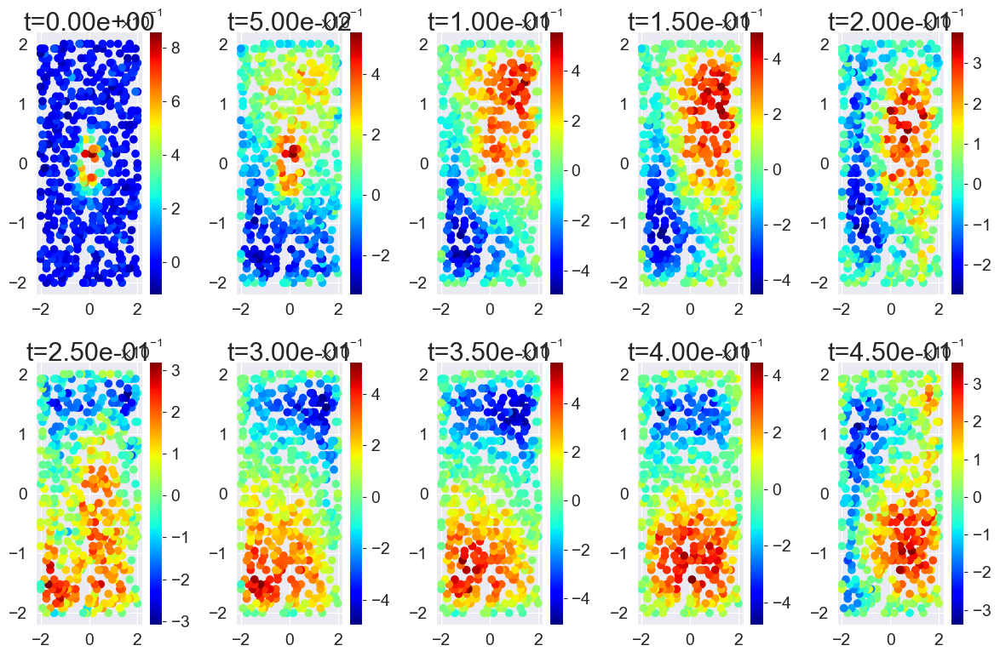

In [7]:
hm.plot_obs_state(idxs=range(10), figsize=(12,8))
plt.tight_layout()

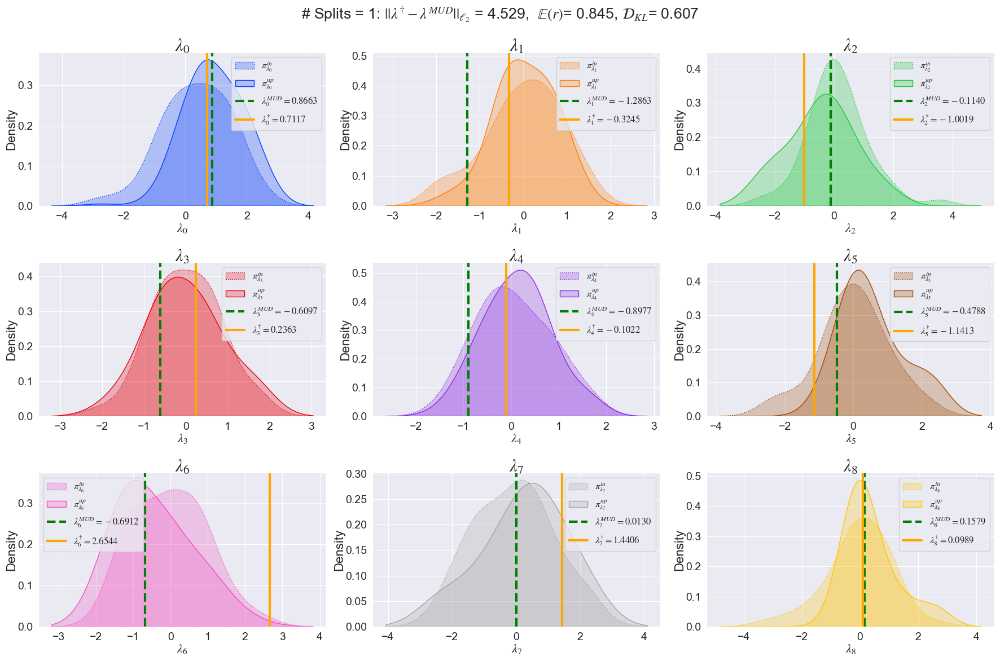

In [8]:
prob.probs[0].best.param_density_plots(lam_true=np.array([hm.lam_true]))

In [10]:
import pandas as pd
prob_best = prob.probs[0].best
print(prob_best)

            DCI Problem             
┌─────────────┬────────────────────┐
│ num_samples │ 50                 │
│ num_params  │ 10                 │
│ num_states  │ 10                 │
│ mem_usage   │ 2.11 KB            │
│ solved      │ True               │
│ e_r         │ 0.8450075946061522 │
│ kl          │ 0.606594000001308  │
│ error       │ None               │
└─────────────┴────────────────────┘

In [11]:
pd.concat(prob_best.results)

,e_r,kl,k_eff,k_eff_up,solved,error,lam_MUD_0,lam_MUD_1,lam_MUD_2,lam_MUD_3,...,lam_MUD_5,lam_MUD_6,lam_MUD_7,lam_MUD_8,lam_MUD_9,MUD_idx,pca_components,pca_mask,i,I
0,0.845008,0.606594,1.0,0.98,True,None,0.866306,-1.286257,-0.113989,-0.609666,...,-0.478804,-0.691151,0.012965,0.157854,-1.18533,46,[0],"range(0, 5500)",1,1


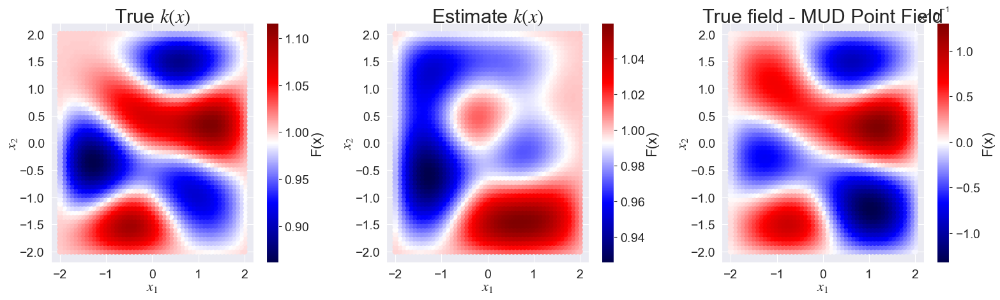

In [12]:
fig, ax = plt.subplots(1, 3, figsize=(16, 5))

mud_point = prob_best.get_mud_point()[1][0]

hm.plot_field(ax=ax[0])
ax[0].set_title("True $k(x)$")
hm.plot_field(field=mud_point, ax=ax[1])
ax[1].set_title(f"Estimate $k(x)$")
hm.plot_field(diff=mud_point, ax=ax[2])
ax[2].set_title("True field - MUD Point Field")

fig.tight_layout()

### Other Solutions

In [18]:
prob = prob.probs[0].probs[3]
print(prob)

╭─────────────────────────────── Traceback (most recent call last) ────────────────────────────────╮
│ in <module>                                                                                      │
│                                                                                                  │
│ ❱ 1 prob = prob.probs[0].probs[3]                                                                │
│   2 print(prob)                                                                                  │
│   3                                                                                              │
│                                                                                                  │
│ ╭─────────────────────────────────────────── locals ───────────────────────────────────────────╮ │
│ │               ax = array([<Axes: title={'center': 'True $k(x)$'}, xlabel='$x_1$',            │ │
│ │                    ylabel='$x_2$'>,                                                          │ │
│ │                    │      <Axes: title={'center': 'Estimate $k(x)$'}, xlabel='$x_1$',        │ │
│ │                    ylabel='$x_2$'>,                                                          │ │
│ │                    │      <Axes: title={'center': 'True field - MUD Point Field'},           │ │
│ │                    xlabel='$x_1$', ylabel='$x_2$'>],                                         │ │
│ │                    │     dtype=object)                                                       │ │
│ │      disable_log = <function disable_log at 0x176a8b640>                                     │ │
│ │       enable_log = <function enable_log at 0x176a8b5b0>                                      │ │
│ │             exit = <IPython.core.autocall.ZMQExitAutocall object at 0x110bf0ac0>             │ │
│ │              fig = <Figure size 1600x500 with 6 Axes>                                        │ │
│ │  ForcingFunction = <class '__main__.ForcingFunction'>                                        │ │
│ │           get_df = <function get_df at 0x176b44280>                                          │ │
│ │      get_ipython = <bound method InteractiveShell.get_ipython of                             │ │
│ │                    <ipykernel.zmqshell.ZMQInteractiveShell object at 0x110bf0220>>           │ │
│ │        HeatModel = <class 'pydci.examples.heat_model.HeatModel'>                             │ │
│ │               hm = <pydci.examples.heat_model.HeatModel object at 0x110d4a320>               │ │
│ │            Image = <class 'IPython.core.display.Image'>                                      │ │
│ │        importlib = <module 'importlib' from                                                  │ │
│ │                    '/Users/carlos/.mm/envs/fenics/lib/python3.10/importlib/__init__.py'>     │ │
│ │               In = [                                                                         │ │
│ │                    │   '',                                                                   │ │
│ │                    │   'from pydci.examples.heat_model import HeatModel\nimport numpy as     │ │
│ │                    np\nimport matplo'+855,                                                   │ │
│ │                    │   'hm.lam_true',                                                        │ │
│ │                    │   'hm.plot_field()',                                                    │ │
│ │                    │   "enable_log(level='DEBUG')\nprob = OnlineSequential(\n    hm,\n       │ │
│ │                    time_step=0.5,\n)\n"+558,                                                 │ │
│ │                    │   'prob.probs[-1].search_results',                                      │ │
│ │                    │   'prob.probs[-1].results',                                             │ │
│ │                    │   'hm.plot_obs_state(idxs=range(10),                                    │ │
│ │                    figsize=(12,8))\nplt.tight_layout()', 

# Second Iteration



In [ ]:
# disable_log()
enable_log(level='DEBUG', filter='pydci.consistent_bayes.OnlineSequential')
prob.solve(
    num_its=1,
    max_t=None,
    num_samples=50,
    max_sample_size=200,
    samples_inc=50,
    time_step=0.5,
    exp_thresh=0.25,
    kl_thresh=3.0,
    min_eff_sample_size=1.0,
    num_tries_per_it=2,
    sampling_args={
        "dist": "normal",
        "mean": 0.0,
        "std_dev": 1.0,
    },
    solver_args=dict(
        pca_range=range(1, 3),
        split_range=range(1, 10),
        best_method="max_kl",
        all_data=True,
    ),
    make_plots=False,
    reset_model=False,
    reset_samples=False,
)
prob.probs[-1].results

,e_r,kl,k_eff,k_eff_up,solved,error,lam_MUD_0,lam_MUD_1,lam_MUD_2,lam_MUD_3,...,I,search_index,predict_delta,within_thresh,valid,closest,max_kl,min_kl,num_samples,weighted
0,1.008761,3.127299,1.000,0.223,True,None,0.097548,0.844671,-1.049625,-0.129027,...,1,0,0.008761,True,True,True,True,False,1000,False
0,1.012250,2.923702,0.337,0.254,True,None,0.132682,1.095232,-1.379915,-0.135527,...,2,1,0.012250,True,True,False,False,False,1000,False
0,0.821864,1.422116,0.328,0.290,True,None,0.358877,0.005011,-0.898070,-0.018481,...,3,2,0.178136,True,True,False,False,True,1000,False
0,0.798390,0.968516,0.265,0.300,False,Failed to solve problem on iteration 4 - |E(r)...,0.631075,-0.599481,-1.010204,0.211645,...,4,3,0.201610,True,False,False,False,False,1000,False
0,0.799014,5.422778,1.000,0.072,False,Failed to solve problem on iteration 1 - |E(r)...,0.458104,-0.507822,-0.818820,0.167952,...,1,4,0.200986,True,False,False,False,False,1000,False
0,1.290526,4.202366,1.000,0.158,False,Failed to solve problem on iteration 1 - |E(r)...,0.525354,-0.541073,-0.990514,0.078431,...,2,5,0.290526,True,False,False,False,False,1000,False
0,1.245468,3.142779,1.000,0.407,False,Failed to solve problem on iteration 1 - |E(r)...,0.538368,-0.168337,-1.227322,0.013246,...,3,6,0.245468,True,False,False,False,False,1000,False
0,0.724320,1.394736,0.128,0.144,False,Failed to solve problem on iteration 4 - |E(r)...,0.472671,-0.507612,-0.956699,0.016224,...,4,7,0.275680,True,False,False,False,False,1000,False
0,0.196265,5.830136,1.000,0.070,False,Failed to solve problem on iteration 1 - |E(r)...,0.458104,-0.507822,-0.818820,0.167952,...,1,8,0.803735,False,False,False,False,False,1000,False
0,0.635722,4.272638,1.000,0.156,False,Failed to solve problem on iteration 1 - |E(r)...,0.538368,-0.168337,-1.227322,0.013246,...,2,9,0.364278,True,False,False,False,False,1000,False


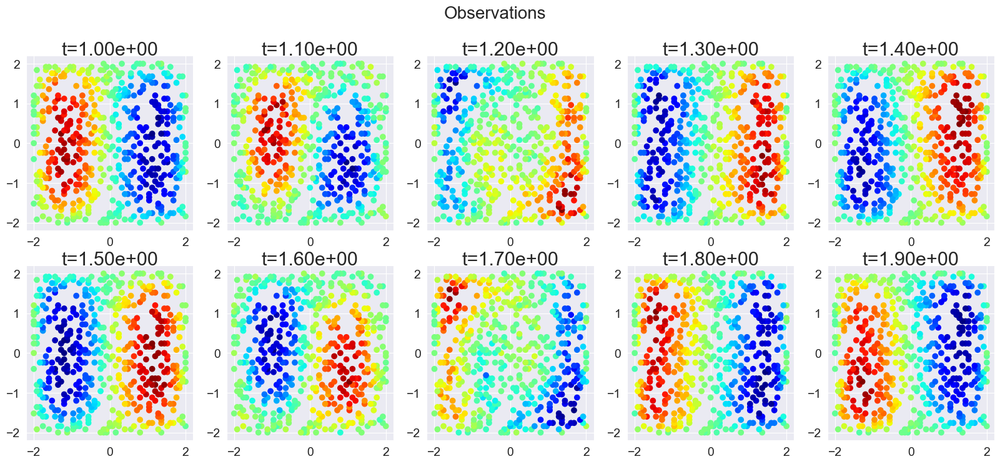

In [ ]:
hm.plot_obs_state()

In [ ]:
hm.save('hm_2_its.h5')

your performance may suffer as PyTables will pickle object types that it cannot
map directly to c-types [inferred_type->mixed-integer,key->values] [items->None]

  store.put("__attrs__", pd.Series(info_dict))



In [ ]:
best = prob.probs[-1].best

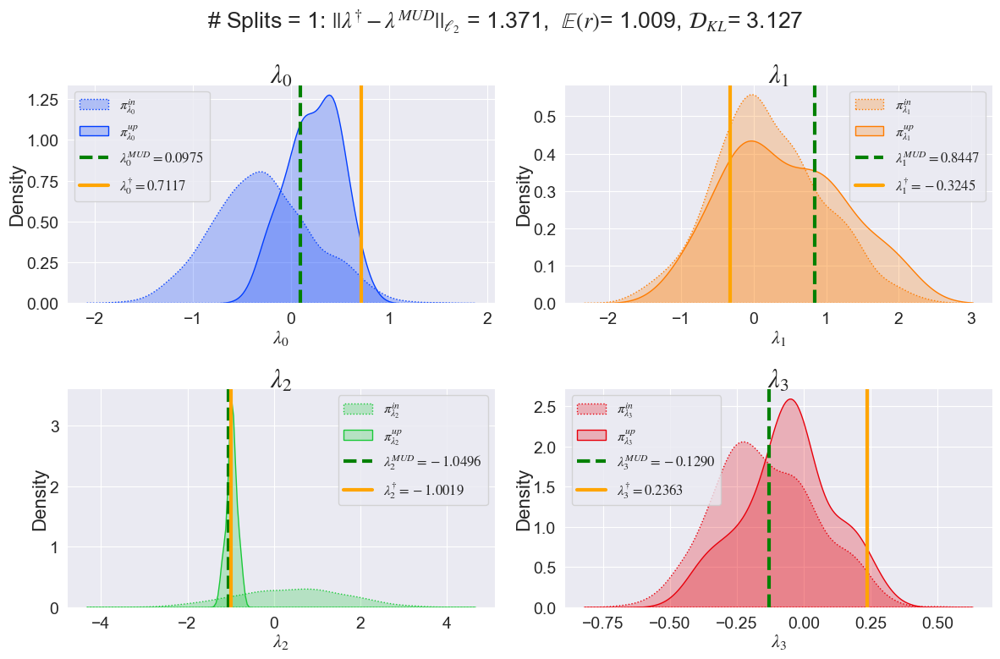

In [ ]:
best.param_density_plots(lam_true=hm.lam_true)

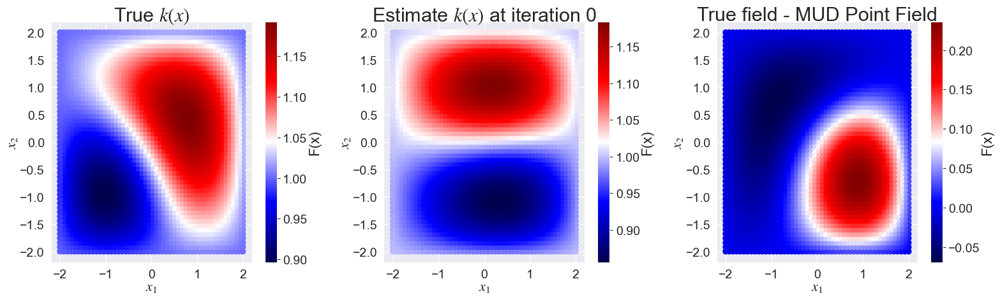

In [ ]:
for i in range(len(best.results)):
    fig, ax = plt.subplots(1, 3, figsize=(16, 5))

    mud_point = best.get_mud_point(iteration=i)[1][0]

    hm.plot_field(ax=ax[0])
    ax[0].set_title("True $k(x)$")
    hm.plot_field(field=mud_point, ax=ax[1])
    ax[1].set_title(f"Estimate $k(x)$ at iteration {i}")
    hm.plot_field(diff=mud_point, ax=ax[2])
    ax[2].set_title("True field - MUD Point Field")

    fig.tight_layout()

In [ ]:
# Solve using 1 principal component, 1 split, and all data
search_list = [
    {'exp_thresh': 1e10,
     'pca_components': [[0]],
     'pca_mask': None,
     'pca_splits': 1,
    }
]
import pydci.consistent_bayes.OfflineSequentialSearch as oss
import importlib
importlib.reload(oss)

enable_log(level='DEBUG')
data_idx = 0
search_prob = oss.OfflineSequentialSearch(
    prob.model.samples[data_idx],
    prob.model.data[data_idx],
    prob.model.measurement_noise,
    pi_in=prob.probs[data_idx].pi_in,
)
solve_args = dict(
    search_list=search_list,
    exp_thresh = 1e10,
    best_method = "closest",
)
search_prob.solve(**solve_args)

[08/15/23 09:23:03] INFO     Logger initialized                                                           ]8;id=35428;file:///Users/carlos/repos/pyDCI/src/pydci/log.py\log.py]8;;\:]8;id=86593;file:///Users/carlos/repos/pyDCI/src/pydci/log.py#87\87]8;;\

                    INFO     Searching through combinations:                         ]8;id=1594;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequentialSearch.py\OfflineSequentialSearch.py]8;;\:]8;id=915592;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequentialSearch.py#172\172]8;;\
                                  exp_thresh pca_components pca_mask  pca_splits                                   
                             0  1.000000e+10          [[0]]     None           1                                   

In [ ]:
search_prob.result

ERROR! Session/line number was not unique in database. History logging moved to new session 1006


In [ ]:
hm2.get_data(t0=0.0, tf=1.0)

[08/08/23 12:48:00] INFO     Getting data for model from 0.0 to 1.0                                    ]8;id=799040;file:///Users/carlos/repos/pyDCI/src/pydci/Model.py\Model.py]8;;\:]8;id=163526;file:///Users/carlos/repos/pyDCI/src/pydci/Model.py#354\354]8;;\

                    DEBUG    Constructing k_x field                                               ]8;id=543491;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=467825;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#259\259]8;;\

                    DEBUG    Assembling bilinear form                                             ]8;id=774687;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=897078;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#265\265]8;;\

                    DEBUG    Assembling linear form                                               ]8;id=570730;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=432824;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#275\275]8;;\

                    DEBUG    Initializing solver                                                  ]8;id=100558;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=448619;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#290\290]8;;\

[08/08/23 12:48:13] DEBUG    Shapes: (10000, 500), (10000, 2601), (10000,)                             ]8;id=656521;file:///Users/carlos/repos/pyDCI/src/pydci/Model.py\Model.py]8;;\:]8;id=995774;file:///Users/carlos/repos/pyDCI/src/pydci/Model.py#369\369]8;;\

In [ ]:
hm2.data[0]

,ts,shift_idx,sample_flag,lam_true_0,q_lam_true_0,q_lam_true_1,q_lam_true_2,q_lam_true_3,q_lam_true_4,q_lam_true_5,...,q_lam_obs_490,q_lam_obs_491,q_lam_obs_492,q_lam_obs_493,q_lam_obs_494,q_lam_obs_495,q_lam_obs_496,q_lam_obs_497,q_lam_obs_498,q_lam_obs_499
0,0.0000,0,True,-1.085631,2.037954e-17,4.248354e-18,2.037954e-17,9.776158e-17,9.170085e-17,9.170085e-17,...,-0.04668,-0.006919,-0.057921,-0.003284,0.051314,-0.013688,0.054905,0.041859,0.025693,0.009283
1,0.0001,0,False,-1.085631,0.000000e+00,0.000000e+00,0.000000e+00,-5.765875e-04,0.000000e+00,0.000000e+00,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,0.0002,0,False,-1.085631,0.000000e+00,0.000000e+00,0.000000e+00,-1.113291e-03,0.000000e+00,0.000000e+00,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,0.0003,0,False,-1.085631,0.000000e+00,0.000000e+00,0.000000e+00,-1.614504e-03,0.000000e+00,0.000000e+00,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,0.0004,0,False,-1.085631,0.000000e+00,0.000000e+00,0.000000e+00,-2.083998e-03,0.000000e+00,0.000000e+00,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,0.9996,0,False,-1.085631,0.000000e+00,0.000000e+00,0.000000e+00,-4.861025e-02,0.000000e+00,0.000000e+00,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9996,0.9997,0,False,-1.085631,0.000000e+00,0.000000e+00,0.000000e+00,-4.857169e-02,0.000000e+00,0.000000e+00,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9997,0.9998,0,False,-1.085631,0.000000e+00,0.000000e+00,0.000000e+00,-4.853303e-02,0.000000e+00,0.000000e+00,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9998,0.9999,0,False,-1.085631,0.000000e+00,0.000000e+00,0.000000e+00,-4.849428e-02,0.000000e+00,0.000000e+00,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


### Visualizing using pyvista

In [ ]:
snapshots = hm.take_snaps(hm.data[-1], sample_ts=0.005)
hm.output_gif(snapshots, gif_name="../figures/u_time_forced_true.gif")
Image(url="../figures/u_time_forced_true.gif")

|███████████████████████████████████████▋⚠︎ (!) 98/99 [99%] in 8.4s (11.69/s)                                            


## Parameter Estimation Problem - 4 Dimensional

In [ ]:
hm2.lam_true

array([-1.0856306 ,  0.99734545,  0.2829785 , -1.50629471])

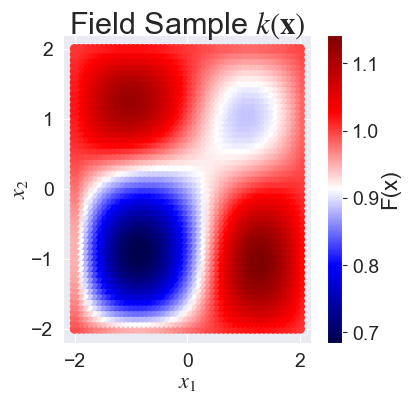

In [ ]:
hm2.plot_field()

In [ ]:
hm2.save('hm.h5')

[08/07/23 09:55:47] DEBUG    Saving data as DataFrame                                                  ]8;id=200257;file:///Users/carlos/repos/pyDCI/src/pydci/Model.py\Model.py]8;;\:]8;id=387243;file:///Users/carlos/repos/pyDCI/src/pydci/Model.py#224\224]8;;\

your performance may suffer as PyTables will pickle object types that it cannot
map directly to c-types [inferred_type->mixed-integer,key->values] [items->None]

  store.put("__attrs__", pd.Series(info_dict))



In [ ]:
from pydci.examples.heat_model import HeatModel
import numpy as np
import matplotlib.pyplot as plt
from IPython.display import Image

from pydci import OfflineSequential, OnlineSequential
from pydci.log import enable_log, disable_log
from pydci.utils import get_df, set_seed

class ForcingFunction:
    def __init__(self):
        self.t = 0.0

    def eval(self, x):
        # Added some spatial variation here. Expression is sin(t)*x
        return np.full(
            x.shape[1],
            6 * np.sin(2 * np.pi * self.t) * x[0]
            + 2 * np.cos(6 * np.pi * self.t) * x[1],
        )
 
# disable_log()
enable_log(level='INFO')
hm = HeatModel(
    x0=None,
    measurement_noise=0.05,
    solve_ts=0.0001,
    sample_ts=0.1,
    nx=50,
    ny=50,
    mean=1.0,
    std_dev=1.0,
    length_scales=[0.1, 0.1],
    nmodes=4,
    true_k_x=None,
    max_states=500,
    forcing_expression=ForcingFunction(),
    model_file='hm.h5'
)


[08/08/23 12:48:33] INFO     Logger initialized                                                           ]8;id=561995;file:///Users/carlos/repos/pyDCI/src/pydci/log.py\log.py]8;;\:]8;id=176864;file:///Users/carlos/repos/pyDCI/src/pydci/log.py#80\80]8;;\

                    INFO     Loading model state from state file at                                    ]8;id=64112;file:///Users/carlos/repos/pyDCI/src/pydci/Model.py\Model.py]8;;\:]8;id=259243;file:///Users/carlos/repos/pyDCI/src/pydci/Model.py#162\162]8;;\
                             /Users/carlos/repos/pyDCI/notebooks/Examples/hm.h5                                    

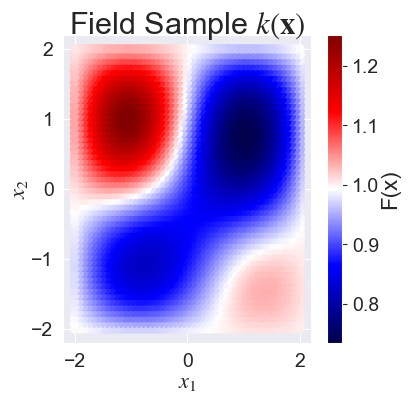

In [ ]:
hm.plot_field()

In [ ]:
hm.samples[0]

,lam_0,lam_1,lam_2,lam_3,q_lam_0,q_lam_1,q_lam_2,q_lam_3,q_lam_4,q_lam_5,...,q_lam_5490,q_lam_5491,q_lam_5492,q_lam_5493,q_lam_5494,q_lam_5495,q_lam_5496,q_lam_5497,q_lam_5498,q_lam_5499
0,2.398402,0.209391,0.339257,0.363429,-0.006164,0.038008,0.054501,0.035192,-0.112345,-0.020241,...,0.468623,0.414600,0.0,0.381878,0.161837,0.0,0.0,0.205124,0.0,0.0
1,0.159622,0.640704,0.921266,0.530817,-0.048342,0.034963,-0.023503,-0.021415,-0.077902,-0.111201,...,0.478693,0.422365,0.0,0.388675,0.163376,0.0,0.0,0.207487,0.0,0.0
2,2.709764,0.172250,-0.511626,1.658605,0.029461,-0.019512,-0.019549,0.010250,-0.069148,-0.068142,...,0.474737,0.419470,0.0,0.386230,0.163006,0.0,0.0,0.206799,0.0,0.0
3,-0.644560,0.510139,1.868396,-0.407551,0.112805,0.067712,-0.174210,0.042427,0.004928,-0.020097,...,0.477728,0.421531,0.0,0.387876,0.163054,0.0,0.0,0.207090,0.0,0.0
4,1.715961,0.291900,0.260809,0.723999,-0.070374,-0.035234,0.105442,0.025105,-0.024265,-0.064517,...,0.473163,0.418162,0.0,0.385003,0.162607,0.0,0.0,0.206249,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,-0.578346,0.511904,0.410250,-0.023589,0.005691,0.061258,0.023504,0.041205,-0.053393,-0.001287,...,0.471113,0.416376,0.0,0.383371,0.161975,0.0,0.0,0.205497,0.0,0.0
96,0.534866,0.330758,0.984021,1.718588,-0.009682,-0.034862,-0.073485,-0.054101,-0.030356,-0.013231,...,0.490788,0.431936,0.0,0.397095,0.165537,0.0,0.0,0.210572,0.0,0.0
97,0.603362,2.865804,1.617897,0.474221,-0.056303,0.059851,-0.048947,0.017549,-0.061712,-0.044626,...,0.478933,0.422166,0.0,0.388755,0.163300,0.0,0.0,0.207628,0.0,0.0
98,0.790767,0.927379,-1.376941,0.398223,-0.088638,-0.025547,0.109583,-0.052919,0.031496,0.132473,...,0.457953,0.405901,0.0,0.374306,0.159659,0.0,0.0,0.202275,0.0,0.0


In [ ]:
# Solve using 1 principal component, 1 split, and all data
search_list = [
    {'exp_thresh': 1e10,
     'pca_components': [[0]],
     'pca_mask': None,
     'pca_splits': 1,
    }
]

In [ ]:
import pydci.consistent_bayes.OfflineSequentialSearch as oss
import importlib
importlib.reload(oss)

data_idx = 0
search_prob = oss.OfflineSequentialSearch(
    prob.model.samples[data_idx],
    prob.model.data[data_idx],
    prob.model.measurement_noise,
    pi_in=pi_in,
)
solve_args = dict(
    search_list=search_list,
    serach_comb_args=None,
    exp_thresh = 1e10,
    best_method = "closest",
    pi_in=pi_in,
)
search_prob.solve(**solve_args)
search_prob.search_results

[08/08/23 06:52:10] INFO     Searching through combinations:                         ]8;id=119990;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequentialSearch.py\OfflineSequentialSearch.py]8;;\:]8;id=933399;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequentialSearch.py#158\158]8;;\
                                  exp_thresh pca_components pca_mask  pca_splits                                   
                             0  1.000000e+10          [[0]]     None           1                                   

Solving for different combinations |                                        | ▁▃▅ 0/1 [0%] in 0s (~0s, 0.0/s) 

Solving for different combinations |                                        | ▂▄▆ 0/1 [0%] in 0s (~0s, 0.0/s) 

                    INFO     Iteration 0: Solving using (range(0, 5500), [0])              ]8;id=305159;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py\OfflineSequential.py]8;;\:]8;id=394344;file:///Users/carlos/repos/pyDCI/src/pydci/consistent_bayes/OfflineSequential.py#188\188]8;;\

on 0: WARNING:py.warnings:/Users/carlos/.mm/envs/fenics/lib/python3.10/site-packages/scipy/stats/_entropy.py:133: RuntimeWarning: invalid value encountered in divide
        pk = 1.0*pk / np.sum(pk, axis=axis, keepdims=True)


Solving for different combinations |████████████████████████████████████████| 1/1 [100%] in 0.4s (2.23/s)               


,e_r,kl,lam_MUD_0,lam_MUD_1,lam_MUD_2,lam_MUD_3,MUD_idx,pca_components,num_splits,search_index,predict_delta,within_thresh,closest,max_kl,min_kl
0,0.0,NaN,2.398402,0.209391,0.339257,0.363429,0,[0],1,0,1.0,True,True,False,False


In [ ]:
prob.search_results

,e_r,kl,lam_MUD_0,lam_MUD_1,lam_MUD_2,lam_MUD_3,MUD_idx,pca_components,num_splits,search_index,predict_delta,within_thresh,closest,max_kl,min_kl
0,0.0,NaN,2.398402,0.209391,0.339257,0.363429,0,[0],1,0,1.0,False,False,False,False
0,0.0,NaN,2.398402,0.209391,0.339257,0.363429,0,"[0, 1]",1,10,1.0,False,False,False,False


In [ ]:
from pydci.utils import get_search_combinations

get_search_combinations(
    len(self.meas)
    100, 10, 1000, max_num_combs=20)

ImportError: cannot import name 'get_search_combinations' from 'pydci.utils' (/Users/carlos/repos/pyDCI/src/pydci/utils.py)

In [ ]:
search_combs = {
    'exp_thresh': 1e10,
    'max_nc': 3,
    'all_data': True,
    'split_range': range(0, 10, 2)
}
solve_args = {'exp_thresh': 0.3, 'search_list': search_list}
enable_log(level='INFO', file='heat_solve.log')
prob.solve_till_thresh(
    0,
    start_sample_size=100,
    max_samples=200,
    samples_inc=20,
    pi_in=None,
    sampling_args={'mean': 1.0, 'std_dev': 1.0},
    solve_args=solve_args,
)

Solving for different combinations |⚠︎                                       | (!) 0/4 [0%] in 0.5s (0.00/s)             


AttributeError: 'str' object has no attribute 'update'

In [ ]:
prob.model.save('hm.h5')

your performance may suffer as PyTables will pickle object types that it cannot
map directly to c-types [inferred_type->mixed-integer,key->values] [items->None]

  store.put("__attrs__", pd.Series(info_dict))



In [ ]:
num_samples = 100
pi_in, samples = hm2.get_normal_initial_samples(num_samples=num_samples)
samples.shape

(100, 4)

In [ ]:
disable_log()
hm2.forward_solve(samples, restart=True)

In [ ]:
measurements = get_df(hm2.data[0].dropna(), "q_lam_obs", hm2.n_sensors)
measurements, measurements.shape

(array([[ 0.05388106,  0.00039901, -0.08511962, ...,  0.05107824,
          0.05304891,  0.0873647 ],
        [ 0.12020283,  0.14380145,  0.08703669, ..., -0.15015633,
          0.03480773, -0.13624253],
        [ 0.21888024,  0.25118357,  0.21733671, ..., -0.27789261,
         -0.15584626, -0.00946511],
        ...,
        [-0.22579653, -0.1869436 , -0.14663122, ...,  0.1933766 ,
          0.20073965, -0.02020877],
        [-0.16876127, -0.15245744, -0.1554438 , ...,  0.0446893 ,
          0.04515602,  0.05520697],
        [-0.06368514, -0.09739765, -0.19448661, ...,  0.15959087,
          0.07933409,  0.08884999]]),
 (11, 500))

In [ ]:
disable_log()
prob = OfflineSequential(
    hm2.samples[0], measurements.ravel(), hm2.measurement_noise, pi_in=pi_in
)
prob.solve(pca_components=[[0]], pca_splits=2, exp_thresh=1e10)
prob.result

,e_r,kl,lam_MUD_0,lam_MUD_1,lam_MUD_2,lam_MUD_3,MUD_idx,pca_components,num_splits
0,0.771526,6.217966,0.281513,1.140067,-0.08069,-1.713102,57,[0],2


  self._data_covariance = atleast_2d(cov(self.dataset, rowvar=1,

  c *= np.true_divide(1, fact)



ValueError: array must not contain infs or NaNs

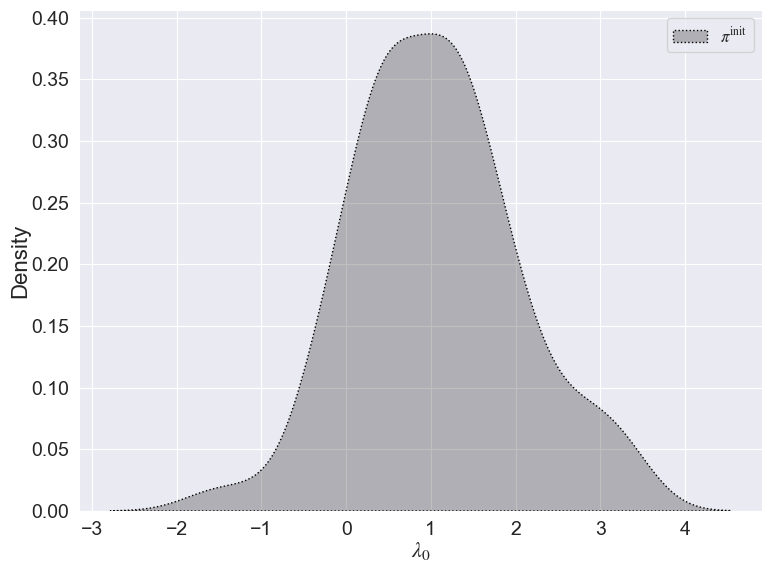

In [ ]:
prob.plot_iterations(lam_true=[hm2.lam_true])

In [ ]:
prob.mud_point

array([ 0.28151347,  1.14006745, -0.08069004, -1.71310199])

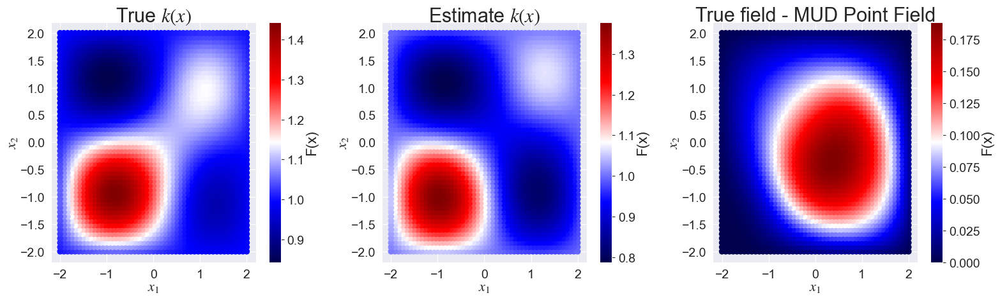

In [ ]:
fig, ax = plt.subplots(1, 3, figsize=(16, 5))

hm2.plot_field(ax=ax[0])
ax[0].set_title("True $k(x)$")
hm2.plot_field(field=prob.mud_point, ax=ax[1])
ax[1].set_title("Estimate $k(x)$")
hm2.plot_field(diff=prob.mud_point, ax=ax[2])
ax[2].set_title("True field - MUD Point Field")

fig.tight_layout()

## Second Iteration

In [ ]:
hm2.get_data(1.0)

In [ ]:
num_samples = 100
samples_1 = prob.sample_dist(num_samples=num_samples)
pi_up_1 = prob.dists["pi_up"]
samples_1.shape

(100, 4)

In [ ]:
disable_log()
hm2.forward_solve(samples_1, restart=True)

In [ ]:
measurements = get_df(hm2.data[-1].dropna(), "q_lam_obs", hm2.n_sensors)
measurements, measurements.shape

(array([[-0.11259528, -0.17947601, -0.15307315, ...,  0.06837078,
          0.01200697, -0.11790626],
        [ 0.05210833,  0.07083338,  0.01031819, ..., -0.05684411,
         -0.05919235, -0.10119049],
        [ 0.18342016,  0.24107654,  0.2087223 , ..., -0.215004  ,
          0.01506741,  0.07306923],
        ...,
        [-0.15647908, -0.22096363, -0.28701788, ...,  0.26512085,
          0.05967818, -0.04785114],
        [-0.11123512, -0.10704408, -0.13067355, ...,  0.17179913,
         -0.05096112, -0.01301608],
        [-0.06873262, -0.07762806, -0.1615912 , ...,  0.18042091,
         -0.02719195,  0.01954276]]),
 (11, 500))

In [ ]:
disable_log()
prob = OfflineSequential(
    hm2.samples[1], measurements.ravel(), hm2.measurement_noise, pi_in=pi_in
)
prob.solve(pca_components=[[0, 1]], pca_splits=10, exp_thresh=1e10)
prob.result

,e_r,kl,lam_MUD_0,lam_MUD_1,lam_MUD_2,lam_MUD_3,MUD_idx,pca_components,num_splits
0,0.8233,0.562814,0.290852,0.961946,-0.137489,-1.688744,3,"[0, 1]",10


In [ ]:
prob.mud_point, hm2.lam_true

(array([ 0.29085227,  0.96194567, -0.13748922, -1.68874395]),
 array([-1.0856306 ,  0.99734545,  0.2829785 , -1.50629471]))

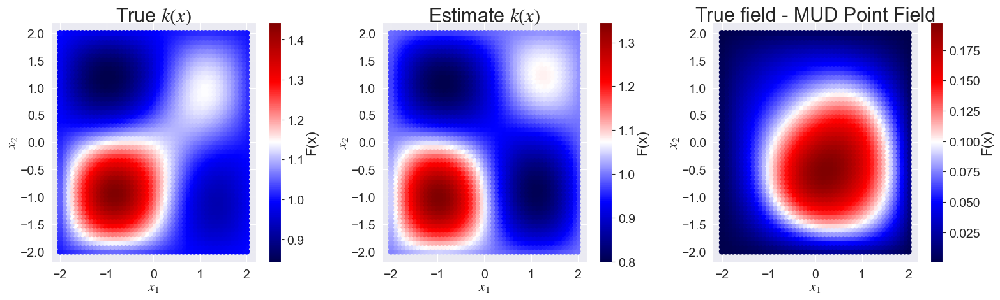

In [ ]:
fig, ax = plt.subplots(1, 3, figsize=(16, 5))

hm2.plot_field(ax=ax[0])
ax[0].set_title("True $k(x)$")
hm2.plot_field(field=prob.mud_point, ax=ax[1])
ax[1].set_title("Estimate $k(x)$")
hm2.plot_field(diff=prob.mud_point, ax=ax[2])
ax[2].set_title("True field - MUD Point Field")

fig.tight_layout()

## Online sequential solve

In [ ]:
from pydci.examples.heat_model import HeatModel
import numpy as np
import matplotlib.pyplot as plt
from IPython.display import Image

from pydci import PCAMUDProblem
from pydci.log import enable_log, disable_log
from pydci.utils import get_df, set_seed

set_seed(123)


class ForcingFunction:
    def __init__(self):
        self.t = 0.0

    def eval(self, x):
        # Added some spatial variation here. Expression is sin(t)*x
        return np.full(
            x.shape[1],
            6 * np.sin(2 * np.pi * self.t) * x[0]
            + 2 * np.cos(6 * np.pi * self.t) * x[1],
        )


enable_log(level="DEBUG")
hm = HeatModel(
    x0=None,
    t0=0.0,
    measurement_noise=0.05,
    solve_ts=0.0001,
    sample_ts=0.1,
    nx=50,
    ny=50,
    mean=1.0,
    std_dev=1.0,
    length_scales=[0.1, 0.1],
    nmodes=4,
    true_k_x=None,
    max_states=500,
    forcing_expression=ForcingFunction(),
)

[08/02/23 13:55:37] INFO     Logger initialized                                                           ]8;id=295600;file:///Users/carlos/repos/pyDCI/src/pydci/log.py\log.py]8;;\:]8;id=666177;file:///Users/carlos/repos/pyDCI/src/pydci/log.py#78\78]8;;\

                    DEBUG    Setting up simulation                                                 ]8;id=321777;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=90567;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#91\91]8;;\

[08/02/23 13:55:53] DEBUG    State idxs set at: None                                                    ]8;id=930142;file:///Users/carlos/repos/pyDCI/src/pydci/Model.py\Model.py]8;;\:]8;id=700109;file:///Users/carlos/repos/pyDCI/src/pydci/Model.py#90\90]8;;\

In [ ]:
import importlib
import pydci.consistent_bayes.OnlineSequential as os

importlib.reload(os)
prob = os.OnlineSequential(
    hm,
    def_init="normal",
)

In [ ]:
enable_log(level="INFO")
# prob.solve(
#     max_t=1,
#     num_samples=10,
#     time_step=1,
#     exp_thresh=0.5,
#     kl_thresh=4.5,
#     comb_args={
#         'max_nc': 2,
#         'exp_thresh': 1e10,
#         'split_range': [1, 2],
#     },
#     search_args={
#         'exp_thresh': 1e10,
#         'best_method': 'closest',
#     },
#     sampling_args={
#         'mean': 1.0,
#         'std_dev': 1.0,
#     }
# )

[08/02/23 15:26:12] INFO     Logger initialized                                                           ]8;id=296118;file:///Users/carlos/repos/pyDCI/src/pydci/log.py\log.py]8;;\:]8;id=503838;file:///Users/carlos/repos/pyDCI/src/pydci/log.py#78\78]8;;\

<loguru.logger handlers=[(id=3, level=20, sink=<RichHandler (NOTSET)>)]>

## Iterative Breakdwon

In [ ]:
measurements = get_df(hm2.data[-1].dropna(), "q_lam_obs", hm2.n_sensors)
measurements, measurements.shape

(array([[-0.0503295 ,  0.04333017,  0.01859238, ..., -0.09026164,
          0.01672525, -0.03757275],
        [ 0.11129165,  0.02183807,  0.05497946, ..., -0.08927662,
         -0.03069886, -0.09858796],
        [ 0.36503246,  0.20933543,  0.30617139, ..., -0.3867091 ,
          0.03155849, -0.25270547],
        ...,
        [-0.49835249, -0.36362105, -0.50400411, ...,  0.50715134,
         -0.00785971,  0.24784683],
        [-0.27162777, -0.18832302, -0.31768101, ...,  0.3602917 ,
          0.06235934,  0.14456361],
        [-0.13244838, -0.03995926, -0.14832467, ...,  0.15198369,
         -0.05855545, -0.00311293]]),
 (11, 500))

In [ ]:
disable_log()
prob = PCAMUDProblem(
    hm2.samples[-1], measurements.ravel(), hm2.measurement_noise, pi_in=pi_in
)
prob.solve_it(pca_components=[[0]], pca_splits=10, exp_thresh=1e10)
prob.result

,e_r,kl,lam_MUD_0,lam_MUD_1,lam_MUD_2,lam_MUD_3,MUD_idx,pca_components,pca_mask,i
0,2.792011,2.155546,0.935686,0.21199,-0.225779,-0.405773,97,[0],"range(4950, 5500)",9


In [ ]:
prob.mud_point

array([ 0.93568636,  0.21198978, -0.22577909, -0.40577332])

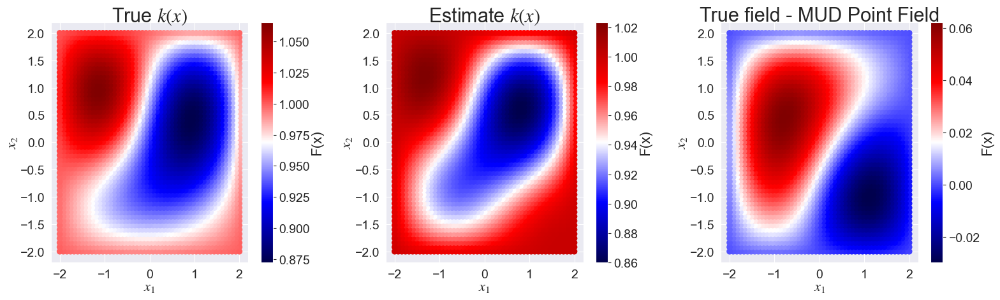

In [ ]:
fig, ax = plt.subplots(1, 3, figsize=(16, 5))

hm2.plot_field(ax=ax[0])
ax[0].set_title("True $k(x)$")
hm2.plot_field(field=prob.mud_point, ax=ax[1])
ax[1].set_title("Estimate $k(x)$")
hm2.plot_field(diff=prob.mud_point, ax=ax[2])
ax[2].set_title("True field - MUD Point Field")

fig.tight_layout()

In [ ]:
prob.it_results

,e_r,kl,lam_MUD_0,lam_MUD_1,lam_MUD_2,lam_MUD_3,MUD_idx,pca_components,pca_mask,i
0,0.941807,0.423399,0.712320,0.342105,0.693094,0.891946,58,[0],"range(0, 550)",0
0,0.998670,0.012344,0.931816,0.294412,1.280604,2.716632,34,[0],"range(550, 1100)",1
0,0.987230,0.770167,1.743959,0.866069,0.928642,0.724075,29,[0],"range(1100, 1650)",2
0,1.078473,0.738110,1.743959,0.866069,0.928642,0.724075,29,[0],"range(1650, 2200)",3
0,0.817274,1.924596,0.086046,1.180829,-0.047040,-0.752936,35,[0],"range(2200, 2750)",4
0,0.311481,2.489514,0.712320,0.342105,0.693094,0.891946,58,[0],"range(2750, 3300)",5
0,1.444133,0.912239,0.869742,-0.148870,1.411826,1.559119,42,[0],"range(3300, 3850)",6
0,0.492424,1.112835,0.712320,0.342105,0.693094,0.891946,58,[0],"range(3850, 4400)",7
0,0.131915,3.530549,0.712320,0.342105,0.693094,0.891946,58,[0],"range(4400, 4950)",8
0,2.792011,2.155546,0.935686,0.211990,-0.225779,-0.405773,97,[0],"range(4950, 5500)",9


In [ ]:
its

array([0, 2, 4, 6, 8])

In [ ]:
hm2.lam_true

array([ 0.64766395,  0.23596671, -0.56365636, -0.32909588])

In [ ]:
import seaborn as sns

type(sns.color_palette())

seaborn.palettes._ColorPalette

In [ ]:
import seaborn as sns
import itertools
from itertools import cycle


def plot_iterations(
    self,
    param_idx=0,
    iterations=None,
    lam_true=None,
    shade=True,
    color=None,
    linestyle=None,
    ax=None,
):
    """
    Plot PCA iterations.

    Plots the initial distribution, the iterative updates, and the final solution
    as stored in the self.it_results and self.pca_states attributes of the
    PCAMUDselflem object, which are updated during a PCAMUDselflem.solve_it() call.
    The iterative updates correspond to using a re-weighted sequential data-consistent
    update, also known as "offline" sequential estimation, since iterations
    are performed on a static set of data/simulations.

    Parameters
    ----------
    param_idx : int
        Index of the parameter to plot.
    iterations : list of int
        List of iterations to plot. If None, iterations are not plotted, just initial and final.
    lam_true : list of float
        True value of the parameter. Plotted as vertical orange line. If None, no true value is plotted.
    shade : bool
        If True, the iterative updates will be plotted with increasing transparancy as the iteration number
        increases. Otherwise all plotted with the same transparancy (alpha).
    color : str
        Color to use for all lines. If None, a color palette is used, so all lines are different colors.
    linestyle : str
        Linestyle to use for all lines. If None, linestyles are cycled through ['--','-.'] for the
        iterative updates. Initial is always plotted with ':' and final with '-'.
    ax :
        Matplotlib axes object to use. If None, a new figure and axes are created.

    Results
    -------
    ax : matplotlib.axes.Axes
        The matplotlib axes object used.
    """
    if ax is None:
        fig, ax = plt.subplots(figsize=(8, 6))

    # Plot initial distribution
    _, labels = self.plot_L(
        param_idx=param_idx,
        iteration=0,
        initial_kwargs={
            "color": "black",
            "linestyle": ":",
            "label": "$\pi^\mathrm{init}$",
        },
        update_kwargs=None,
        mud_kwargs=None,
        lam_true=None,
        ax=ax,
    )

    if isinstance(color, str):
        colors = [color] * (len(iterations) + 1)
    else:
        colors = sns.color_palette(None, len(iterations) + 1)

    # Plot iterative updates, for each iteration specified
    if iterations is not None:
        ls = ["--", "-."]
        ls = [linestyle] * (len(iterations) + 1) if linestyle is not None else ls
        linecycler = cycle(ls)

        alphas = np.ones(len(its)) if not shade else np.linspace(0.1, 0.9, len(its))
        line_opts = {"fill": False}
        for i, it in enumerate(iterations):
            line_opts["alpha"] = alphas[i]
            line_opts["label"] = f"$\pi^\mathrm{{up}}_{{i}}$"
            line_opts["color"] = colors[i]
            line_opts["linestyle"] = next(linecycler)
            _, l = self.plot_L(
                param_idx=param_idx,
                iteration=it,
                initial_kwargs=None,
                update_kwargs=line_opts,
                mud_kwargs=None,
                lam_true=None,
                ax=ax,
            )
            labels += l

    # Plot final solution, with mud argument and true lambda
    line_opts = {"fill": True}
    line_opts["label"] = f"$\pi^\mathrm{{up}}$"
    line_opts["linestyle"] = "-"
    line_opts["color"] = colors[-1]
    mud_args = {"alpha": 1.0, "linestyle": "--", "label": "$\lambda^\mathrm{MUD}$"}
    # if 'color' in kwargs.keys():
    #     mud_args['color'] = kwargs['color']
    _, l = self.plot_L(
        param_idx=param_idx,
        iteration=len(self.it_results) - 1,
        initial_kwargs=None,
        update_kwargs=line_opts,
        mud_kwargs=mud_args,
        lam_true=lam_true,
        ax=ax,
    )
    labels += l
    ax.legend(labels=labels, loc="upper right", fontsize=14)

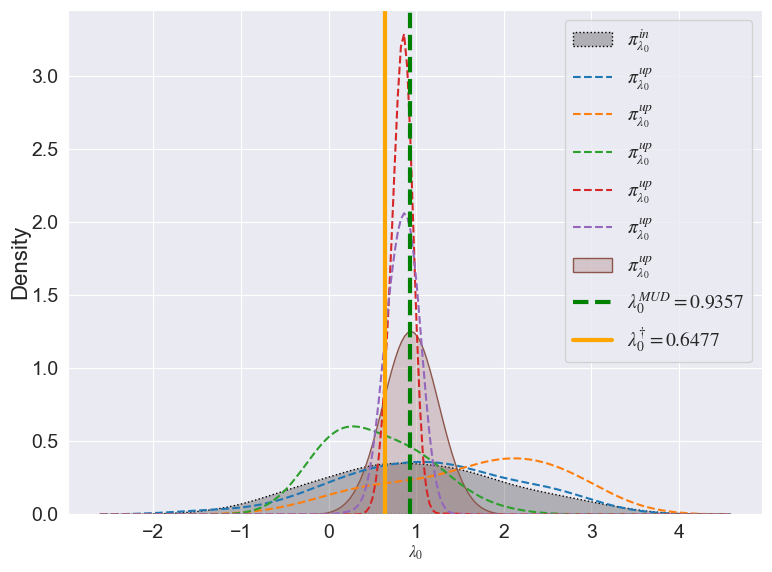

In [ ]:
plot_iterations(
    prob,
    param_idx=0,
    iterations=np.arange(0, len(prob.it_results) - 1, 2),
    lam_true=[hm2.lam_true],
    shade=False,
    linestyle="--",
)

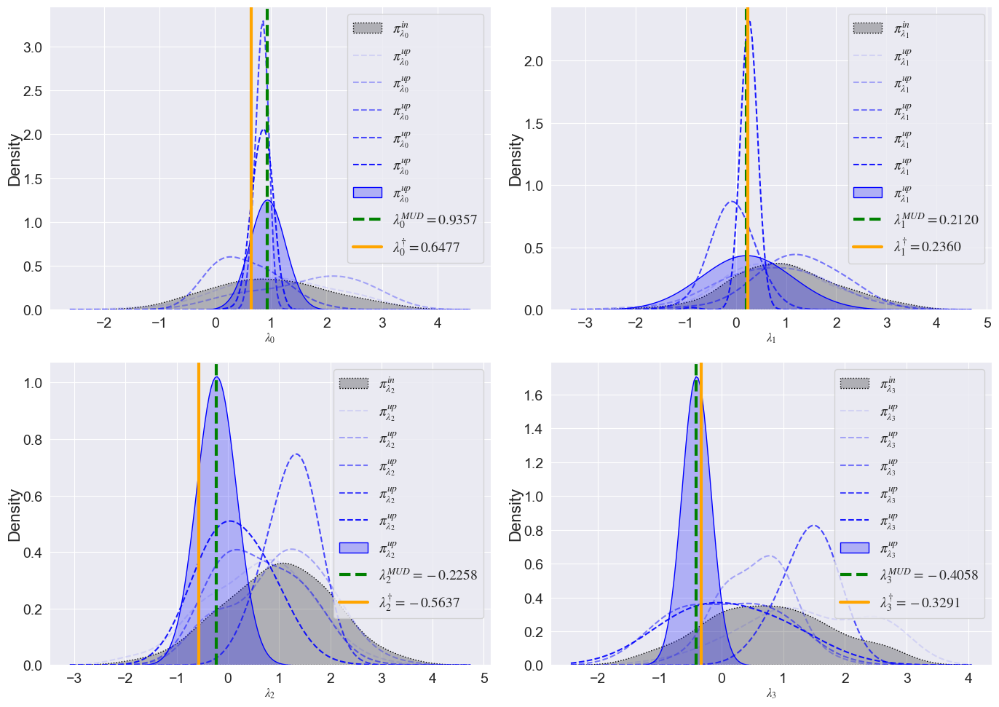

In [ ]:
fig, axs = plt.subplots(2, 2, figsize=(14, 10))

for i, ax in enumerate(axs.flatten()):
    plot_iterations(
        prob,
        param_idx=i,
        iterations=np.arange(0, len(prob.it_results) - 1, 2),
        lam_true=[hm2.lam_true],
        shade=True,
        color="blue",
        linestyle="--",
        ax=ax,
    )

# Parameter Estimation Problem - 10 Dimensional

In [ ]:
class ForcingFunction:
    def __init__(self):
        self.t = 0.0

    def eval(self, x):
        # Added some spatial variation here. Expression is sin(t)*x
        return np.full(
            x.shape[1],
            np.sin(2 * np.pi * self.t) * x[0] + 2 * np.sin(6 * np.pi * self.t) * x[1],
        )


enable_log(level="DEBUG")
hm_3 = HeatModel(
    x0=None,
    t0=0.0,
    measurement_noise=0.05,
    solve_ts=0.0001,
    sample_ts=0.1,
    nx=50,
    ny=50,
    mean=1.0,
    std_dev=1.0,
    length_scales=[0.1, 0.1],
    nmodes=10,
    true_k_x=None,
    max_states=500,
    forcing_expression=ForcingFunction(),
)

[07/31/23 17:43:33] INFO     Logger initialized                                                           ]8;id=516533;file:///Users/carlos/repos/pyDCI/src/pydci/log.py\log.py]8;;\:]8;id=500812;file:///Users/carlos/repos/pyDCI/src/pydci/log.py#78\78]8;;\

                    DEBUG    Setting up simulation                                                 ]8;id=294346;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=862889;file:///Users/carlos/repos/pyDCI/src/pydci/examples/heat_model.py#91\91]8;;\

[07/31/23 17:43:40] DEBUG    State idxs set at: None                                                    ]8;id=737501;file:///Users/carlos/repos/pyDCI/src/pydci/Model.py\Model.py]8;;\:]8;id=274871;file:///Users/carlos/repos/pyDCI/src/pydci/Model.py#89\89]8;;\

In [ ]:
hm_3.lam_true

array([-0.64644406, -0.01549523, -0.37668279,  2.06648842, -0.78282961,
       -0.52980457,  0.01711592, -0.85698592, -1.64393602, -0.63882098])

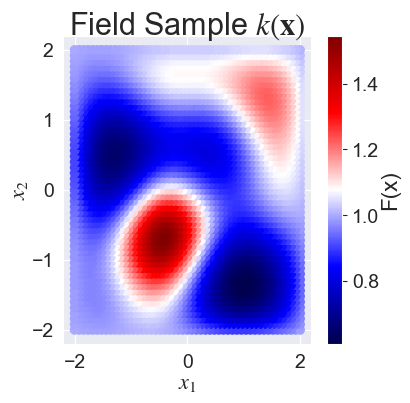

In [ ]:
hm_3.plot_field()

In [ ]:
hm_3.get_data(1.0)

KeyboardInterrupt: 

In [ ]:
from pydci.log import logger
from scipy.stats import multivariate_normal, uniform


def get_gaussian_initial_samples(self, mean=1.0, std_dev=1.0, num_samples=10):
    """
    Generate initial samples from uniform distribution over domain set by
    `self.set_domain`.
    """
    # Draw from n-dimensional Gaussian centered at `mean` with `std_dev` variance
    # Dimension equal to dimension of `self.n_params`
    logger.info(
        f"Drawing {num_samples} from multivariate normal at:\n"
        + f"\tmean: {mean}\n\tstd_dev: {std_dev}"
    )
    mean = np.ones(self.n_params) * mean if isinstance(mean, (int, float)) else mean
    std_dev = (
        np.ones(self.n_params) * std_dev
        if isinstance(std_dev, (int, float))
        else std_dev
    )
    pi_in = multivariate_normal(mean=mean, cov=std_dev)
    samples = pi_in.rvs(size=num_samples)
    return pi_in, samples

In [ ]:
num_samples = 500
pi_in, samples = get_gaussian_initial_samples(hm_3, num_samples=num_samples)
samples.shape

[07/31/23 18:02:48] INFO     Drawing 500 from multivariate normal at:                              ]8;id=358995;file:///var/folders/_1/y1tmd_l95j903jlk5yydl1f40000gn/T/ipykernel_52027/3351901359.py\3351901359.py]8;;\:]8;id=20328;file:///var/folders/_1/y1tmd_l95j903jlk5yydl1f40000gn/T/ipykernel_52027/3351901359.py#16\16]8;;\
                                     mean: 1.0                                                                     
                                     std_dev: 1.0                                                                  

(500, 10)

In [ ]:
disable_log()
hm_3.forward_solve(samples, restart=True)

In [ ]:
from pydci import PCAMUDProblem
from pydci.utils import get_df

measurements = get_df(hm_3.data[-1].dropna(), "q_lam_obs", hm_3.n_sensors)
measurements, measurements.shape

(array([[-0.00317942, -0.02755138,  0.07319754, ...,  0.02780154,
         -0.07817695,  0.02981863],
        [ 0.02412786,  0.07835142, -0.07532857, ...,  0.14566627,
          0.09203445,  0.04648463],
        [ 0.02867066, -0.00996445,  0.00710787, ..., -0.06938206,
         -0.01573445, -0.01376611],
        ...,
        [-0.01812432,  0.06861213, -0.0536534 , ...,  0.13982382,
          0.07208353,  0.09487232],
        [-0.02852655,  0.01385533,  0.11276158, ...,  0.04194105,
          0.06295833,  0.025753  ],
        [-0.02217587,  0.04708192, -0.02650854, ..., -0.0227698 ,
          0.03784738,  0.01685407]]),
 (11, 500))

In [ ]:
measurements.ravel().shape

(5500,)

In [ ]:
disable_log()
prob = PCAMUDProblem(
    hm_3.samples[-1], measurements.ravel(), hm_3.measurement_noise, pi_in=pi_in
)
prob.solve_it(pca_components=[[0, 1, 2]], pca_splits=10, exp_thresh=1e10)
prob.result

,e_r,kl,lam_MUD_0,lam_MUD_1,lam_MUD_2,lam_MUD_3,lam_MUD_4,lam_MUD_5,lam_MUD_6,lam_MUD_7,lam_MUD_8,lam_MUD_9,MUD_idx,pca_components,pca_mask,i
0,0.226825,2.068131,-0.480902,0.836184,1.307526,1.604113,-0.588028,-0.512855,0.544227,0.769523,0.176435,-0.744277,239,"[0, 1, 2]","range(4950, 5500)",9


In [ ]:
prob.mud_point

array([-0.48090168,  0.83618424,  1.30752574,  1.60411332, -0.58802756,
       -0.51285453,  0.54422699,  0.76952275,  0.17643451, -0.74427653])

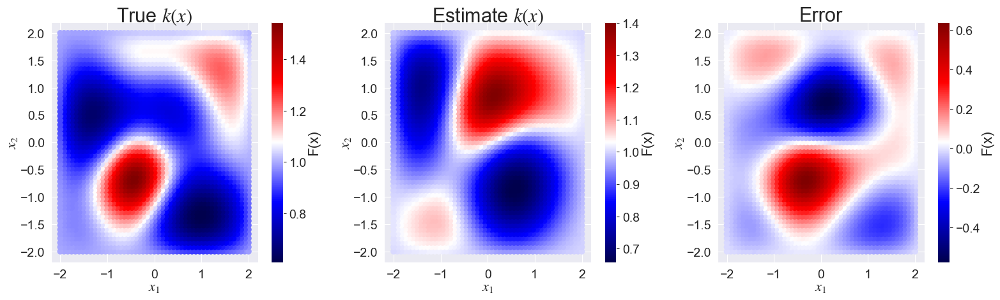

In [ ]:
from matplotlib import pyplot as plt

fig, ax = plt.subplots(1, 3, figsize=(16, 5))

hm_3.plot_field(ax=ax[0])
ax[0].set_title("True $k(x)$")
hm_3.plot_field(field=prob.mud_point, ax=ax[1])
ax[1].set_title("Estimate $k(x)$")
hm_3.plot_field(diff=prob.mud_point, ax=ax[2])
ax[2].set_title("Error")

fig.tight_layout()

### Second iteration

In [ ]:
hm_3.get_data(1.0)

In [ ]:
measurements = get_df(hm_3.data[-1].dropna(), "q_lam_obs", hm_3.n_sensors)
measurements, measurements.shape

(array([[ 0.01483737,  0.06972236,  0.01876941, ..., -0.09672661,
          0.00149668, -0.02514891],
        [ 0.06940723,  0.09757674,  0.00500334, ...,  0.13613502,
         -0.04941342,  0.08377173],
        [ 0.04789538, -0.02190484, -0.09207588, ...,  0.09699546,
          0.03104305,  0.03871062],
        ...,
        [-0.02910159,  0.0222603 , -0.10658916, ...,  0.05397587,
          0.13039127,  0.14793121],
        [ 0.09401623,  0.05985476, -0.05636157, ...,  0.05626951,
          0.04942577,  0.03040665],
        [-0.07613814, -0.07867057,  0.05112792, ..., -0.07183673,
          0.04447727, -0.01671055]]),
 (11, 500))

In [ ]:
samples = prob.sample_dist(num_samples=500)
pi_in = prob.dists["pi_up"]

In [ ]:
disable_log()
hm_3.forward_solve(samples, restart=True)

Solving model sample set: |██▉                 | ▃▅▇ 73/500 [15%] in 9:13 (~54:26, 0.1/s)                               

# Example from https://fenicsproject.discourse.group/t/equivalent-for-expression-in-dolfinx/2641/12

Used this example to figure out how to set a time dependent forcing function:

In [ ]:
from dolfinx import mesh, fem
from dolfinx.fem import FunctionSpace, Function, Constant
from ufl import TestFunction, dx, inner
import numpy as np
from mpi4py import MPI


class MyExpression:
    def __init__(self):
        self.t = 0.0

    def eval(self, x):
        # Added some spatial variation here. Expression is sin(t)*x
        return np.full(x.shape[1], np.sin(self.t) * x[0])


def test():
    """
    Test example from
    https://fenicsproject.discourse.group/t/equivalent-for-expression-in-dolfinx/2641/12
    """
    # If your Expression is not spatially dependent, use Constant
    # f = Constant(mesh, 0)
    # L = inner(f, v)*dx
    # f.value = np.sin(2)
    mesh = mesh.create_unit_square(MPI.COMM_WORLD, 10, 10)
    V = FunctionSpace(mesh, ("CG", 1))
    f = MyExpression()
    f.t = 0
    w = Function(V)
    v = TestFunction(V)
    L = inner(w, v) * dx
    w.interpolate(f.eval)
    fem.form(L)
    # print(fbem.petsc.assemble_vector(fem.form(L)))

# Old results

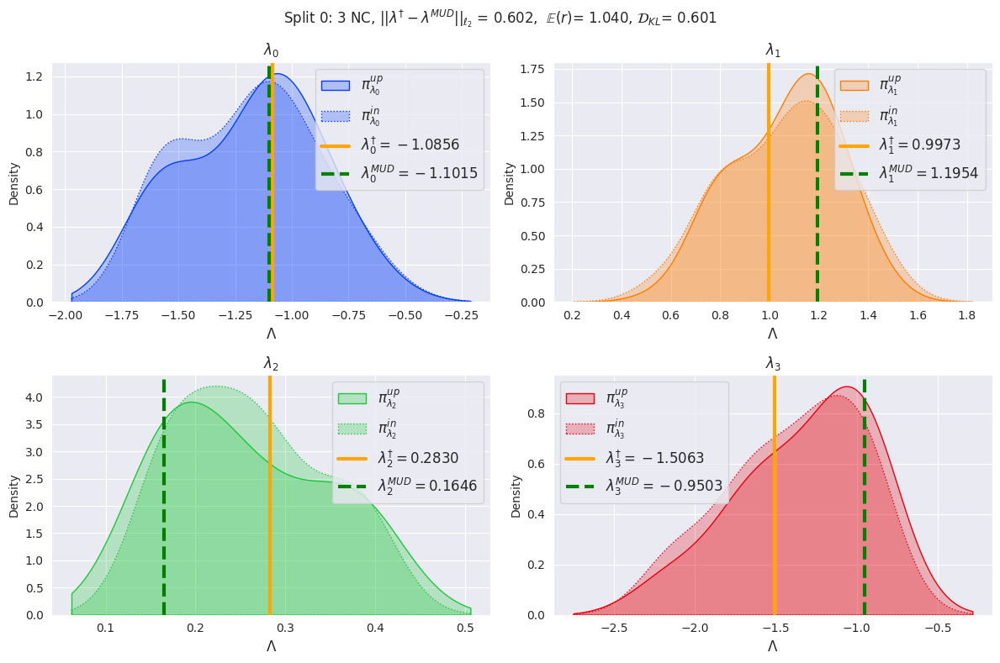

In [ ]:
heat_model.probs[0].param_density_plots(lam_true=heat_model.lam_true)

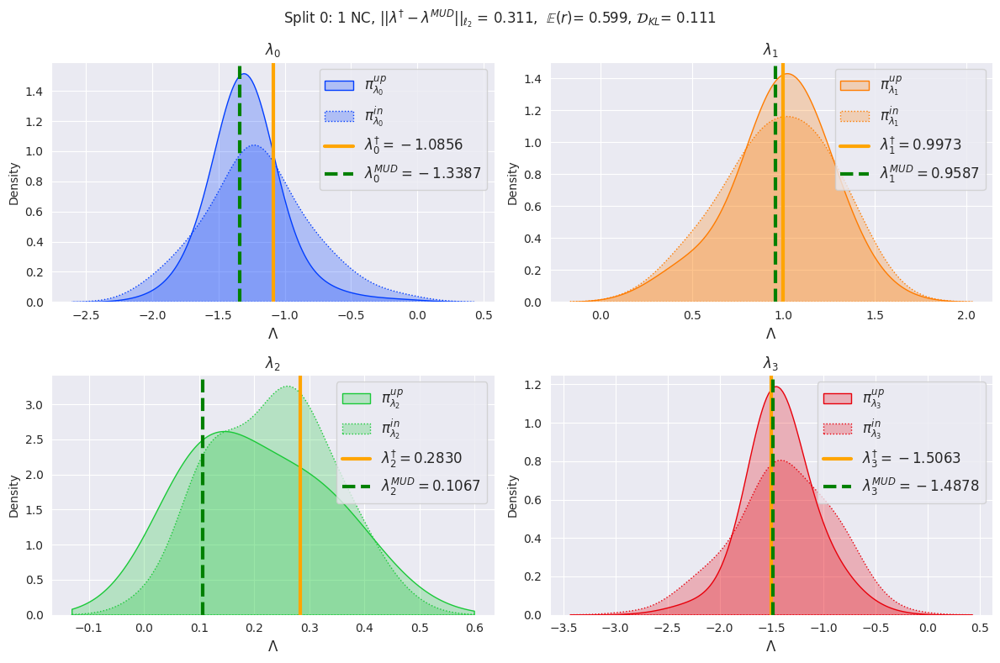

In [ ]:
heat_model.probs[-1].param_density_plots(lam_true=heat_model.lam_true)

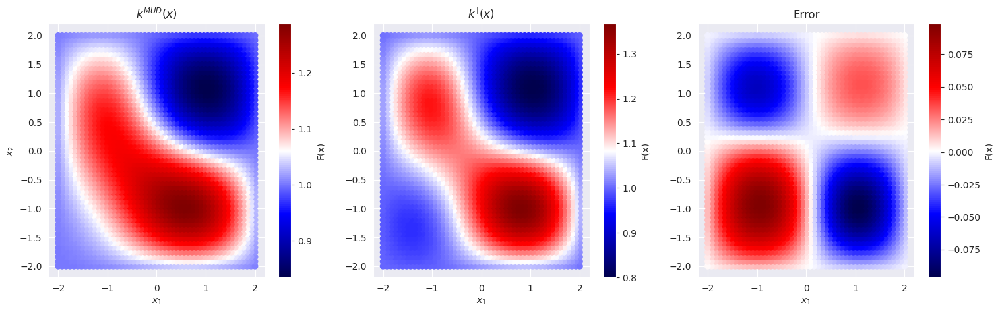

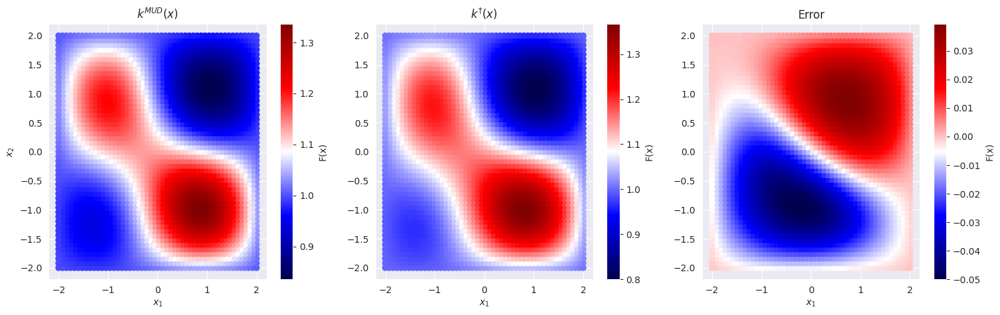

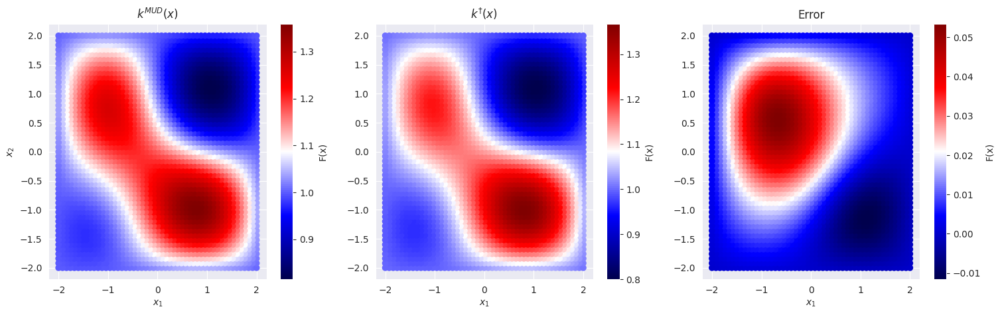

In [ ]:
def plot_field_sol(heat_model, iteration=0):
    fig, ax = plt.subplots(1, 3, figsize=(18, 5))
    heat_model.plot_field(field=heat_model.probs[iteration].mud_point, ax=ax[0])
    ax[0].set_title("$k^{MUD}(x)$")
    heat_model.plot_field(field=heat_model.lam_true, ax=ax[1])
    ax[1].set_title("$k^{\dagger}(x)$")
    ax[1].set_ylabel("")
    heat_model.plot_field(
        field=heat_model.probs[iteration].mud_point, diff=heat_model.lam_true, ax=ax[2]
    )
    ax[2].set_title("Error")
    ax[2].set_ylabel("")
    fig.tight_layout


for i in range(len(heat_model.probs)):
    plot_field_sol(heat_model, iteration=i)

# Num Modes = 10

Increase number of params

In [ ]:
np.random.seed(123)

importlib.reload(hm)
heat_model2 = hm.HeatModel(nmodes=10, max_states=50)
heat_model2.estimate_params([0.1, 0.2, 0.3, 0.4, 0.5], num_samples=100)

[04/21/23 06:13:30] WARNING  Pyvista not found                                                     ]8;id=37718;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/examples/heat_model.py\heat_model.py]8;;\:]8;id=429962;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/examples/heat_model.py#24\24]8;;\

[04/21/23 06:13:36] INFO     Drawing 100 from uniform at:                                              ]8;id=675452;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/Model.py\Model.py]8;;\:]8;id=246421;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/Model.py#251\251]8;;\
                                     loc: [-1.6284459   0.49867272  0.14148925 -2.25944207 -0.86790038             
                             0.82571827                                                                            
                              -3.64001887 -0.64336894  0.63296813 -1.3001106 ]                                     
                                     scale: [1.0856306  0.99734545 0.2829785  1.50629471 0.57860025                
                             1.65143654                                                                            
                              2.42667924 0.42891263 1.26593626 0.8667404 ]                                         

                    INFO     Starting iteration from 0.0 to 0.1                                        ]8;id=313636;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/Model.py\Model.py]8;;\:]8;id=163885;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/Model.py#502\502]8;;\

[04/21/23 06:13:37] INFO     end_point: 0.0, [ 0.05486596  0.0069361  -0.04177233 ... -0.04220415      ]8;id=540862;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/Model.py\Model.py]8;;\:]8;id=198414;file:///home/jupyter/MyData/repos/pyDCI/src/pydci/Model.py#169\169]8;;\
                             -0.09562734                                                                           
                               0.00950829]                                                                         

Solving model sample set: |██████▋             | ▂▂▄ 33/100 [33%] in 27s (~57s, 

In [ ]:
heat_model2.probs[-1].split_results

e_r        kl  lam_MUD_0  lam_MUD_1  lam_MUD_2   
split nc qoi_comb                                                        
0     1  0         0.565419  0.394487  -0.716982   1.679628   0.570665  \
      2  0         0.216006  0.524723  -0.590240   1.052694   0.300730   
      3  0         0.100875  0.494597  -0.590240   1.052694   0.300730   
      4  0         0.047903  0.434479  -0.590240   1.052694   0.300730   
      5  0         0.004259  0.525457  -1.180029   0.983414   0.447064   
      6  0         0.000816  1.018789  -0.575421   0.587249   0.040367   
      7  0         0.000460  1.079205  -0.575421   0.587249   0.040367   
      8  0         0.000084  1.540604  -1.098010   0.845948   0.011891   
      9  0         0.000043  1.800293  -1.098010   0.845948   0.011891   
      10 0         0.000014  1.646176  -0.716982   1.679628   0.570665   

                   lam_MUD_3  lam_MUD_4  lam_MUD_5  lam_MUD_6  lam_MUD_7   
split nc qoi_comb                                                          
0     1  0         -1.031287  -0.868979   2.037876  -4.117301  -0.362467  \
      2  0         -2.046628  -0.121896   2.232244  -2.191623  -0.118790   
      3  0         -2.046628  -0.121896   2.232244  -2.191623  -0.118790   
      4  0         -2.046628  -0.121896   2.232244  -2.191623  -0.118790   
      5  0         -0.574936  -0.539496   0.049587  -2.999707  -0.253100   
      6  0         -1.449368  -0.112898   3.304668  -2.442955  -0.456310   
      7  0         -1.449368  -0.112898   3.304668  -2.442955  -0.456310   
      8  0         -1.118476  -0.256675   1.915368  -0.902907  -0.470322   
      9  0         -1.118476  -0.256675   1.915368  -0.902907  -0.470322   
      10 0         -1.031287  -0.868979   2.037876  -4.117301  -0.362467   

                   lam_MUD_8  lam_MUD_9  predict_delta  within_thresh   
split nc qoi_comb                                                       
0     1  0          2.216736  -1.388417       0.434581           True  \
      2  0         -0.138245  -0.208366       0.783994          False   
      3  0         -0.138245  -0.208366       0.899125          False   
      4  0         -0.138245  -0.208366       0.952097          False   
      5  0          1.418394  -1.759890       0.995741          False   
      6  0          0.576993  -0.406242       0.999184          False   
      7  0          0.576993  -0.406242       0.999540          False   
      8  0          2.135069  -0.120351       0.999916          False   
      9  0          2.135069  -0.120351       0.999957          False   
      10 0          2.216736  -1.388417       0.999986          False   

                   closest  max_kl  min_kl  
split nc qoi_comb                           
0     1  0            True    True    True  
      2  0           False   False   False  
      3  0           False   False   False  
      4  0           False   False   False  
      5  0           False   False   False  
      6  0           False   False   False  
      7  0           False   False   False  
      8  0           False   False   False  
      9  0           False   False   False  
      10 0           False   False   False

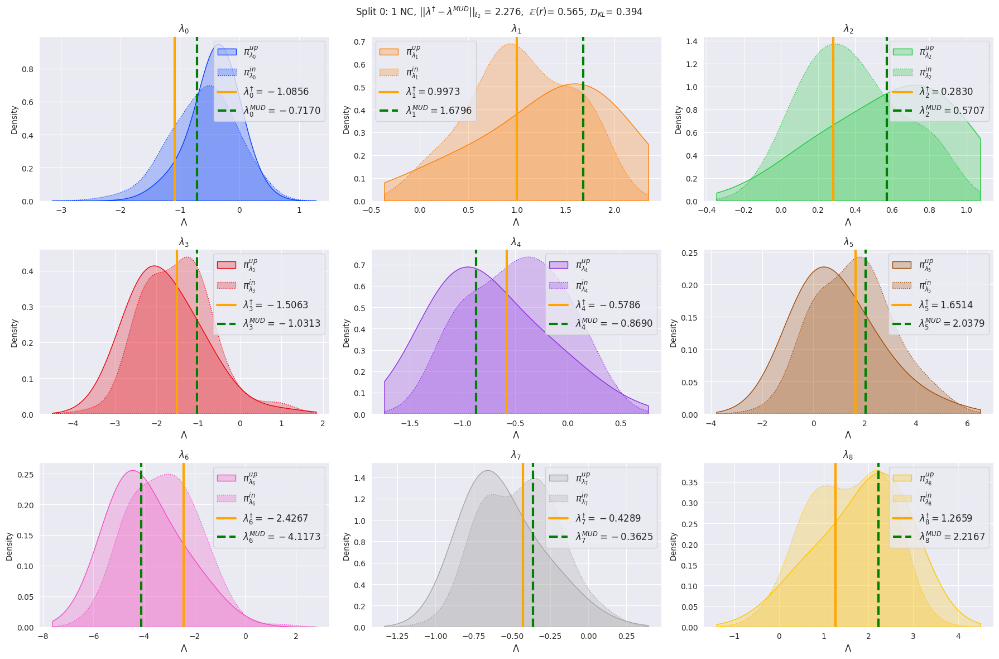

In [ ]:
heat_model2.probs[-1].param_density_plots(lam_true=heat_model2.lam_true)

In [ ]:
heat_model2.probs[-1].mud_point

array([-0.71698221,  1.67962815,  0.57066484, -1.031287  , -0.86897882,
        2.03787551, -4.11730066, -0.36246691,  2.21673642, -1.38841707])

<bound method Figure.tight_layout of <Figure size 1800x500 with 6 Axes>>

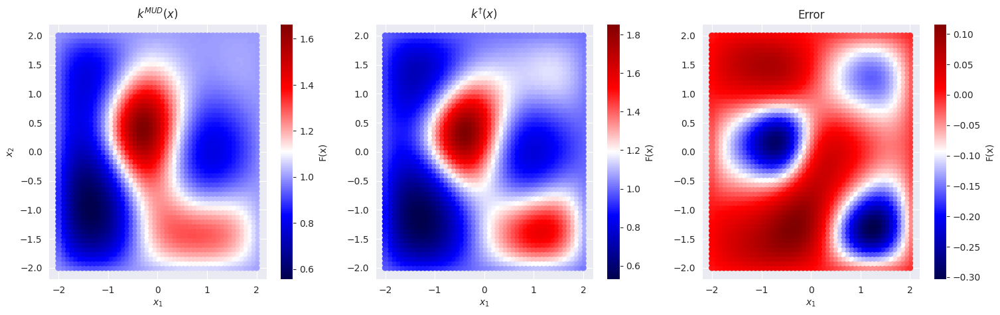

In [ ]:
iteration = 0
fig, ax = plt.subplots(1, 3, figsize=(18, 5))
heat_model2.plot_field(field=heat_model2.probs[iteration].mud_point, ax=ax[0])
ax[0].set_title("$k^{MUD}(x)$")
heat_model2.plot_field(field=heat_model2.lam_true, ax=ax[1])
ax[1].set_title("$k^{\dagger}(x)$")
ax[1].set_ylabel("")
heat_model2.plot_field(
    field=heat_model2.probs[iteration].mud_point, diff=heat_model2.lam_true, ax=ax[2]
)
ax[2].set_title("Error")
ax[2].set_ylabel("")
fig.tight_layout

<bound method Figure.tight_layout of <Figure size 1800x500 with 6 Axes>>

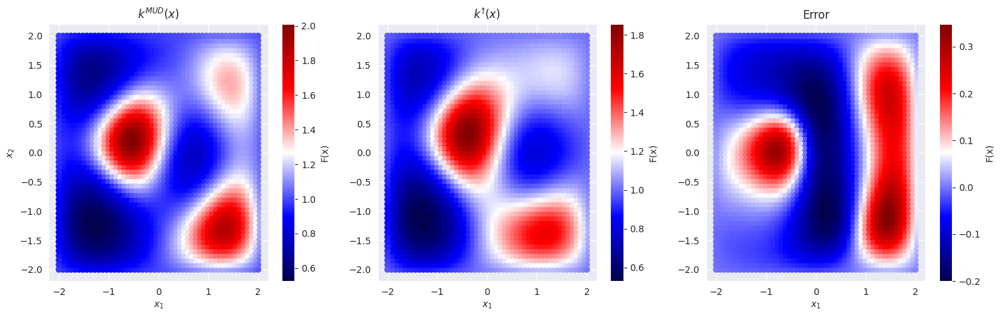

In [ ]:
iteration = -2
fig, ax = plt.subplots(1, 3, figsize=(18, 5))
heat_model2.plot_field(field=heat_model2.probs[iteration].mud_point, ax=ax[0])
ax[0].set_title("$k^{MUD}(x)$")
heat_model2.plot_field(field=heat_model2.lam_true, ax=ax[1])
ax[1].set_title("$k^{\dagger}(x)$")
ax[1].set_ylabel("")
heat_model2.plot_field(
    field=heat_model2.probs[iteration].mud_point, diff=heat_model2.lam_true, ax=ax[2]
)
ax[2].set_title("Error")
ax[2].set_ylabel("")
fig.tight_layout

<bound method Figure.tight_layout of <Figure size 1800x500 with 6 Axes>>

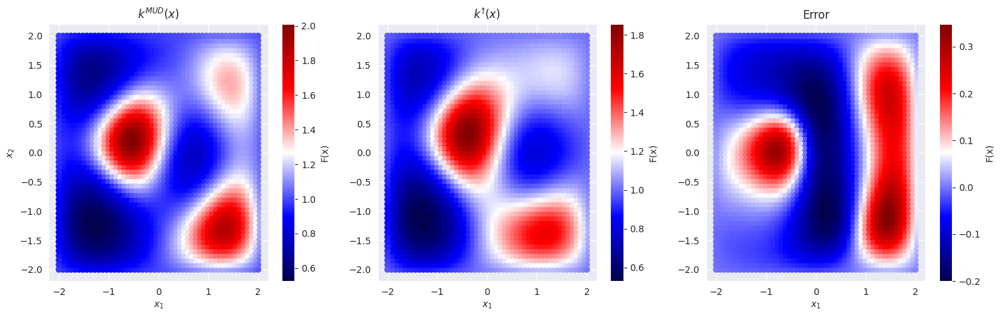

In [ ]:
iteration = -1
fig, ax = plt.subplots(1, 3, figsize=(18, 5))
heat_model2.plot_field(field=heat_model2.probs[iteration].mud_point, ax=ax[0])
ax[0].set_title("$k^{MUD}(x)$")
heat_model2.plot_field(field=heat_model2.lam_true, ax=ax[1])
ax[1].set_title("$k^{\dagger}(x)$")
ax[1].set_ylabel("")
heat_model2.plot_field(
    field=heat_model2.probs[iteration].mud_point, diff=heat_model2.lam_true, ax=ax[2]
)
ax[2].set_title("Error")
ax[2].set_ylabel("")
fig.tight_layout

## Residuals

Lets see the residual between observed and predicted for sample.
Note observed here has no noise yet.

In [ ]:
idx = 1
gif_fname = f"s_{idx}.gif"
heat_model.output_gif(samples.loc[f"s_{idx}"], gif_fname, diff=sol)
Image(url=gif_fname)

|███████████████████████████████████████▊⚠︎ (!) 200/201 [100%] in 8.9s (22.44/s)                                         
